In [1]:
import tensorflow as tf
from tensorflow import keras
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
from math import sqrt


In [2]:
# Loading the training dataset as a Pandas DataFrame
df=pd.read_csv('ETG1.csv')
df

,Unnamed: 0,_id,RealP2,RealP3,RealP1,Vrms1,ETG,date,index,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1
0,0,61d9cefbdd4ae07ecb861f64,8.5,25.8,3.2,260.3,1,2022-01-01 00:00:02,59338,258.4,239.3,284.1,342.7,0.138,0.350,260.2,0.036
1,1,61d9cefbdd4ae07ecb861f68,12.4,23.7,7.6,260.5,1,2022-01-01 00:00:07,59339,258.3,240.5,272.0,332.6,0.200,0.334,260.1,0.087
2,2,61d9cefbdd4ae07ecb861f6c,8.9,25.3,3.0,260.4,1,2022-01-01 00:00:13,59340,258.3,231.5,279.1,335.5,0.150,0.348,260.2,0.034
3,3,61d9cefbdd4ae07ecb861f70,11.0,22.3,7.0,260.5,1,2022-01-01 00:00:18,59341,258.3,238.4,272.7,343.8,0.179,0.314,260.2,0.078
4,4,61d9cefbdd4ae07ecb861f74,11.6,27.2,4.2,260.5,1,2022-01-01 00:00:23,59342,258.3,241.3,278.7,336.0,0.186,0.375,260.3,0.048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862352,862352,62141bb4dd4ae07ecbbab1b4,12.0,28.2,6.6,259.3,1,2022-02-22 00:09:40,921931,257.2,243.0,286.0,406.4,0.193,0.380,259.0,0.063
862353,862353,62141bb9dd4ae07ecbbab1b8,9.6,22.7,7.8,259.1,1,2022-02-22 00:09:45,921932,257.1,242.0,279.6,420.0,0.154,0.313,258.8,0.072
862354,862354,62141bbedd4ae07ecbbab1bc,13.1,27.9,7.7,259.2,1,2022-02-22 00:09:50,921933,257.1,248.1,283.3,409.5,0.206,0.380,258.9,0.072
862355,862355,62141bc3dd4ae07ecbbab1c0,7.6,24.4,8.4,259.1,1,2022-02-22 00:09:55,921934,257.4,249.8,281.6,433.6,0.119,0.335,258.7,0.074


In [3]:
#transformer la colonne de type objet en type  date 
timefmt = "%Y-%m-%d %H:%M:%S" 
df['date'] = pd.to_datetime(df['date'], format = timefmt, errors='coerce')
df

,Unnamed: 0,_id,RealP2,RealP3,RealP1,Vrms1,ETG,date,index,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1
0,0,61d9cefbdd4ae07ecb861f64,8.5,25.8,3.2,260.3,1,2022-01-01 00:00:02,59338,258.4,239.3,284.1,342.7,0.138,0.350,260.2,0.036
1,1,61d9cefbdd4ae07ecb861f68,12.4,23.7,7.6,260.5,1,2022-01-01 00:00:07,59339,258.3,240.5,272.0,332.6,0.200,0.334,260.1,0.087
2,2,61d9cefbdd4ae07ecb861f6c,8.9,25.3,3.0,260.4,1,2022-01-01 00:00:13,59340,258.3,231.5,279.1,335.5,0.150,0.348,260.2,0.034
3,3,61d9cefbdd4ae07ecb861f70,11.0,22.3,7.0,260.5,1,2022-01-01 00:00:18,59341,258.3,238.4,272.7,343.8,0.179,0.314,260.2,0.078
4,4,61d9cefbdd4ae07ecb861f74,11.6,27.2,4.2,260.5,1,2022-01-01 00:00:23,59342,258.3,241.3,278.7,336.0,0.186,0.375,260.3,0.048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862352,862352,62141bb4dd4ae07ecbbab1b4,12.0,28.2,6.6,259.3,1,2022-02-22 00:09:40,921931,257.2,243.0,286.0,406.4,0.193,0.380,259.0,0.063
862353,862353,62141bb9dd4ae07ecbbab1b8,9.6,22.7,7.8,259.1,1,2022-02-22 00:09:45,921932,257.1,242.0,279.6,420.0,0.154,0.313,258.8,0.072
862354,862354,62141bbedd4ae07ecbbab1bc,13.1,27.9,7.7,259.2,1,2022-02-22 00:09:50,921933,257.1,248.1,283.3,409.5,0.206,0.380,258.9,0.072
862355,862355,62141bc3dd4ae07ecbbab1c0,7.6,24.4,8.4,259.1,1,2022-02-22 00:09:55,921934,257.4,249.8,281.6,433.6,0.119,0.335,258.7,0.074


In [4]:
df = pd.read_csv('ETG1.csv', parse_dates = ['date'], index_col = ['date'])
df.head()

,Unnamed: 0,_id,RealP2,RealP3,RealP1,Vrms1,ETG,index,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1
date,,,,,,,,,,,,,,,,
2022-01-01 00:00:02,0,61d9cefbdd4ae07ecb861f64,8.5,25.8,3.2,260.3,1,59338,258.4,239.3,284.1,342.7,0.138,0.350,260.2,0.036
2022-01-01 00:00:07,1,61d9cefbdd4ae07ecb861f68,12.4,23.7,7.6,260.5,1,59339,258.3,240.5,272.0,332.6,0.200,0.334,260.1,0.087
2022-01-01 00:00:13,2,61d9cefbdd4ae07ecb861f6c,8.9,25.3,3.0,260.4,1,59340,258.3,231.5,279.1,335.5,0.150,0.348,260.2,0.034
2022-01-01 00:00:18,3,61d9cefbdd4ae07ecb861f70,11.0,22.3,7.0,260.5,1,59341,258.3,238.4,272.7,343.8,0.179,0.314,260.2,0.078
2022-01-01 00:00:23,4,61d9cefbdd4ae07ecb861f74,11.6,27.2,4.2,260.5,1,59342,258.3,241.3,278.7,336.0,0.186,0.375,260.3,0.048


In [5]:
df['Rtot']=df['RealP1']+df['RealP2']+df['RealP3']

# Data viz

In [6]:
#identify null values
df.isnull().sum()

Unnamed: 0    0
_id           0
RealP2        0
RealP3        0
RealP1        0
Vrms1         0
ETG           0
index         0
Vrms2         0
Irms2         0
Irms3         0
Irms1         0
PowerF2       0
PowerF3       0
Vrms3         0
PowerF1       0
Rtot          0
dtype: int64

<AxesSubplot:ylabel='date'>

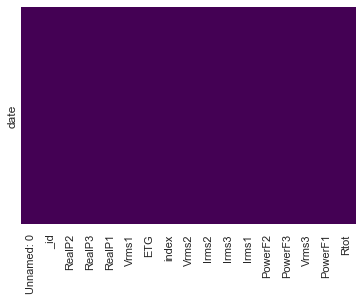

In [7]:
# chacking where null values 
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

## Statistical information

In [8]:
# Statistical info about data
df.describe()

,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,ETG,index,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1,Rtot
count,862357.00000,862357.000000,862357.000000,862357.000000,862357.000000,862357.0,862357.000000,862357.000000,862357.000000,862357.000000,862357.000000,862357.000000,862357.000000,862357.000000,862357.000000,862357.000000
mean,431178.00000,44.463618,62.509052,231.191072,257.731862,1.0,490699.807981,256.099656,535.587699,791.513162,1217.894135,0.267162,0.310634,257.909838,0.358240,338.163742
std,248941.16738,75.872497,111.125793,534.820219,1.922128,0.0,248978.166023,1.862584,578.072699,1363.891531,2038.410654,0.132004,0.069371,1.835225,0.350791,579.826838
min,0.00000,0.300000,0.000000,0.000000,248.600000,1.0,59338.000000,249.000000,218.700000,236.800000,243.800000,0.001000,0.000000,246.800000,0.000000,18.600000
25%,215589.00000,10.100000,22.800000,7.800000,256.300000,1.0,275113.000000,254.700000,242.000000,279.300000,397.900000,0.158000,0.304000,256.600000,0.076000,45.200000
50%,431178.00000,12.800000,24.800000,17.800000,257.800000,1.0,490717.000000,256.200000,248.500000,285.000000,454.300000,0.202000,0.328000,258.000000,0.153000,133.800000
75%,646767.00000,52.300000,27.000000,122.000000,259.200000,1.0,706306.000000,257.500000,581.400000,328.200000,641.900000,0.367000,0.356000,259.300000,0.794000,251.600000
max,862356.00000,793.800000,1268.700000,4566.900000,263.400000,1.0,921935.000000,262.200000,9345.200000,10857.700000,17949.200000,0.731000,0.606000,264.800000,0.997000,4912.800000


## viz de la variation de Rtot

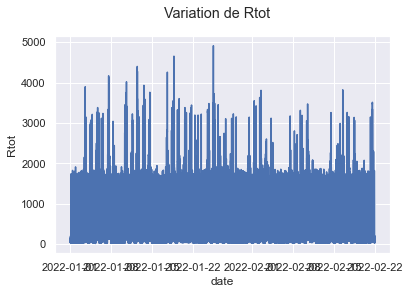

In [9]:
plt.xlabel('date')
plt.ylabel('Rtot')
plt.suptitle('Variation de Rtot')
plt.plot(df['Rtot'])

Text(0.5, 0.98, 'Distribution de Rtot')

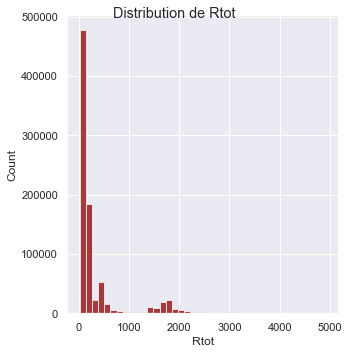

In [10]:
# is rtot has a normal distribution 
sns.displot(df['Rtot'].dropna(),kde=False,color='darkred',bins=40)
plt.suptitle('Distribution de Rtot')


In [11]:
## we need to split the data first and then apply feature
## Engineering
X_train, X_test, X_val= df[0:int(len(df)*0.60)], df[int(len(df)*0.60):int(len(df)*0.80)],df[int(len(df)*0.80):]

## Studying features

### Numerical features

In [12]:
# list of numerical variables
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
df[numerical_features].head()

Number of numerical variables:  16


,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,ETG,index,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1,Rtot
date,,,,,,,,,,,,,,,,
2022-01-01 00:00:02,0,8.5,25.8,3.2,260.3,1,59338,258.4,239.3,284.1,342.7,0.138,0.350,260.2,0.036,37.5
2022-01-01 00:00:07,1,12.4,23.7,7.6,260.5,1,59339,258.3,240.5,272.0,332.6,0.200,0.334,260.1,0.087,43.7
2022-01-01 00:00:13,2,8.9,25.3,3.0,260.4,1,59340,258.3,231.5,279.1,335.5,0.150,0.348,260.2,0.034,37.2
2022-01-01 00:00:18,3,11.0,22.3,7.0,260.5,1,59341,258.3,238.4,272.7,343.8,0.179,0.314,260.2,0.078,40.3
2022-01-01 00:00:23,4,11.6,27.2,4.2,260.5,1,59342,258.3,241.3,278.7,336.0,0.186,0.375,260.3,0.048,43.0


Numerical variables are usually of 2 type
 1. Continous variable and Discrete Variables

#### discrete features

In [13]:

discrete_feature=[feature for feature in numerical_features if len(df[feature].unique())<25 and feature not in ['_id']]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 1


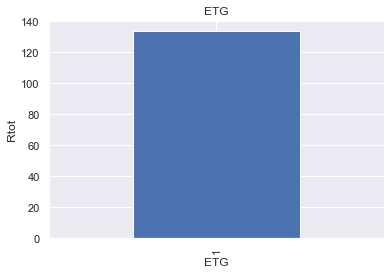

In [14]:
## Lets Find the realtionship between them and rtot

for feature in discrete_feature:
    data=df.copy()
    data.groupby(feature)['Rtot'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('Rtot')
    plt.title(feature)
    plt.show()

### Continuous features

In [15]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature+['Id']]
print("Continuous feature Count {}".format(len(continuous_feature)))

Continuous feature Count 15


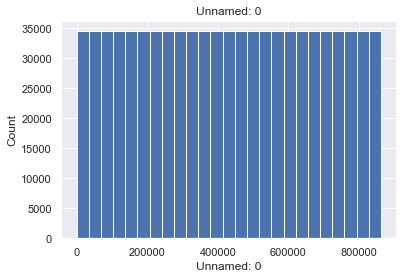

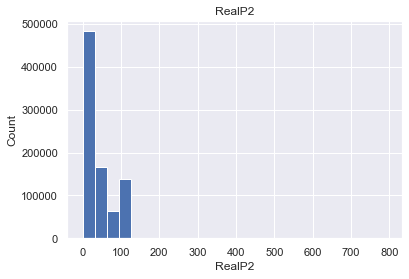

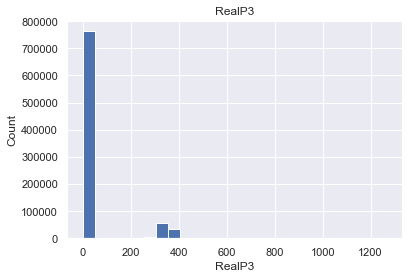

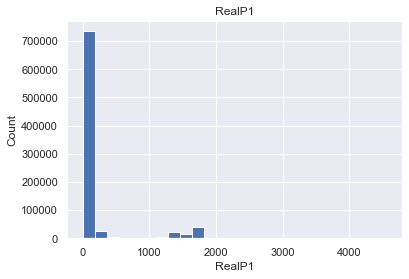

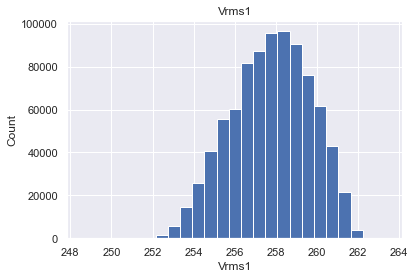

...

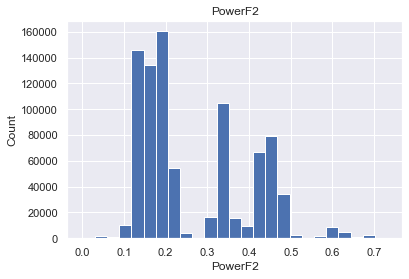

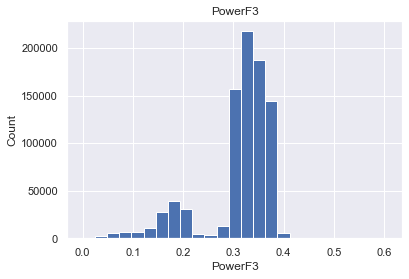

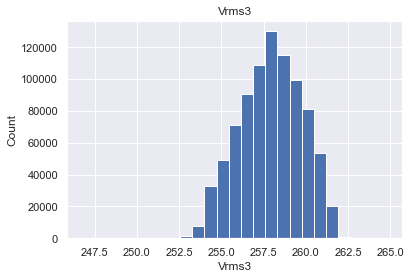

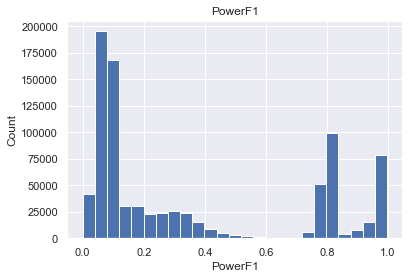

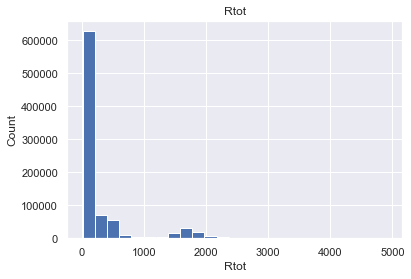

In [16]:
for feature in continuous_feature:
    data=df.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

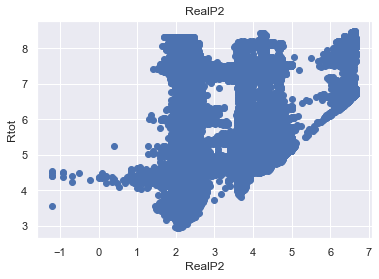

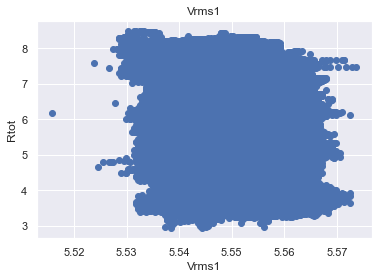

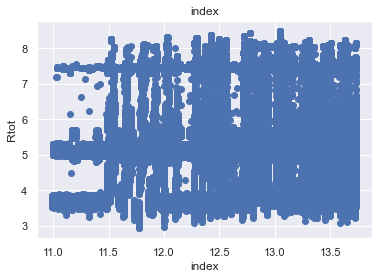

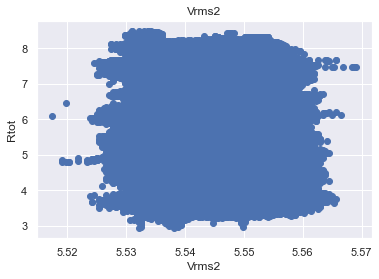

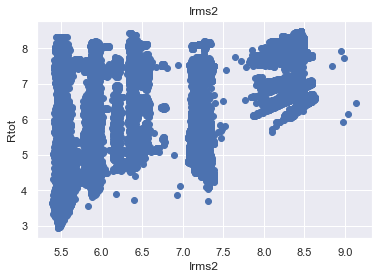

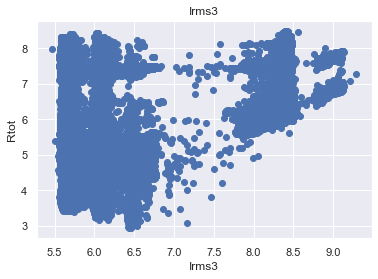

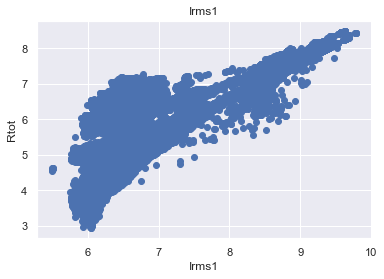

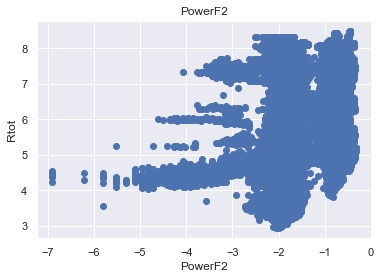

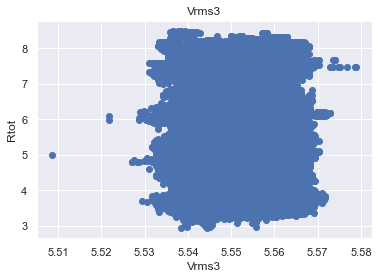

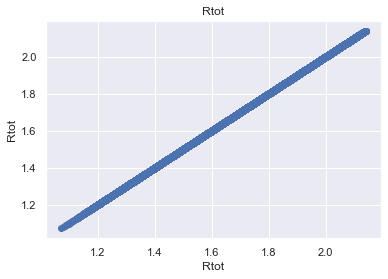

In [17]:
## We will be using logarithmic transformation


for feature in continuous_feature:
    data=df.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data['Rtot']=np.log(data['Rtot'])
        plt.scatter(data[feature],data['Rtot'])
        plt.xlabel(feature)
        plt.ylabel('Rtot')
        plt.title(feature)
        plt.show()

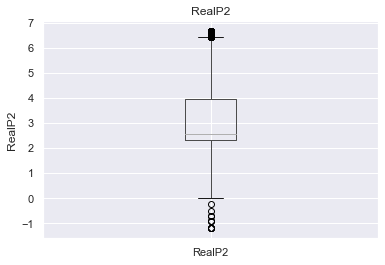

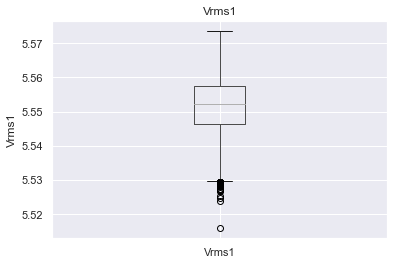

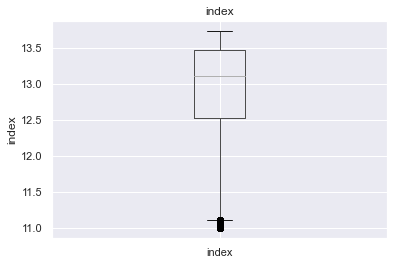

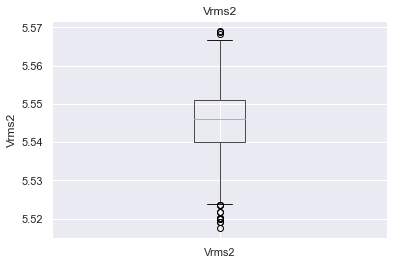

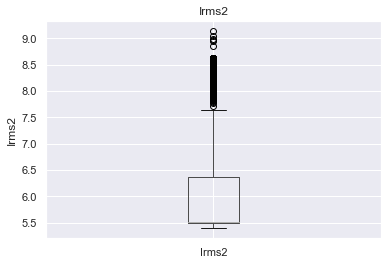

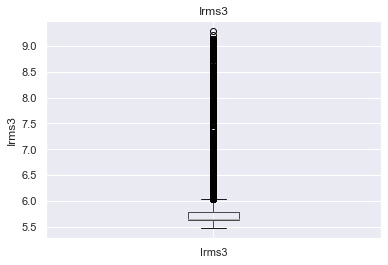

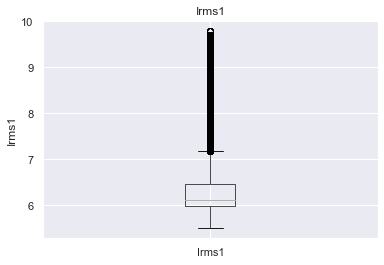

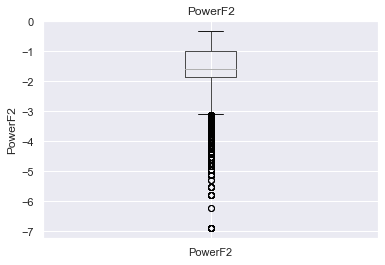

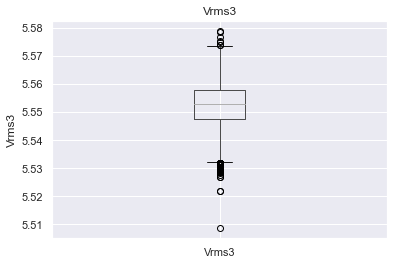

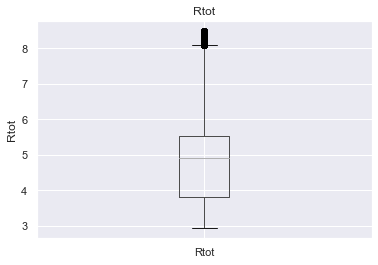

In [18]:
for feature in continuous_feature:
    data=df.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

### Categorical features

In [19]:
categorical_features=[feature for feature in df.columns if df[feature].dtypes=='O']
categorical_features

['_id']

In [20]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is _id and number of categories are 862357


In [21]:

for feature in categorical_features:
    labels_ordered=df.groupby([feature])['RealP1'].mean().sort_values().index
    labels_ordered={k:i for i,k in enumerate(labels_ordered,0)}
    df[feature]=df[feature].map(labels_ordered)

## Feature Selection

### Outliers

In [22]:
cols = ['Rtot','RealP2','RealP3'	,'RealP1'	,'Vrms1',	'ETG',	'index',	'Vrms2'	,'Irms2',	'Irms3'	,'Irms1',	'PowerF2',	'PowerF3'	,'Vrms3',	'PowerF1'] # The columns you want to search for outliers in
#X_train=X_train['Irms1', 'PowerF1', 'RealP1']
# Calculate quantiles and IQR
Q1 = X_train[cols].quantile(0.25) # Same as np.percentile but maps (0,1) and not (0,100)
Q3 = X_train[cols].quantile(0.75)
IQR = Q3 - Q1

# Return a boolean array of the rows with (any) non-outlier column values
condition = ~((X_train[cols] < (Q1 - 1.5 * IQR)) | (X_train[cols] > (Q3 + 1.5 * IQR))).any(axis=1)

# Filter our dataframe based on condition
filtered_X = X_train[condition]

### Scaling

In [23]:
feature_scale=[feature for feature in filtered_X.columns if feature not in ['_id','ETG','index']]

from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit(filtered_X[feature_scale])

MinMaxScaler()

In [24]:
x=filtered_X['Rtot']
x=pd.DataFrame(x)
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler()
sc.fit(x)

MinMaxScaler()

In [25]:
# transform the train , and add on the Id 
data = pd.concat([filtered_X[['_id','index']].reset_index(drop=False),
                    pd.DataFrame(scaler.transform(filtered_X[feature_scale]), columns=feature_scale)],
                    axis=1)
data.set_index(data['index'])


,date,_id,index,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1,Rtot
index,,,,,,,,,,,,,,,,,
59338,2022-01-01 00:00:02,61d9cefbdd4ae07ecb861f64,59338,0.000000,0.046053,0.555556,0.013451,0.743119,0.726415,0.038897,0.134281,0.039930,0.152513,0.673684,0.737864,0.039046,0.025379
59339,2022-01-01 00:00:07,61d9cefbdd4ae07ecb861f68,59339,0.000002,0.082707,0.432749,0.031946,0.761468,0.716981,0.041278,0.070563,0.025265,0.259965,0.589474,0.728155,0.094360,0.045814
59340,2022-01-01 00:00:13,61d9cefbdd4ae07ecb861f6c,59340,0.000004,0.049812,0.526316,0.012610,0.752294,0.716981,0.023417,0.107952,0.029476,0.173310,0.663158,0.737864,0.036876,0.024390
59341,2022-01-01 00:00:18,61d9cefbdd4ae07ecb861f70,59341,0.000006,0.069549,0.350877,0.029424,0.761468,0.716981,0.037111,0.074250,0.041528,0.223570,0.484211,0.737864,0.084599,0.034608
59342,2022-01-01 00:00:23,61d9cefbdd4ae07ecb861f74,59342,0.000008,0.075188,0.637427,0.017654,0.761468,0.716981,0.042866,0.105845,0.030202,0.235702,0.805263,0.747573,0.052061,0.043507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
576948,2022-02-01 04:58:32,61f8afe8dd4ae07ecba5a695,576948,0.999992,0.078008,0.497076,0.044977,0.651376,0.632075,0.104386,0.222222,0.098301,0.206239,0.505263,0.631068,0.117137,0.058009
576949,2022-02-01 04:58:38,61f8afeedd4ae07ecba5a699,576949,0.999994,0.070489,0.614035,0.031106,0.651376,0.632075,0.050804,0.150079,0.109917,0.218371,0.721053,0.650485,0.079176,0.051088
576950,2022-02-01 04:58:43,61f8aff3dd4ae07ecba5a69d,576950,0.999996,0.046053,0.421053,0.034889,0.614679,0.632075,0.052391,0.135334,0.119501,0.147314,0.510526,0.631068,0.087852,0.034608


In [26]:
# transform the test , and add on the Id 
datatest = pd.concat([X_test[['_id','index']].reset_index(drop=False),
                    pd.DataFrame(scaler.transform(X_test[feature_scale]), columns=feature_scale)],
                    axis=1)
datatest.set_index(datatest['index'])


,date,_id,index,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1,Rtot
index,,,,,,,,,,,,,,,,,
576953,2022-02-01 04:58:58,61f8b002dd4ae07ecba5a6a9,576953,1.000002,0.079887,0.479532,0.049601,0.614679,0.613208,0.057353,0.101106,0.117468,0.242634,0.626316,0.601942,0.124729,0.061305
576954,2022-02-01 04:59:04,61f8b008dd4ae07ecba5a6ad,576954,1.000004,0.064850,0.701754,0.023960,0.614679,0.613208,0.048621,0.134281,0.102076,0.204506,0.852632,0.640777,0.062907,0.048451
576955,2022-02-01 04:59:09,61f8b00ddd4ae07ecba5a6b1,576955,1.000006,0.049812,0.385965,0.041614,0.614679,0.622642,0.032348,0.109005,0.122695,0.168111,0.500000,0.611650,0.104121,0.039222
576956,2022-02-01 04:59:14,61f8b012dd4ae07ecba5a6b5,576956,1.000008,0.089286,0.695906,0.040353,0.605505,0.613208,0.061322,0.115850,0.103238,0.266898,0.878947,0.621359,0.104121,0.069545
576957,2022-02-01 04:59:19,61f8b017dd4ae07ecba5a6b9,576957,1.000010,0.037594,0.456140,0.034048,0.614679,0.622642,0.053185,0.126909,0.116161,0.121317,0.563158,0.611650,0.085683,0.032960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
749419,2022-02-11 14:32:21,62066565dd4ae07ecbb02aea,749419,1.333326,0.053571,0.321637,0.268600,0.366972,0.415094,0.036317,0.105845,0.601713,0.180243,0.431579,0.446602,0.370933,0.214898
749420,2022-02-11 14:32:26,6206656add4ae07ecbb02aee,749420,1.333328,0.075188,0.748538,0.238756,0.394495,0.433962,0.059933,0.154292,0.552345,0.228769,0.894737,0.475728,0.345987,0.223138
749421,2022-02-11 14:32:31,6206656fdd4ae07ecbb02af2,749421,1.333329,0.056391,0.356725,0.291719,0.385321,0.443396,0.062512,0.121643,0.641498,0.171577,0.457895,0.475728,0.388286,0.235992


In [27]:
# transform the validation , and add on the Id 
dataval = pd.concat([X_val[['_id','index']].reset_index(drop=False),
                    pd.DataFrame(scaler.transform(X_val[feature_scale]), columns=feature_scale)],
                    axis=1)
dataval.set_index(dataval['index'])


,date,_id,index,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1,Rtot
index,,,,,,,,,,,,,,,,,
749424,2022-02-11 14:32:47,6206657fdd4ae07ecbb02afe,749424,1.333335,0.062030,0.584795,0.283312,0.376147,0.443396,0.037111,0.161137,0.638594,0.202773,0.689474,0.475728,0.377440,0.244232
749425,2022-02-11 14:32:52,62066584dd4ae07ecbb02b02,749425,1.333337,0.079887,0.426901,0.240858,0.394495,0.452830,0.051399,0.107425,0.531000,0.246101,0.557895,0.485437,0.355748,0.208306
749426,2022-02-11 14:32:57,62066589dd4ae07ecbb02b06,749426,1.333339,0.052632,0.497076,0.216898,0.385321,0.433962,0.034134,0.173249,0.534340,0.176776,0.568421,0.485437,0.319957,0.183916
749427,2022-02-11 14:33:02,6206658edd4ae07ecbb02b0a,749427,1.333341,0.088346,0.543860,0.247583,0.385321,0.443396,0.052987,0.105319,0.540148,0.272097,0.705263,0.475728,0.362256,0.223138
749428,2022-02-11 14:33:07,62066594dd4ae07ecbb02b0e,749428,1.333343,0.047932,0.473684,0.241278,0.385321,0.452830,0.048422,0.153239,0.557137,0.155979,0.563158,0.475728,0.347072,0.200066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
921931,2022-02-22 00:09:40,62141bb4dd4ae07ecbbab1b4,921931,1.666661,0.078947,0.695906,0.027743,0.651376,0.613208,0.046239,0.144286,0.132423,0.247834,0.831579,0.621359,0.068330,0.056032
921932,2022-02-22 00:09:45,62141bb9dd4ae07ecbbab1b8,921932,1.666663,0.056391,0.374269,0.032787,0.633028,0.603774,0.044255,0.110585,0.152171,0.180243,0.478947,0.601942,0.078091,0.033949
921933,2022-02-22 00:09:50,62141bbedd4ae07ecbbab1bc,921933,1.666665,0.089286,0.678363,0.032367,0.642202,0.603774,0.056360,0.130068,0.136925,0.270364,0.831579,0.611650,0.078091,0.062294


<AxesSubplot:>

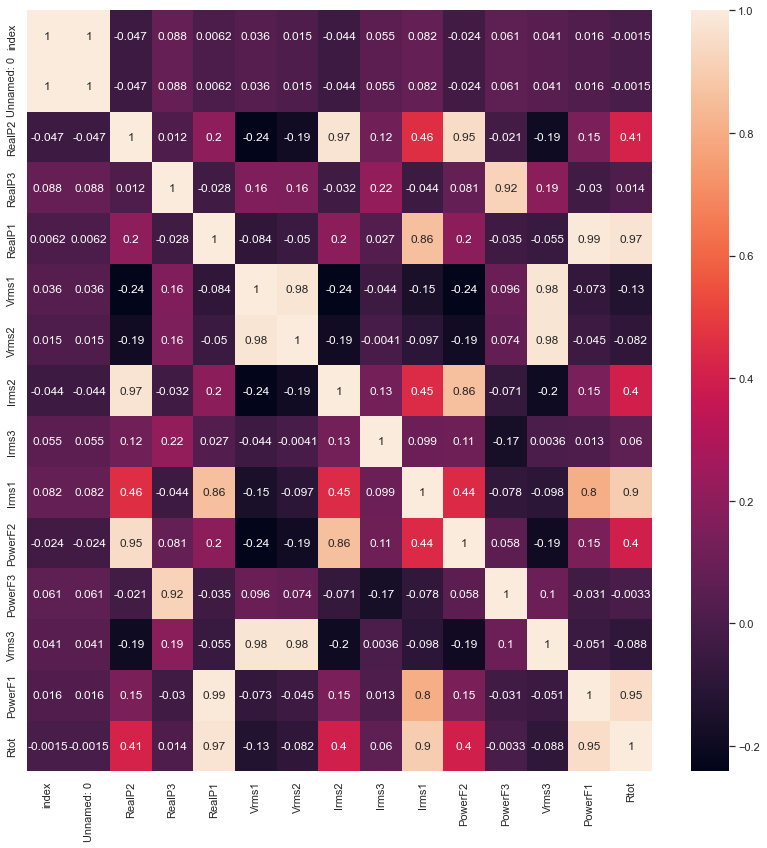

In [104]:
f,ax = plt.subplots(figsize=(14, 14))

sns.heatmap(data.corr(),annot=True)

<AxesSubplot:>

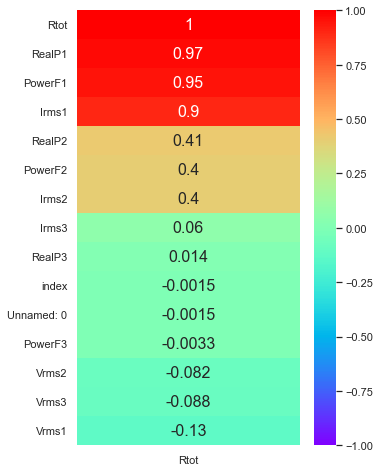

In [105]:
top_features = data.corr()[['Rtot']].sort_values(by=['Rtot'],ascending=False).head(30)
plt.figure(figsize=(5,8))
sns.heatmap(top_features,cmap='rainbow',annot=True,annot_kws={"size": 16},vmin=-1)

In [50]:
# Create input X and output y datasets for training and test
# Don't forget to drop 'Id' column (it is not a feature!)
# Create input X and output y datasets for training and test
# Don't forget to drop 'Id' column (it is not a feature!)

X = data.drop(['_id','Rtot','date'],axis=1)
y= data['Rtot']
xtest= datatest.drop(['_id','date','index'],axis=1)
display(X)
display(y)
display(xtest)

,index,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1
0,59338,0.000000,0.046053,0.555556,0.013451,0.743119,0.726415,0.038897,0.134281,0.039930,0.152513,0.673684,0.737864,0.039046
1,59339,0.000002,0.082707,0.432749,0.031946,0.761468,0.716981,0.041278,0.070563,0.025265,0.259965,0.589474,0.728155,0.094360
2,59340,0.000004,0.049812,0.526316,0.012610,0.752294,0.716981,0.023417,0.107952,0.029476,0.173310,0.663158,0.737864,0.036876
3,59341,0.000006,0.069549,0.350877,0.029424,0.761468,0.716981,0.037111,0.074250,0.041528,0.223570,0.484211,0.737864,0.084599
4,59342,0.000008,0.075188,0.637427,0.017654,0.761468,0.716981,0.042866,0.105845,0.030202,0.235702,0.805263,0.747573,0.052061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252713,576948,0.999992,0.078008,0.497076,0.044977,0.651376,0.632075,0.104386,0.222222,0.098301,0.206239,0.505263,0.631068,0.117137
252714,576949,0.999994,0.070489,0.614035,0.031106,0.651376,0.632075,0.050804,0.150079,0.109917,0.218371,0.721053,0.650485,0.079176
252715,576950,0.999996,0.046053,0.421053,0.034889,0.614679,0.632075,0.052391,0.135334,0.119501,0.147314,0.510526,0.631068,0.087852
252716,576951,0.999998,0.091165,0.514620,0.039512,0.623853,0.613208,0.045247,0.140600,0.103093,0.282496,0.621053,0.621359,0.101952


0         0.025379
1         0.045814
2         0.024390
3         0.034608
4         0.043507
            ...   
252713    0.058009
252714    0.051088
252715    0.034608
252716    0.059328
252717    0.038563
Name: Rtot, Length: 252718, dtype: float64

,Unnamed: 0,RealP2,RealP3,RealP1,Vrms1,Vrms2,Irms2,Irms3,Irms1,PowerF2,PowerF3,Vrms3,PowerF1,Rtot
0,1.000002,0.079887,0.479532,0.049601,0.614679,0.613208,0.057353,0.101106,0.117468,0.242634,0.626316,0.601942,0.124729,0.061305
1,1.000004,0.064850,0.701754,0.023960,0.614679,0.613208,0.048621,0.134281,0.102076,0.204506,0.852632,0.640777,0.062907,0.048451
2,1.000006,0.049812,0.385965,0.041614,0.614679,0.622642,0.032348,0.109005,0.122695,0.168111,0.500000,0.611650,0.104121,0.039222
3,1.000008,0.089286,0.695906,0.040353,0.605505,0.613208,0.061322,0.115850,0.103238,0.266898,0.878947,0.621359,0.104121,0.069545
4,1.000010,0.037594,0.456140,0.034048,0.614679,0.622642,0.053185,0.126909,0.116161,0.121317,0.563158,0.611650,0.085683,0.032960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172466,1.333326,0.053571,0.321637,0.268600,0.366972,0.415094,0.036317,0.105845,0.601713,0.180243,0.431579,0.446602,0.370933,0.214898
172467,1.333328,0.075188,0.748538,0.238756,0.394495,0.433962,0.059933,0.154292,0.552345,0.228769,0.894737,0.475728,0.345987,0.223138
172468,1.333329,0.056391,0.356725,0.291719,0.385321,0.443396,0.062512,0.121643,0.641498,0.171577,0.457895,0.475728,0.388286,0.235992
172469,1.333331,0.068609,0.666667,0.284994,0.394495,0.452830,0.058345,0.161664,0.643822,0.211438,0.789474,0.475728,0.377440,0.252472


In [31]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.001, random_state=0)) # remember to set the seed, the random state in this function
feature_sel_model.fit(X, y)

C:\Users\Nada Najari\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.230e+00, tolerance: 6.905e-01
  model = cd_fast.enet_coordinate_descent(


SelectFromModel(estimator=Lasso(alpha=0.001, random_state=0))

In [32]:
feature_sel_model.get_support()

array([False, False, False, False,  True, False, False,  True, False,
        True,  True, False, False,  True])

In [33]:
# let's print the number of total and selected features

# this is how we can make a list of the selected features
selected_feat = X.columns[(feature_sel_model.get_support())]

# let's print some stats
print('total features: {}'.format((X.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
#print('features with coefficients shrank to zero: {}'.format(np.sum(sel_.estimator_.coef_ == 0)))

total features: 14
selected features: 5


In [34]:
selected_feat

Index(['RealP1', 'Irms2', 'Irms1', 'PowerF2', 'PowerF1'], dtype='object')

In [35]:
X_train=X[selected_feat]

In [36]:
X_train=np.array(X_train)
y_train=np.array(y)
X_test=np.array(xtest)

In [37]:
y_train

array([0.02537904, 0.04581411, 0.02439024, ..., 0.03460778, 0.05932762,
       0.03856295])

KNeighborsRegressor(leaf_size=1, n_neighbors=4, weights='distance')
  Train R2 =  1.000
  Train RMSE =  9.116E-06
  Train MAPE =  0.000
K-fold CV average score: 1.00


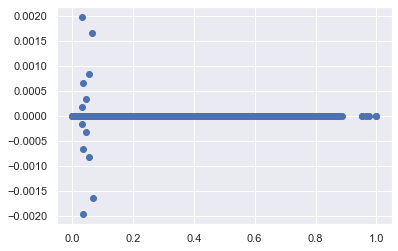

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.25, random_state=40)
model = KNeighborsRegressor(leaf_size=1, n_neighbors=4, weights='distance')
#model = SVR(kernel='rbf', C=1e3, gamma = 0.5, epsilon = 0.01)
model

# Model training
model.fit(X_train,y_train)
#model.score(X_test,y_test)
# Model predictions on the trained data
y_train_pred = model.predict(X_train)
# Model evaluations on the training data
print(model)
print('  Train R2 = ', '%.3f' %r2_score(y_train, y_train_pred))
print('  Train RMSE = ', '%.3E' %np.sqrt(mean_squared_error(y_train,y_train_pred)))
print('  Train MAPE = ', '%.3f' %mean_absolute_percentage_error(y_train,y_train_pred))
# Residuals plot
plt.scatter(y_train, y_train_pred-y_train)
from sklearn.model_selection import cross_val_score
from sklearn import model_selection
kfold = model_selection.KFold(n_splits=10, shuffle=True)
kf_cv_scores = cross_val_score(model, X_train, y_train, cv=kfold )
print("K-fold CV average score: %.2f" % kf_cv_scores.mean())


In [39]:
# Make predictions from the input test
y_test_pred =model.predict(X_test)

In [40]:
rmse = sqrt(mean_squared_error(y_test, y_test_pred))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.005


In [72]:
xtest11=xtest[selected_feat]
Xtest=xtest['Rtot']

In [95]:
xtest=sc.inverse_transform(xtest)

In [99]:
xtest

array([[333.20058638,  54.03778195, 175.29005848, ..., 212.42912621,
         67.64273319,  48.4       ],
       [333.20117276,  49.47537594, 242.7122807 , ..., 224.21165049,
         48.88590022,  44.5       ],
       [333.20175914,  44.91296992, 146.90175439, ..., 215.37475728,
         61.39045553,  41.7       ],
       ...,
       [434.33216058,  46.90902256, 138.03040936, ..., 174.13592233,
        147.60607375, 101.4       ],
       [434.33274695,  50.61597744, 232.06666667, ..., 174.13592233,
        144.3154013 , 106.4       ],
       [434.33333333,  50.90112782, 166.41871345, ..., 174.13592233,
        148.26420824, 105.1       ]])

In [73]:
ytest=model.predict(xtest11)

C:\Users\Nada Najari\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsRegressor was fitted without feature names
  warnings.warn(


In [74]:
ytest

array([0.06032883, 0.03891746, 0.03990538, ..., 0.24740159, 0.24925296,
       0.25186322])

In [75]:
ytest=ytest.reshape(-1,1)

In [87]:
xx=xtest.drop(['Rtot'],axis=1)

In [88]:
xx=pd.concat([xx,pd.DataFrame(ytest)],axis=1)
#xx=pd.concat([datatest['date'],pd.DataFrame(yhat)],axis=1)

In [89]:

ytest= scaler.inverse_transform(xx)

In [90]:
ytest

array([[5.17414000e+05, 1.21000000e+01, 2.45000000e+01, ...,
        2.58800000e+02, 1.15000000e-01, 4.81037667e+01],
       [5.17415000e+05, 1.05000000e+01, 2.83000000e+01, ...,
        2.59200000e+02, 5.80000000e-02, 4.16075578e+01],
       [5.17416000e+05, 8.90000000e+00, 2.29000000e+01, ...,
        2.58900000e+02, 9.60000000e-02, 4.19072912e+01],
       ...,
       [6.89882000e+05, 9.60000000e+00, 2.24000000e+01, ...,
        2.57500000e+02, 3.58000000e-01, 1.04861644e+02],
       [6.89883000e+05, 1.09000000e+01, 2.77000000e+01, ...,
        2.57500000e+02, 3.48000000e-01, 1.05423348e+02],
       [6.89884000e+05, 1.10000000e+01, 2.40000000e+01, ...,
        2.57500000e+02, 3.60000000e-01, 1.06215299e+02]])

In [51]:

#xtest=xtest.values.reshape(-1,1)
#xtest1=
xtest1= scaler.inverse_transform(xtest)

In [54]:
xtest1

array([[5.17414e+05, 1.21000e+01, 2.45000e+01, ..., 2.58800e+02,
        1.15000e-01, 4.84000e+01],
       [5.17415e+05, 1.05000e+01, 2.83000e+01, ..., 2.59200e+02,
        5.80000e-02, 4.45000e+01],
       [5.17416e+05, 8.90000e+00, 2.29000e+01, ..., 2.58900e+02,
        9.60000e-02, 4.17000e+01],
       ...,
       [6.89882e+05, 9.60000e+00, 2.24000e+01, ..., 2.57500e+02,
        3.58000e-01, 1.01400e+02],
       [6.89883e+05, 1.09000e+01, 2.77000e+01, ..., 2.57500e+02,
        3.48000e-01, 1.06400e+02],
       [6.89884e+05, 1.10000e+01, 2.40000e+01, ..., 2.57500e+02,
        3.60000e-01, 1.05100e+02]])

In [91]:
#xtest=xtest1(14)
n=0
for i in range(172471):
    if np.abs(ytest[i][13]-xtest1[i][13])>100:
        n=n+1
        print(xtest1[i][13],'Surconsommation')
    else:
        print(xtest1[i][13],'normal')
print(n)

48.39999999999999 normal
44.5 normal
41.7 normal
50.9 normal
39.8 normal
49.5 normal
40.4 normal
47.300000000000004 normal
39.4 normal
48.7 normal
41.2 normal
45.6 normal
41.1 normal
47.400000000000006 normal
42.3 normal
46.099999999999994 normal
47.8 normal
39.5 normal
49.6 normal
44.89999999999999 normal
40.6 normal
51.00000000000001 normal
39.9 normal
48.1 normal
40.8 normal
45.5 normal
45.5 normal
42.4 normal
49.1 normal
41.3 normal
48.0 normal
45.8 normal
42.699999999999996 normal
51.20000000000001 normal
40.7 normal
47.599999999999994 normal
43.1 normal
42.49999999999999 normal
46.7 normal
39.7 normal
47.2 normal
39.9 normal
51.4 normal
41.400000000000006 normal
50.1 normal
38.79999999999999 normal
49.3 normal
40.2 normal
49.4 normal
40.8 normal
48.0 normal
40.2 normal
47.6 normal
39.1 normal
48.1 normal
43.5 normal
42.2 normal
49.5 normal
40.900000000000006 normal
44.89999999999999 normal
47.300000000000004 normal
38.900000000000006 normal
49.1 normal
45.0 normal
37.1 normal
49.

1985.5999999999997 Surconsommation
1991.6000000000001 Surconsommation
1979.1000000000001 Surconsommation
1982.3000000000002 Surconsommation
1991.3000000000002 Surconsommation
1979.1000000000001 Surconsommation
1985.2 Surconsommation
1992.0000000000002 Surconsommation
1989.5 Surconsommation
1988.9 Surconsommation
1989.0 Surconsommation
1980.6 Surconsommation
1993.5 Surconsommation
1978.8 Surconsommation
1991.6999999999998 Surconsommation
1980.0 Surconsommation
1987.2 Surconsommation
1981.3000000000002 Surconsommation
1988.0 Surconsommation
1984.0 Surconsommation
1984.1000000000001 Surconsommation
1984.8 Surconsommation
1985.9 Surconsommation
1987.0 Surconsommation
1988.3999999999999 Surconsommation
1978.1 Surconsommation
1986.3 Surconsommation
1976.7000000000003 Surconsommation
1994.4 Surconsommation
1981.2000000000003 Surconsommation
1989.1000000000001 Surconsommation
1976.5 Surconsommation
1986.5 Surconsommation
1978.2000000000003 Surconsommation
1984.1 Surconsommation
1993.3999999999

540.5999999999999 Surconsommation
554.2000000000002 Surconsommation
542.9 Surconsommation
550.0 Surconsommation
562.0 Surconsommation
546.7 Surconsommation
546.6000000000001 Surconsommation
550.6 Surconsommation
554.2000000000002 Surconsommation
541.7 Surconsommation
200.8 normal
193.59999999999997 normal
196.9 normal
185.4 normal
191.9 normal
192.4 normal
187.60000000000002 normal
198.1 normal
191.8 normal
192.49999999999997 normal
199.4 normal
183.5 normal
195.70000000000002 normal
199.20000000000002 normal
205.29999999999998 normal
189.1 normal
194.6 normal
188.8 normal
191.79999999999998 normal
197.0 normal
184.9 normal
196.9 normal
198.1 normal
190.39999999999998 normal
199.70000000000002 normal
202.2 normal
201.6 normal
197.8 normal
203.19999999999996 normal
206.20000000000002 normal
197.1 normal
207.29999999999998 normal
200.79999999999998 normal
456.1 Surconsommation
559.4000000000001 Surconsommation
545.6 Surconsommation
530.7 Surconsommation
539.3000000000001 Surconsommation


386.8 Surconsommation
394.5000000000001 Surconsommation
371.1 Surconsommation
404.1000000000001 Surconsommation
421.7 Surconsommation
420.1 Surconsommation
428.20000000000016 Surconsommation
436.20000000000005 Surconsommation
432.19999999999993 Surconsommation
439.70000000000005 Surconsommation
429.5 Surconsommation
435.30000000000007 Surconsommation
439.2000000000001 Surconsommation
438.7 Surconsommation
444.90000000000003 Surconsommation
435.50000000000006 Surconsommation
444.00000000000006 Surconsommation
423.30000000000007 Surconsommation
421.5 Surconsommation
413.0 Surconsommation
394.30000000000007 Surconsommation
388.3 Surconsommation
386.8 Surconsommation
381.2000000000001 Surconsommation
392.5 Surconsommation
405.4 Surconsommation
420.8 Surconsommation
424.00000000000006 Surconsommation
418.8 Surconsommation
437.3 Surconsommation
440.8 Surconsommation
438.1000000000001 Surconsommation
438.9 Surconsommation
432.60000000000014 Surconsommation
448.1000000000001 Surconsommation
44

2490.8 Surconsommation
2484.2 Surconsommation
2480.6 Surconsommation
2488.1000000000004 Surconsommation
2486.6000000000004 Surconsommation
2495.9000000000005 Surconsommation
2487.5 Surconsommation
2489.7 Surconsommation
2486.5000000000005 Surconsommation
2489.8 Surconsommation
2498.0 Surconsommation
2480.1 Surconsommation
2491.1 Surconsommation
2495.2 Surconsommation
2493.6000000000004 Surconsommation
2498.8 Surconsommation
2488.5 Surconsommation
2495.0 Surconsommation
2501.1 Surconsommation
2493.5 Surconsommation
2503.4 Surconsommation
2493.0 Surconsommation
2504.2000000000003 Surconsommation
2498.7 Surconsommation
2500.2 Surconsommation
2505.8 Surconsommation
2503.2 Surconsommation
2506.3999999999996 Surconsommation
2513.3 Surconsommation
2524.6 Surconsommation
2502.0 Surconsommation
2510.9 Surconsommation
2505.5 Surconsommation
2511.7 Surconsommation
2504.5 Surconsommation
2511.2000000000003 Surconsommation
2503.8 Surconsommation
2511.0 Surconsommation
2497.2999999999993 Surconsomma

1847.5 Surconsommation
1846.3999999999999 Surconsommation
1853.0 Surconsommation
1846.7 Surconsommation
1843.6 Surconsommation
1847.8000000000002 Surconsommation
1848.7 Surconsommation
1852.0 Surconsommation
1851.5 Surconsommation
679.5000000000001 Surconsommation
174.5 normal
170.9 normal
181.60000000000002 normal
169.9 normal
180.5 normal
168.60000000000002 normal
177.39999999999998 normal
175.5 normal
167.8 normal
179.2 normal
172.4 normal
170.20000000000002 normal
181.1 normal
164.8 normal
177.00000000000003 normal
168.8 normal
179.29999999999998 normal
171.09999999999997 normal
168.79999999999998 normal
169.2 normal
180.2 normal
177.99999999999994 normal
168.5 normal
169.99999999999997 normal
173.20000000000002 normal
169.4 normal
174.10000000000002 normal
177.1 normal
167.9 normal
176.4 normal
175.20000000000002 normal
171.0 normal
180.99999999999994 normal
171.99999999999997 normal
168.99999999999997 normal
168.60000000000002 normal
170.2 normal
179.5 normal
167.9 normal
173.299

142.9 normal
140.2 normal
141.6 normal
140.7 normal
143.4 normal
143.2 normal
141.0 normal
142.3 normal
141.6 normal
139.79999999999998 normal
141.1 normal
142.1 normal
141.9 normal
142.1 normal
142.5 normal
143.29999999999998 normal
141.79999999999998 normal
141.3 normal
141.5 normal
141.3 normal
140.8 normal
141.8 normal
141.5 normal
140.4 normal
142.79999999999998 normal
143.3 normal
142.0 normal
141.60000000000002 normal
141.9 normal
141.8 normal
140.9 normal
141.5 normal
141.9 normal
141.3 normal
139.5 normal
140.3 normal
141.3 normal
141.3 normal
141.2 normal
142.5 normal
143.0 normal
142.0 normal
141.8 normal
141.3 normal
142.4 normal
141.8 normal
143.5 normal
141.9 normal
141.9 normal
141.20000000000002 normal
142.3 normal
138.70000000000002 normal
140.7 normal
143.5 normal
141.0 normal
141.8 normal
140.2 normal
141.6 normal
140.8 normal
142.5 normal
143.0 normal
142.10000000000002 normal
140.8 normal
142.5 normal
141.9 normal
141.6 normal
142.39999999999998 normal
140.5 normal

146.6 normal
145.8 normal
145.9 normal
149.6 normal
145.0 normal
147.7 normal
145.5 normal
145.4 normal
144.9 normal
145.7 normal
144.9 normal
146.0 normal
1807.1 Surconsommation
1787.8999999999999 Surconsommation
1782.0 Surconsommation
1779.1 Surconsommation
1780.1999999999998 Surconsommation
1775.8 Surconsommation
1778.7 Surconsommation
1773.0 Surconsommation
1775.3 Surconsommation
1775.2 Surconsommation
1777.3 Surconsommation
1781.0 Surconsommation
1778.0000000000002 Surconsommation
1779.1 Surconsommation
1782.2 Surconsommation
1778.2 Surconsommation
1779.5 Surconsommation
1780.6000000000001 Surconsommation
1780.0 Surconsommation
1776.4 Surconsommation
1779.6 Surconsommation
1779.7999999999997 Surconsommation
1776.4 Surconsommation
1773.3999999999996 Surconsommation
1773.8999999999999 Surconsommation
1778.5 Surconsommation
1780.6999999999998 Surconsommation
1778.2 Surconsommation
1778.6000000000001 Surconsommation
1780.4999999999998 Surconsommation
1780.1000000000001 Surconsommation

48.7 normal
41.5 normal
49.2 normal
42.1 normal
46.4 normal
44.5 normal
45.2 normal
45.400000000000006 normal
44.099999999999994 normal
44.599999999999994 normal
46.5 normal
42.400000000000006 normal
48.5 normal
40.8 normal
50.9 normal
42.1 normal
45.8 normal
48.400000000000006 normal
40.900000000000006 normal
47.50000000000001 normal
46.6 normal
41.5 normal
47.4 normal
40.300000000000004 normal
48.7 normal
39.199999999999996 normal
50.0 normal
40.400000000000006 normal
49.0 normal
40.8 normal
49.0 normal
40.2 normal
51.89999999999999 normal
40.900000000000006 normal
49.2 normal
42.3 normal
41.3 normal
48.699999999999996 normal
51.900000000000006 normal
39.599999999999994 normal
40.0 normal
44.2 normal
49.7 normal
43.900000000000006 normal
40.400000000000006 normal
46.7 normal
46.3 normal
39.4 normal
47.0 normal
42.0 normal
43.2 normal
47.6 normal
39.3 normal
47.6 normal
42.49999999999999 normal
42.6 normal
46.5 normal
41.1 normal
48.2 normal
40.300000000000004 normal
46.1 normal
45.4 

39.900000000000006 normal
47.0 normal
46.599999999999994 normal
40.1 normal
49.1 normal
42.699999999999996 normal
42.49999999999999 normal
47.2 normal
39.7 normal
48.2 normal
42.199999999999996 normal
42.599999999999994 normal
48.0 normal
37.9 normal
49.7 normal
40.9 normal
43.2 normal
49.099999999999994 normal
41.0 normal
45.400000000000006 normal
48.8 normal
38.79999999999999 normal
47.09999999999999 normal
45.8 normal
40.5 normal
48.5 normal
38.5 normal
46.5 normal
44.7 normal
42.699999999999996 normal
48.2 normal
39.900000000000006 normal
47.2 normal
39.3 normal
46.8 normal
40.599999999999994 normal
48.2 normal
40.8 normal
45.0 normal
43.6 normal
45.7 normal
44.1 normal
46.5 normal
40.900000000000006 normal
46.699999999999996 normal
42.2 normal
47.50000000000001 normal
41.8 normal
47.1 normal
41.39999999999999 normal
46.5 normal
39.6 normal
49.6 normal
41.39999999999999 normal
47.4 normal
41.1 normal
46.4 normal
41.0 normal
50.0 normal
41.0 normal
47.900000000000006 normal
39.3 nor

45.7 normal
48.7 normal
40.7 normal
48.1 normal
42.699999999999996 normal
42.9 normal
44.5 normal
44.3 normal
42.9 normal
46.5 normal
38.599999999999994 normal
49.400000000000006 normal
39.5 normal
48.900000000000006 normal
40.6 normal
43.800000000000004 normal
46.8 normal
41.3 normal
49.4 normal
39.199999999999996 normal
46.9 normal
42.9 normal
44.2 normal
46.7 normal
42.699999999999996 normal
47.300000000000004 normal
43.0 normal
45.599999999999994 normal
46.599999999999994 normal
40.8 normal
48.2 normal
41.3 normal
49.8 normal
37.5 normal
48.7 normal
40.5 normal
46.5 normal
47.0 normal
39.6 normal
47.09999999999999 normal
42.1 normal
40.7 normal
48.1 normal
41.0 normal
44.4 normal
49.099999999999994 normal
40.8 normal
46.8 normal
48.099999999999994 normal
44.8 normal
45.0 normal
42.699999999999996 normal
39.5 normal
39.8 normal
41.900000000000006 normal
46.6 normal
49.6 normal
46.4 normal
39.5 normal
38.3 normal
38.0 normal
40.300000000000004 normal
46.9 normal
48.5 normal
38.799999

43.3 normal
49.5 normal
43.2 normal
39.199999999999996 normal
46.199999999999996 normal
48.9 normal
36.5 normal
38.7 normal
50.2 normal
41.39999999999999 normal
43.3 normal
46.6 normal
39.199999999999996 normal
47.300000000000004 normal
41.3 normal
46.5 normal
45.4 normal
42.2 normal
47.8 normal
36.0 normal
45.3 normal
33.1 normal
39.199999999999996 normal
32.6 normal
40.300000000000004 normal
49.9 normal
37.0 normal
39.4 normal
32.3 normal
39.8 normal
40.0 normal
37.8 normal
46.7 normal
46.8 normal
40.7 normal
48.599999999999994 normal
42.6 normal
42.3 normal
45.400000000000006 normal
40.1 normal
50.900000000000006 normal
34.900000000000006 normal
41.5 normal
40.6 normal
38.7 normal
39.5 normal
38.7 normal
41.5 normal
42.0 normal
130.79999999999998 normal
125.8 normal
127.1 normal
124.80000000000001 normal
132.9 normal
133.2 normal
123.39999999999999 normal
133.2 normal
44.1 normal
37.1 normal
44.2 normal
36.3 normal
36.400000000000006 normal
43.9 normal
39.4 normal
41.5 normal
48.9 n

427.90000000000003 Surconsommation
434.8000000000001 Surconsommation
440.1000000000001 Surconsommation
447.50000000000006 Surconsommation
430.30000000000007 Surconsommation
444.1 Surconsommation
437.50000000000006 Surconsommation
437.0000000000001 Surconsommation
437.9000000000001 Surconsommation
438.90000000000015 Surconsommation
434.1 Surconsommation
428.29999999999995 Surconsommation
437.9000000000001 Surconsommation
451.3999999999999 Surconsommation
443.9 Surconsommation
456.4 Surconsommation
440.2 Surconsommation
437.8 Surconsommation
442.2 Surconsommation
457.0 Surconsommation
440.8 Surconsommation
457.50000000000006 Surconsommation
442.30000000000007 Surconsommation
469.2999999999999 Surconsommation
416.9 Surconsommation
421.6 Surconsommation
417.3 Surconsommation
406.1000000000001 Surconsommation
385.20000000000005 Surconsommation
395.09999999999997 Surconsommation
392.79999999999995 Surconsommation
414.20000000000005 Surconsommation
411.40000000000003 Surconsommation
425.50000

1743.0 Surconsommation
1742.6 Surconsommation
1743.3 Surconsommation
1730.3 Surconsommation
1722.3999999999996 Surconsommation
1729.8999999999999 Surconsommation
1709.3 Surconsommation
1735.6000000000001 Surconsommation
1726.8 Surconsommation
1726.2 Surconsommation
1737.1000000000001 Surconsommation
1726.8 Surconsommation
1727.6999999999998 Surconsommation
1731.1999999999996 Surconsommation
1737.4 Surconsommation
1743.9 Surconsommation
1738.8 Surconsommation
1735.1000000000004 Surconsommation
1737.3 Surconsommation
1733.6 Surconsommation
1737.5 Surconsommation
1744.9999999999998 Surconsommation
1734.3 Surconsommation
1730.8 Surconsommation
1726.8999999999999 Surconsommation
1741.7 Surconsommation
1740.8000000000002 Surconsommation
1730.5000000000002 Surconsommation
1723.4999999999998 Surconsommation
1730.8 Surconsommation
1735.3999999999999 Surconsommation
1732.6 Surconsommation
1736.8000000000002 Surconsommation
1738.3999999999999 Surconsommation
1730.0 Surconsommation
1735.3 Surconso

62.7 normal
70.1 normal
61.9 normal
66.5 normal
70.7 normal
66.1 normal
67.80000000000001 normal
61.300000000000004 normal
71.8 normal
61.49999999999999 normal
73.7 normal
69.3 normal
61.199999999999996 normal
60.5 normal
68.4 normal
72.1 normal
69.69999999999999 normal
65.8 normal
62.6 normal
63.800000000000004 normal
69.2 normal
68.7 normal
62.89999999999999 normal
70.1 normal
70.69999999999999 normal
63.0 normal
68.7 normal
67.10000000000001 normal
65.8 normal
73.9 normal
61.2 normal
68.2 normal
67.39999999999999 normal
62.300000000000004 normal
70.60000000000001 normal
62.2 normal
69.9 normal
63.300000000000004 normal
69.0 normal
66.4 normal
70.3 normal
61.699999999999996 normal
66.9 normal
71.19999999999999 normal
65.8 normal
60.400000000000006 normal
66.5 normal
67.5 normal
69.1 normal
60.3 normal
57.3 normal
58.8 normal
59.5 normal
59.199999999999996 normal
62.800000000000004 normal
64.9 normal
59.699999999999996 normal
50.2 normal
60.5 normal
61.400000000000006 normal
60.8 norm

2176.6 Surconsommation
2182.2 Surconsommation
2165.5 Surconsommation
2174.5 Surconsommation
2170.1 Surconsommation
2167.9 Surconsommation
2173.2999999999997 Surconsommation
2161.3 Surconsommation
2170.8 Surconsommation
2168.1 Surconsommation
2173.1 Surconsommation
2169.9 Surconsommation
2173.9 Surconsommation
2170.2 Surconsommation
2172.4 Surconsommation
2166.2 Surconsommation
2165.9 Surconsommation
2176.7 Surconsommation
2169.1 Surconsommation
2167.3 Surconsommation
2180.3 Surconsommation
2175.7 Surconsommation
2166.6 Surconsommation
2176.4 Surconsommation
2190.0 Surconsommation
2174.9 Surconsommation
555.4000000000001 Surconsommation
554.6 Surconsommation
560.1000000000001 Surconsommation
202.0 normal
200.20000000000002 normal
194.1 normal
198.0 normal
198.99999999999997 normal
201.7 normal
200.5 normal
200.10000000000002 normal
193.9 normal
195.90000000000003 normal
199.1 normal
202.09999999999997 normal
205.79999999999998 normal
200.6 normal
201.9 normal
196.99999999999997 normal
1

219.7 normal
206.29999999999998 normal
204.89999999999998 normal
212.50000000000003 normal
206.39999999999998 normal
216.10000000000002 normal
204.9 normal
214.79999999999998 normal
214.8 normal
212.70000000000002 normal
219.7 normal
216.6 normal
218.5 normal
208.5 normal
216.2 normal
215.00000000000003 normal
213.79999999999998 normal
218.39999999999998 normal
213.0 normal
214.39999999999998 normal
220.5 normal
211.89999999999998 normal
215.3 normal
204.4 normal
209.79999999999995 normal
213.4 normal
208.3 normal
208.6 normal
213.2 normal
207.89999999999995 normal
213.8 normal
208.29999999999998 normal
216.0 normal
206.5 normal
215.79999999999998 normal
212.9 normal
205.4 normal
213.9 normal
217.5 normal
210.59999999999997 normal
219.09999999999997 normal
212.70000000000002 normal
220.29999999999998 normal
215.7 normal
205.10000000000002 normal
213.4 normal
218.2 normal
221.50000000000003 normal
211.8 normal
210.7 normal
209.29999999999998 normal
211.2 normal
211.70000000000002 normal

119.9 normal
117.4 normal
115.0 normal
113.3 normal
121.0 normal
122.80000000000001 normal
120.3 normal
114.1 normal
119.5 normal
120.19999999999999 normal
108.5 normal
264.7 normal
279.2 normal
267.6 normal
276.6 normal
273.1 normal
287.29999999999995 normal
257.8 normal
257.9 normal
242.70000000000002 normal
236.89999999999998 normal
229.29999999999998 normal
233.99999999999997 normal
236.5 normal
224.49999999999997 normal
225.0 normal
231.1 normal
221.3 normal
240.00000000000003 normal
223.60000000000002 normal
234.4 normal
227.50000000000003 normal
228.40000000000003 normal
233.49999999999997 normal
242.2 normal
220.1 normal
222.69999999999996 normal
218.5 normal
218.5 normal
214.7 normal
229.0 normal
215.2 normal
238.39999999999998 normal
242.10000000000005 normal
229.29999999999998 normal
231.20000000000002 normal
227.70000000000002 normal
221.4 normal
223.7 normal
234.40000000000006 normal
214.1 normal
224.9 normal
232.70000000000002 normal
221.3 normal
231.39999999999998 normal

679.6 Surconsommation
678.4000000000001 Surconsommation
687.8 Surconsommation
644.3000000000001 Surconsommation
637.4000000000001 Surconsommation
616.0 Surconsommation
617.1 Surconsommation
609.1 Surconsommation
590.1999999999999 Surconsommation
591.8000000000001 Surconsommation
580.5000000000001 Surconsommation
566.9000000000001 Surconsommation
562.1000000000001 Surconsommation
601.6999999999999 Surconsommation
628.5 Surconsommation
654.2 Surconsommation
671.9000000000001 Surconsommation
678.7 Surconsommation
684.6 Surconsommation
694.0 Surconsommation
688.0 Surconsommation
651.9 Surconsommation
634.4 Surconsommation
627.3 Surconsommation
617.4 Surconsommation
605.5000000000002 Surconsommation
599.0 Surconsommation
590.4 Surconsommation
571.8000000000001 Surconsommation
569.5000000000001 Surconsommation
572.5 Surconsommation
116.70000000000002 normal
113.7 normal
109.80000000000003 normal
115.5 normal
110.3 normal
113.9 normal
109.10000000000001 normal
109.7 normal
115.20000000000002 

141.1 normal
141.0 normal
141.3 normal
141.5 normal
142.6 normal
140.4 normal
141.5 normal
141.7 normal
140.9 normal
142.6 normal
142.0 normal
141.60000000000002 normal
141.1 normal
140.9 normal
142.1 normal
139.4 normal
142.2 normal
140.2 normal
141.0 normal
141.8 normal
140.1 normal
142.0 normal
142.7 normal
141.6 normal
143.4 normal
144.3 normal
143.5 normal
143.20000000000002 normal
140.5 normal
141.7 normal
142.2 normal
140.2 normal
143.1 normal
142.0 normal
143.9 normal
142.3 normal
141.5 normal
141.9 normal
139.29999999999998 normal
140.89999999999998 normal
141.7 normal
142.60000000000002 normal
139.70000000000002 normal
142.2 normal
142.70000000000002 normal
143.10000000000002 normal
140.6 normal
140.1 normal
142.1 normal
142.5 normal
142.60000000000002 normal
143.1 normal
141.89999999999998 normal
143.3 normal
142.7 normal
140.9 normal
142.6 normal
143.9 normal
143.0 normal
143.10000000000002 normal
143.4 normal
144.60000000000002 normal
142.7 normal
143.1 normal
141.1 normal

44.300000000000004 normal
44.900000000000006 normal
38.99999999999999 normal
38.79999999999999 normal
44.4 normal
47.599999999999994 normal
45.7 normal
38.3 normal
37.8 normal
46.4 normal
46.4 normal
42.2 normal
36.3 normal
42.8 normal
45.900000000000006 normal
43.5 normal
38.99999999999999 normal
42.0 normal
49.300000000000004 normal
41.400000000000006 normal
38.900000000000006 normal
47.50000000000001 normal
45.4 normal
41.2 normal
41.0 normal
54.49999999999999 normal
43.1 normal
38.5 normal
44.5 normal
47.1 normal
39.199999999999996 normal
43.800000000000004 normal
44.5 normal
46.599999999999994 normal
40.8 normal
40.4 normal
48.7 normal
44.400000000000006 normal
38.99999999999999 normal
42.8 normal
47.4 normal
41.400000000000006 normal
41.2 normal
48.599999999999994 normal
41.8 normal
39.199999999999996 normal
47.4 normal
40.8 normal
38.3 normal
47.300000000000004 normal
45.099999999999994 normal
37.1 normal
45.8 normal
45.4 normal
38.6 normal
43.6 normal
47.300000000000004 normal


37.5 normal
45.099999999999994 normal
40.0 normal
40.7 normal
46.4 normal
37.2 normal
46.199999999999996 normal
39.7 normal
47.09999999999999 normal
39.5 normal
48.2 normal
38.599999999999994 normal
47.1 normal
38.9 normal
49.4 normal
37.9 normal
47.300000000000004 normal
37.400000000000006 normal
45.8 normal
42.49999999999999 normal
42.0 normal
45.099999999999994 normal
40.800000000000004 normal
46.0 normal
39.6 normal
44.5 normal
39.8 normal
45.0 normal
43.099999999999994 normal
39.8 normal
45.2 normal
40.7 normal
45.4 normal
39.5 normal
45.2 normal
38.6 normal
45.900000000000006 normal
47.2 normal
37.0 normal
44.2 normal
45.0 normal
40.900000000000006 normal
46.7 normal
39.9 normal
48.599999999999994 normal
38.0 normal
48.9 normal
40.0 normal
47.0 normal
38.7 normal
45.2 normal
46.5 normal
41.5 normal
38.99999999999999 normal
37.9 normal
44.00000000000001 normal
47.8 normal
46.599999999999994 normal
38.5 normal
40.0 normal
48.2 normal
42.6 normal
43.1 normal
45.8 normal
39.5 normal


157.09999999999997 normal
159.79999999999998 normal
153.29999999999998 normal
161.39999999999998 normal
152.6 normal
161.7 normal
153.60000000000002 normal
163.29999999999998 normal
155.4 normal
157.29999999999998 normal
158.3 normal
155.8 normal
159.7 normal
152.40000000000003 normal
160.10000000000002 normal
154.3 normal
161.6 normal
38.2 normal
48.5 normal
36.8 normal
46.7 normal
38.99999999999999 normal
41.60000000000001 normal
38.400000000000006 normal
47.300000000000004 normal
40.6 normal
44.4 normal
40.9 normal
44.4 normal
42.6 normal
41.8 normal
46.1 normal
37.3 normal
46.3 normal
38.4 normal
44.5 normal
43.5 normal
40.900000000000006 normal
46.4 normal
38.6 normal
46.900000000000006 normal
38.7 normal
44.2 normal
44.4 normal
40.5 normal
51.1 normal
39.8 normal
44.7 normal
43.7 normal
42.099999999999994 normal
46.199999999999996 normal
38.79999999999999 normal
46.3 normal
45.5 normal
44.900000000000006 normal
42.49999999999999 normal
37.5 normal
38.4 normal
42.2 normal
45.9 nor

81.0 normal
71.7 normal
79.2 normal
71.7 normal
78.8 normal
71.3 normal
82.19999999999999 normal
71.7 normal
77.3 normal
74.2 normal
71.6 normal
79.7 normal
70.4 normal
76.5 normal
75.8 normal
69.4 normal
78.5 normal
69.6 normal
80.7 normal
71.1 normal
78.3 normal
70.5 normal
83.3 normal
73.9 normal
81.5 normal
70.4 normal
77.3 normal
77.1 normal
72.1 normal
81.4 normal
73.30000000000001 normal
75.1 normal
79.80000000000001 normal
72.8 normal
73.9 normal
79.4 normal
72.5 normal
73.19999999999999 normal
80.9 normal
68.7 normal
71.3 normal
70.6 normal
63.2 normal
72.5 normal
73.9 normal
66.7 normal
74.2 normal
67.4 normal
66.0 normal
73.1 normal
67.89999999999999 normal
68.9 normal
68.3 normal
70.0 normal
67.80000000000001 normal
71.1 normal
73.0 normal
68.30000000000001 normal
69.7 normal
71.1 normal
66.69999999999999 normal
71.8 normal
64.39999999999999 normal
73.4 normal
64.2 normal
74.1 normal
68.3 normal
71.9 normal
71.4 normal
67.4 normal
75.3 normal
71.4 normal
80.0 normal
70.8 no

415.50000000000006 Surconsommation
421.0 Surconsommation
425.0000000000001 Surconsommation
422.1 Surconsommation
431.3000000000001 Surconsommation
416.80000000000007 Surconsommation
431.0 Surconsommation
427.59999999999997 Surconsommation
424.3 Surconsommation
426.80000000000007 Surconsommation
426.20000000000005 Surconsommation
428.8 Surconsommation
428.5000000000001 Surconsommation
433.6 Surconsommation
432.1 Surconsommation
425.0000000000001 Surconsommation
435.7000000000001 Surconsommation
435.0 Surconsommation
427.1 Surconsommation
433.90000000000015 Surconsommation
432.4 Surconsommation
427.00000000000006 Surconsommation
439.5 Surconsommation
427.70000000000005 Surconsommation
433.1000000000001 Surconsommation
429.6000000000001 Surconsommation
432.00000000000006 Surconsommation
436.3 Surconsommation
430.30000000000007 Surconsommation
441.5 Surconsommation
440.40000000000003 Surconsommation
440.2 Surconsommation
435.50000000000006 Surconsommation
446.80000000000007 Surconsommation

109.39999999999999 normal
87.39999999999999 normal
95.40000000000002 normal
74.9 normal
81.4 normal
86.30000000000001 normal
87.4 normal
77.3 normal
90.3 normal
86.49999999999999 normal
81.5 normal
150.89999999999998 normal
100.0 normal
93.2 normal
88.30000000000001 normal
94.9 normal
77.39999999999999 normal
94.1 normal
103.9 normal
87.2 normal
103.79999999999998 normal
122.89999999999999 normal
89.0 normal
91.60000000000001 normal
93.4 normal
102.6 normal
114.20000000000002 normal
412.70000000000005 Surconsommation
460.0 Surconsommation
511.1000000000001 Surconsommation
480.3 Surconsommation
496.9000000000001 Surconsommation
493.8 Surconsommation
499.09999999999997 Surconsommation
507.1 Surconsommation
490.00000000000006 Surconsommation
495.50000000000006 Surconsommation
509.20000000000005 Surconsommation
494.80000000000007 Surconsommation
505.70000000000005 Surconsommation
518.5000000000001 Surconsommation
518.0 Surconsommation
523.9 Surconsommation
529.8 Surconsommation
516.7000000

439.70000000000005 Surconsommation
891.0 Surconsommation
1860.9 Surconsommation
1891.9 Surconsommation
1878.6 Surconsommation
1910.0 Surconsommation
1882.6999999999998 Surconsommation
1887.5 Surconsommation
579.6 Surconsommation
1882.7 Surconsommation
1868.7 Surconsommation
1876.6000000000001 Surconsommation
1877.1000000000001 Surconsommation
1860.8000000000002 Surconsommation
536.3 Surconsommation
535.1 Surconsommation
531.3 Surconsommation
533.7000000000002 Surconsommation
534.8 Surconsommation
530.7 Surconsommation
666.0 Surconsommation
637.9 Surconsommation
660.9 Surconsommation
633.0 Surconsommation
678.6 Surconsommation
689.5999999999999 Surconsommation
702.8 Surconsommation
318.40000000000003 normal
338.7 normal
320.49999999999994 normal
329.4 normal
356.59999999999997 normal
353.7000000000001 normal
346.5 normal
356.3 normal
339.00000000000006 normal
351.10000000000014 normal
341.40000000000003 normal
342.70000000000005 normal
346.6000000000001 normal
337.8 normal
354.400000000

505.19999999999993 Surconsommation
482.80000000000007 Surconsommation
489.6 Surconsommation
480.99999999999994 Surconsommation
481.70000000000005 Surconsommation
466.8 Surconsommation
467.29999999999995 Surconsommation
462.40000000000003 Surconsommation
459.59999999999997 Surconsommation
461.4 Surconsommation
454.9000000000001 Surconsommation
457.2 Surconsommation
454.2000000000001 Surconsommation
451.90000000000003 Surconsommation
460.6 Surconsommation
445.7 Surconsommation
457.40000000000003 Surconsommation
440.69999999999993 Surconsommation
451.3 Surconsommation
440.8 Surconsommation
453.20000000000005 Surconsommation
454.4 Surconsommation
464.4 Surconsommation
455.80000000000007 Surconsommation
458.40000000000003 Surconsommation
456.5 Surconsommation
465.3000000000001 Surconsommation
458.20000000000005 Surconsommation
454.4 Surconsommation
460.9 Surconsommation
455.1000000000001 Surconsommation
462.0 Surconsommation
449.9000000000001 Surconsommation
461.4 Surconsommation
447.6 Surc

160.10000000000002 normal
160.10000000000002 normal
161.6 normal
158.1 normal
159.00000000000003 normal
160.10000000000002 normal
161.0 normal
160.3 normal
160.4 normal
160.0 normal
161.8 normal
158.5 normal
160.10000000000002 normal
160.4 normal
160.90000000000003 normal
160.5 normal
161.7 normal
162.29999999999998 normal
166.89999999999998 normal
160.0 normal
158.7 normal
160.79999999999998 normal
159.3 normal
158.9 normal
162.29999999999998 normal
161.39999999999998 normal
161.1 normal
160.90000000000003 normal
160.7 normal
161.7 normal
160.79999999999998 normal
160.0 normal
159.4 normal
158.29999999999998 normal
159.39999999999998 normal
160.6 normal
159.7 normal
160.6 normal
152.6 normal
159.3 normal
161.5 normal
161.8 normal
160.4 normal
162.29999999999998 normal
164.10000000000002 normal
162.7 normal
163.70000000000002 normal
164.0 normal
165.8 normal
163.0 normal
161.5 normal
162.9 normal
163.3 normal
160.10000000000002 normal
162.2 normal
160.4 normal
164.2 normal
162.1 normal

251.79999999999998 normal
251.39999999999998 normal
253.0 normal
253.69999999999996 normal
254.4 normal
249.3 normal
250.7 normal
251.5 normal
251.7 normal
251.10000000000002 normal
247.7 normal
249.80000000000004 normal
247.70000000000002 normal
247.20000000000002 normal
249.7 normal
250.0 normal
251.3 normal
250.5 normal
251.20000000000002 normal
251.8 normal
252.5 normal
255.59999999999997 normal
256.8 normal
253.6 normal
254.70000000000002 normal
252.59999999999997 normal
255.1 normal
254.8 normal
253.5 normal
254.3 normal
254.3 normal
252.7 normal
250.90000000000003 normal
251.9 normal
252.29999999999998 normal
251.6 normal
250.90000000000003 normal
251.20000000000002 normal
252.0 normal
252.59999999999997 normal
251.8 normal
249.60000000000002 normal
251.9 normal
250.5 normal
251.7 normal
253.0 normal
254.0 normal
252.59999999999997 normal
252.8 normal
252.10000000000002 normal
253.69999999999996 normal
252.4 normal
257.3 normal
254.10000000000002 normal
253.20000000000002 normal

42.9 normal
48.5 normal
43.0 normal
51.1 normal
40.8 normal
50.2 normal
40.4 normal
51.5 normal
41.7 normal
50.79999999999999 normal
41.7 normal
47.8 normal
45.5 normal
46.0 normal
46.5 normal
49.8 normal
42.4 normal
49.0 normal
40.699999999999996 normal
51.20000000000001 normal
40.0 normal
52.4 normal
42.2 normal
48.400000000000006 normal
45.0 normal
46.7 normal
48.599999999999994 normal
45.6 normal
45.5 normal
46.0 normal
47.300000000000004 normal
44.099999999999994 normal
49.9 normal
42.0 normal
49.5 normal
43.300000000000004 normal
52.0 normal
41.60000000000001 normal
49.0 normal
41.5 normal
48.5 normal
44.8 normal
49.8 normal
43.0 normal
48.900000000000006 normal
40.8 normal
51.5 normal
41.9 normal
52.7 normal
42.0 normal
50.3 normal
41.39999999999999 normal
49.7 normal
41.099999999999994 normal
50.79999999999999 normal
42.2 normal
47.8 normal
41.8 normal
48.300000000000004 normal
43.2 normal
47.900000000000006 normal
44.400000000000006 normal
47.4 normal
49.4 normal
42.3 normal
5

45.800000000000004 normal
49.7 normal
42.2 normal
47.300000000000004 normal
48.5 normal
42.1 normal
50.7 normal
41.400000000000006 normal
50.2 normal
40.6 normal
49.0 normal
42.4 normal
50.3 normal
43.4 normal
51.20000000000001 normal
42.0 normal
50.2 normal
40.300000000000004 normal
51.6 normal
42.099999999999994 normal
47.2 normal
45.7 normal
46.0 normal
48.599999999999994 normal
46.199999999999996 normal
45.7 normal
49.1 normal
41.2 normal
50.099999999999994 normal
45.5 normal
41.0 normal
49.8 normal
45.6 normal
43.0 normal
49.3 normal
45.2 normal
44.00000000000001 normal
50.9 normal
42.699999999999996 normal
45.7 normal
49.5 normal
41.60000000000001 normal
51.5 normal
41.599999999999994 normal
49.3 normal
40.7 normal
51.20000000000001 normal
42.400000000000006 normal
50.7 normal
42.3 normal
51.1 normal
40.0 normal
50.1 normal
41.5 normal
50.5 normal
41.60000000000001 normal
49.7 normal
40.5 normal
51.00000000000001 normal
42.300000000000004 normal
47.50000000000001 normal
41.3 norm

166.40000000000003 normal
161.8 normal
155.10000000000002 normal
158.20000000000002 normal
160.4 normal
164.9 normal
165.1 normal
160.10000000000002 normal
156.5 normal
157.8 normal
164.0 normal
165.2 normal
159.00000000000003 normal
154.29999999999998 normal
162.8 normal
168.0 normal
158.1 normal
158.79999999999998 normal
165.4 normal
160.6 normal
155.6 normal
165.4 normal
162.39999999999998 normal
157.0 normal
156.1 normal
157.3 normal
162.1 normal
163.5 normal
166.2 normal
165.29999999999998 normal
159.6 normal
159.00000000000003 normal
157.7 normal
156.20000000000002 normal
155.8 normal
158.6 normal
160.8 normal
164.10000000000002 normal
164.10000000000002 normal
162.9 normal
164.2 normal
163.5 normal
161.8 normal
158.7 normal
159.2 normal
158.19999999999996 normal
158.0 normal
155.0 normal
153.9 normal
156.4 normal
155.7 normal
44.1 normal
47.50000000000001 normal
47.6 normal
41.8 normal
47.50000000000001 normal
50.4 normal
40.0 normal
46.7 normal
49.5 normal
43.6 normal
43.0 norm

1670.2 Surconsommation
1680.0 Surconsommation
1675.1000000000001 Surconsommation
1671.4 Surconsommation
1679.5000000000002 Surconsommation
1678.8 Surconsommation
1670.6000000000001 Surconsommation
1679.6000000000001 Surconsommation
1674.6000000000001 Surconsommation
1668.8999999999999 Surconsommation
1676.9 Surconsommation
1676.5 Surconsommation
1675.7 Surconsommation
1673.9 Surconsommation
1670.6999999999998 Surconsommation
1679.3 Surconsommation
1675.8000000000002 Surconsommation
1670.7000000000003 Surconsommation
1679.3 Surconsommation
1676.4 Surconsommation
1669.1 Surconsommation
1679.2 Surconsommation
1673.9 Surconsommation
1671.6000000000001 Surconsommation
1679.4 Surconsommation
1670.1 Surconsommation
1679.1 Surconsommation
1679.7 Surconsommation
1678.1 Surconsommation
1673.6 Surconsommation
1674.3 Surconsommation
1676.9 Surconsommation
1668.1 Surconsommation
1678.1000000000001 Surconsommation
1672.6000000000001 Surconsommation
1672.7 Surconsommation
1677.6000000000001 Surconsom

76.10000000000001 normal
76.1 normal
77.5 normal
81.10000000000001 normal
82.1 normal
79.90000000000002 normal
72.60000000000001 normal
70.5 normal
74.4 normal
82.5 normal
80.3 normal
71.8 normal
72.4 normal
74.8 normal
82.5 normal
83.19999999999999 normal
79.60000000000001 normal
72.10000000000001 normal
68.3 normal
79.50000000000001 normal
81.2 normal
80.4 normal
75.6 normal
72.7 normal
76.4 normal
84.69999999999999 normal
78.9 normal
75.6 normal
77.1 normal
79.3 normal
88.89999999999999 normal
79.6 normal
70.7 normal
76.20000000000002 normal
80.0 normal
80.10000000000001 normal
76.0 normal
72.4 normal
78.3 normal
81.39999999999999 normal
72.2 normal
70.3 normal
77.9 normal
80.5 normal
77.99999999999999 normal
70.69999999999999 normal
77.39999999999999 normal
86.7 normal
89.1 normal
81.30000000000001 normal
88.4 normal
86.3 normal
81.69999999999999 normal
90.1 normal
89.5 normal
84.6 normal
85.6 normal
90.19999999999999 normal
84.2 normal
80.0 normal
92.8 normal
86.49999999999999 nor

99.29999999999998 normal
111.9 normal
93.89999999999999 normal
95.9 normal
96.69999999999999 normal
98.10000000000001 normal
97.19999999999999 normal
94.4 normal
99.0 normal
94.80000000000001 normal
96.9 normal
90.29999999999998 normal
100.09999999999998 normal
94.4 normal
95.9 normal
99.1 normal
101.9 normal
110.9 normal
97.4 normal
95.9 normal
97.6 normal
93.2 normal
102.60000000000001 normal
94.80000000000001 normal
97.10000000000001 normal
101.2 normal
90.80000000000001 normal
106.4 normal
104.5 normal
91.30000000000001 normal
94.8 normal
95.1 normal
89.89999999999999 normal
94.0 normal
91.8 normal
88.69999999999999 normal
97.89999999999998 normal
88.00000000000001 normal
95.5 normal
97.19999999999999 normal
90.3 normal
100.89999999999999 normal
96.6 normal
97.1 normal
107.6 normal
92.89999999999999 normal
98.1 normal
95.9 normal
92.2 normal
99.0 normal
95.8 normal
100.3 normal
105.79999999999998 normal
90.0 normal
97.9 normal
88.30000000000001 normal
93.89999999999999 normal
97.4 

230.70000000000002 normal
231.5 normal
233.8 normal
228.40000000000003 normal
232.6 normal
234.3 normal
229.6 normal
227.39999999999998 normal
232.4 normal
230.8 normal
231.6 normal
235.6 normal
228.6 normal
234.5 normal
228.79999999999998 normal
233.3 normal
230.2 normal
236.7 normal
227.00000000000006 normal
231.99999999999997 normal
228.9 normal
232.7 normal
232.7 normal
227.1 normal
230.50000000000003 normal
233.8 normal
226.6 normal
231.7 normal
234.6 normal
225.5 normal
236.70000000000002 normal
235.3 normal
235.1 normal
231.9 normal
233.49999999999997 normal
233.0 normal
231.1 normal
237.4 normal
238.39999999999998 normal
234.20000000000002 normal
239.5 normal
238.70000000000002 normal
239.09999999999997 normal
231.0 normal
229.5 normal
235.1 normal
234.6 normal
228.70000000000002 normal
236.50000000000003 normal
229.79999999999998 normal
234.9 normal
236.79999999999998 normal
230.4 normal
238.59999999999997 normal
239.69999999999996 normal
241.20000000000002 normal
232.29999999

55.0 normal
52.6 normal
58.7 normal
65.3 normal
53.1 normal
61.9 normal
59.3 normal
53.8 normal
46.8 normal
57.7 normal
52.400000000000006 normal
60.599999999999994 normal
60.400000000000006 normal
56.2 normal
63.199999999999996 normal
57.3 normal
61.9 normal
57.3 normal
59.8 normal
60.2 normal
57.2 normal
59.0 normal
59.4 normal
58.199999999999996 normal
54.6 normal
55.5 normal
57.900000000000006 normal
57.2 normal
53.5 normal
53.1 normal
56.7 normal
56.900000000000006 normal
52.7 normal
49.099999999999994 normal
43.7 normal
56.0 normal
55.9 normal
66.3 normal
53.400000000000006 normal
64.5 normal
56.400000000000006 normal
56.0 normal
60.7 normal
55.5 normal
60.099999999999994 normal
52.3 normal
61.699999999999996 normal
52.5 normal
59.9 normal
55.3 normal
58.7 normal
71.0 normal
55.8 normal
60.1 normal
58.1 normal
54.29999999999999 normal
60.900000000000006 normal
53.9 normal
57.2 normal
55.0 normal
49.0 normal
65.1 normal
63.6 normal
60.0 normal
69.0 normal
56.3 normal
62.6 normal
5

187.3 normal
184.79999999999998 normal
177.1 normal
181.29999999999998 normal
177.60000000000002 normal
175.4 normal
177.69999999999996 normal
175.4 normal
175.10000000000002 normal
168.0 normal
184.1 normal
177.6 normal
188.90000000000003 normal
177.1 normal
187.4 normal
172.19999999999996 normal
180.99999999999994 normal
172.5 normal
186.20000000000002 normal
176.1 normal
190.79999999999998 normal
174.29999999999998 normal
182.60000000000002 normal
176.40000000000003 normal
183.0 normal
179.0 normal
185.0 normal
175.5 normal
174.10000000000002 normal
180.39999999999998 normal
173.80000000000004 normal
177.20000000000002 normal
175.6 normal
176.60000000000002 normal
171.4 normal
184.6 normal
182.5 normal
180.8 normal
168.9 normal
168.8 normal
170.79999999999998 normal
173.50000000000006 normal
168.9 normal
182.20000000000002 normal
165.29999999999998 normal
180.8 normal
186.3 normal
190.10000000000002 normal
181.0 normal
188.7 normal
186.4 normal
185.7 normal
181.50000000000003 normal

170.70000000000002 normal
169.60000000000002 normal
173.10000000000002 normal
172.4 normal
172.99999999999997 normal
171.6 normal
174.5 normal
172.9 normal
172.99999999999997 normal
171.2 normal
171.6 normal
170.79999999999998 normal
174.3 normal
172.99999999999997 normal
169.0 normal
171.09999999999997 normal
171.09999999999997 normal
170.1 normal
171.3 normal
171.4 normal
172.0 normal
173.1 normal
177.1 normal
169.20000000000002 normal
174.4 normal
168.30000000000004 normal
167.20000000000005 normal
161.5 normal
162.2 normal
159.89999999999998 normal
161.70000000000002 normal
159.3 normal
165.70000000000002 normal
167.0 normal
126.5 normal
128.1 normal
126.4 normal
121.80000000000001 normal
122.10000000000001 normal
123.5 normal
122.7 normal
123.8 normal
123.5 normal
123.60000000000001 normal
123.69999999999997 normal
128.4 normal
130.3 normal
128.20000000000002 normal
130.3 normal
128.9 normal
126.6 normal
126.4 normal
127.0 normal
127.9 normal
128.2 normal
129.1 normal
127.5 normal

247.5 normal
249.70000000000002 normal
250.29999999999998 normal
247.89999999999998 normal
248.1 normal
248.60000000000002 normal
250.99999999999997 normal
251.39999999999998 normal
251.0 normal
250.3 normal
250.79999999999998 normal
249.70000000000002 normal
249.7 normal
247.6 normal
247.6 normal
250.6 normal
251.0 normal
251.40000000000006 normal
248.8 normal
249.39999999999998 normal
250.2 normal
251.6 normal
249.20000000000002 normal
248.6 normal
249.7 normal
247.89999999999998 normal
250.4 normal
249.09999999999997 normal
248.19999999999996 normal
248.10000000000002 normal
250.0 normal
249.3 normal
248.3 normal
248.00000000000003 normal
247.5 normal
246.5 normal
246.5 normal
247.79999999999998 normal
248.6 normal
247.6 normal
248.19999999999996 normal
249.00000000000003 normal
247.10000000000002 normal
250.60000000000005 normal
250.0 normal
248.19999999999996 normal
247.09999999999997 normal
249.09999999999997 normal
247.0 normal
249.80000000000004 normal
248.4 normal
246.7 normal

40.6 normal
47.70000000000001 normal
44.4 normal
38.4 normal
40.0 normal
47.0 normal
49.3 normal
42.0 normal
39.8 normal
48.1 normal
47.6 normal
40.4 normal
45.7 normal
46.9 normal
40.300000000000004 normal
47.199999999999996 normal
47.599999999999994 normal
39.8 normal
47.9 normal
44.8 normal
44.599999999999994 normal
49.7 normal
41.8 normal
47.6 normal
40.4 normal
46.1 normal
46.0 normal
40.900000000000006 normal
49.599999999999994 normal
41.0 normal
47.9 normal
40.4 normal
47.9 normal
41.3 normal
45.4 normal
45.5 normal
42.49999999999999 normal
47.300000000000004 normal
40.9 normal
51.20000000000001 normal
41.1 normal
51.099999999999994 normal
39.3 normal
43.099999999999994 normal
49.2 normal
42.6 normal
39.8 normal
47.400000000000006 normal
46.6 normal
40.300000000000004 normal
39.900000000000006 normal
46.900000000000006 normal
47.4 normal
41.3 normal
40.7 normal
48.7 normal
46.1 normal
39.7 normal
41.1 normal
48.8 normal
48.8 normal
41.1 normal
40.5 normal
45.7 normal
48.59999999

42.2 normal
39.3 normal
40.300000000000004 normal
41.39999999999999 normal
45.099999999999994 normal
50.5 normal
47.4 normal
41.7 normal
40.0 normal
45.3 normal
47.70000000000001 normal
41.7 normal
42.3 normal
49.0 normal
44.2 normal
41.19999999999999 normal
47.4 normal
47.8 normal
39.5 normal
45.599999999999994 normal
47.1 normal
41.400000000000006 normal
47.8 normal
37.4 normal
49.8 normal
40.2 normal
49.4 normal
43.800000000000004 normal
41.5 normal
51.20000000000001 normal
43.3 normal
40.300000000000004 normal
47.6 normal
47.2 normal
38.79999999999999 normal
47.2 normal
42.2 normal
44.5 normal
49.4 normal
41.0 normal
47.0 normal
46.5 normal
42.199999999999996 normal
49.0 normal
39.1 normal
49.599999999999994 normal
41.099999999999994 normal
48.7 normal
42.599999999999994 normal
43.800000000000004 normal
48.2 normal
40.1 normal
47.1 normal
41.8 normal
42.9 normal
49.8 normal
41.1 normal
44.3 normal
43.4 normal
43.2 normal
49.4 normal
40.0 normal
47.400000000000006 normal
46.69999999

47.6 normal
38.4 normal
46.0 normal
45.7 normal
38.9 normal
50.0 normal
42.4 normal
42.6 normal
49.3 normal
40.2 normal
42.599999999999994 normal
47.50000000000001 normal
40.300000000000004 normal
46.6 normal
48.2 normal
39.5 normal
49.2 normal
41.7 normal
41.099999999999994 normal
49.5 normal
38.4 normal
47.2 normal
43.0 normal
44.00000000000001 normal
45.9 normal
42.9 normal
47.8 normal
39.6 normal
49.5 normal
41.0 normal
47.199999999999996 normal
39.900000000000006 normal
48.1 normal
42.699999999999996 normal
48.39999999999999 normal
40.7 normal
48.3 normal
39.8 normal
47.70000000000001 normal
41.0 normal
46.599999999999994 normal
45.4 normal
41.0 normal
50.4 normal
40.800000000000004 normal
47.70000000000001 normal
45.9 normal
43.0 normal
48.7 normal
38.7 normal
47.400000000000006 normal
45.7 normal
41.5 normal
48.900000000000006 normal
39.3 normal
47.300000000000004 normal
42.1 normal
44.099999999999994 normal
45.5 normal
41.599999999999994 normal
43.0 normal
46.5 normal
50.2 norm

70.69999999999999 normal
72.4 normal
77.4 normal
71.0 normal
72.3 normal
81.0 normal
74.6 normal
73.2 normal
80.8 normal
74.2 normal
74.7 normal
80.60000000000001 normal
71.9 normal
78.8 normal
75.6 normal
72.5 normal
83.1 normal
69.6 normal
80.1 normal
74.3 normal
76.3 normal
76.69999999999999 normal
73.3 normal
83.9 normal
72.1 normal
78.8 normal
78.9 normal
75.30000000000001 normal
77.7 normal
73.4 normal
80.1 normal
73.7 normal
80.9 normal
73.60000000000001 normal
77.10000000000001 normal
79.0 normal
73.0 normal
80.30000000000003 normal
74.10000000000001 normal
79.6 normal
77.10000000000001 normal
73.3 normal
77.59999999999998 normal
74.8 normal
81.39999999999999 normal
72.6 normal
78.8 normal
76.6 normal
75.8 normal
78.8 normal
71.80000000000001 normal
76.8 normal
75.7 normal
77.5 normal
74.4 normal
82.4 normal
77.9 normal
71.8 normal
81.1 normal
113.0 normal
73.19999999999999 normal
79.8 normal
72.7 normal
78.5 normal
68.9 normal
78.30000000000001 normal
73.6 normal
80.8 normal
7

444.00000000000006 Surconsommation
418.1000000000001 Surconsommation
428.40000000000003 Surconsommation
429.6000000000001 Surconsommation
434.20000000000005 Surconsommation
430.1 Surconsommation
432.59999999999997 Surconsommation
428.6 Surconsommation
432.4 Surconsommation
431.6000000000001 Surconsommation
434.3 Surconsommation
428.6 Surconsommation
437.8 Surconsommation
430.7000000000001 Surconsommation
429.79999999999995 Surconsommation
420.9000000000001 Surconsommation
438.80000000000007 Surconsommation
425.2 Surconsommation
438.20000000000005 Surconsommation
423.50000000000006 Surconsommation
433.29999999999995 Surconsommation
431.90000000000003 Surconsommation
432.4 Surconsommation
431.70000000000016 Surconsommation
434.70000000000005 Surconsommation
438.80000000000007 Surconsommation
432.50000000000006 Surconsommation
436.40000000000003 Surconsommation
441.7 Surconsommation
438.6 Surconsommation
442.6 Surconsommation
435.4 Surconsommation
441.20000000000005 Surconsommation
440.40

1749.9 Surconsommation
1752.8000000000002 Surconsommation
1759.1 Surconsommation
1754.5 Surconsommation
1755.7000000000003 Surconsommation
1760.0 Surconsommation
1764.0 Surconsommation
1753.8999999999999 Surconsommation
1764.6 Surconsommation
1762.5 Surconsommation
1756.1 Surconsommation
1760.3999999999999 Surconsommation
1752.9999999999998 Surconsommation
1761.8000000000002 Surconsommation
1763.4 Surconsommation
1757.3 Surconsommation
1775.8000000000002 Surconsommation
1774.4999999999998 Surconsommation
1770.7 Surconsommation
1763.3 Surconsommation
1771.1 Surconsommation
1761.3 Surconsommation
1768.5 Surconsommation
1763.1 Surconsommation
1771.7 Surconsommation
1766.8 Surconsommation
1773.7 Surconsommation
1764.1 Surconsommation
1773.5 Surconsommation
1764.2 Surconsommation
1771.7 Surconsommation
1761.6999999999996 Surconsommation
1774.8999999999999 Surconsommation
1756.2 Surconsommation
1762.5 Surconsommation
1762.5 Surconsommation
1753.7999999999997 Surconsommation
1766.9 Surconsomm

59.5 normal
66.6 normal
66.3 normal
66.0 normal
66.4 normal
66.4 normal
66.1 normal
62.699999999999996 normal
67.8 normal
69.3 normal
60.60000000000001 normal
66.3 normal
68.19999999999999 normal
64.6 normal
69.9 normal
62.4 normal
70.19999999999999 normal
72.5 normal
64.6 normal
62.1 normal
60.1 normal
72.1 normal
67.2 normal
61.0 normal
59.9 normal
68.6 normal
65.5 normal
63.3 normal
65.6 normal
69.7 normal
64.1 normal
62.1 normal
69.69999999999999 normal
64.0 normal
62.9 normal
70.4 normal
63.8 normal
62.800000000000004 normal
66.1 normal
62.2 normal
65.7 normal
64.3 normal
67.1 normal
64.80000000000001 normal
61.699999999999996 normal
69.7 normal
61.599999999999994 normal
72.1 normal
66.69999999999999 normal
66.3 normal
69.9 normal
66.0 normal
65.5 normal
67.4 normal
62.4 normal
70.5 normal
65.9 normal
69.3 normal
64.2 normal
62.4 normal
69.8 normal
65.1 normal
64.3 normal
70.3 normal
63.400000000000006 normal
69.5 normal
62.099999999999994 normal
67.6 normal
63.7 normal
77.6999999

43.3 normal
38.79999999999999 normal
38.3 normal
41.900000000000006 normal
48.3 normal
45.4 normal
41.2 normal
43.3 normal
48.1 normal
49.0 normal
42.699999999999996 normal
39.9 normal
39.4 normal
40.9 normal
40.9 normal
40.5 normal
40.7 normal
43.099999999999994 normal
45.3 normal
47.300000000000004 normal
48.9 normal
44.8 normal
40.4 normal
40.1 normal
39.9 normal
40.2 normal
39.099999999999994 normal
40.5 normal
40.9 normal
43.9 normal
49.5 normal
47.0 normal
39.9 normal
44.89999999999999 normal
47.6 normal
39.199999999999996 normal
47.0 normal
41.0 normal
45.800000000000004 normal
41.900000000000006 normal
46.300000000000004 normal
39.1 normal
47.50000000000001 normal
41.3 normal
50.0 normal
39.7 normal
48.2 normal
41.5 normal
45.8 normal
45.8 normal
44.3 normal
44.599999999999994 normal
39.6 normal
47.300000000000004 normal
39.8 normal
48.8 normal
38.4 normal
49.599999999999994 normal
41.599999999999994 normal
48.400000000000006 normal
41.5 normal
46.5 normal
40.0 normal
41.0 norm

129.8 normal
131.4 normal
130.6 normal
131.29999999999998 normal
133.7 normal
131.8 normal
129.79999999999998 normal
130.70000000000002 normal
130.5 normal
130.4 normal
131.2 normal
131.6 normal
133.39999999999998 normal
131.5 normal
131.7 normal
132.8 normal
129.3 normal
130.9 normal
131.8 normal
130.9 normal
129.4 normal
133.1 normal
132.7 normal
130.70000000000002 normal
131.6 normal
130.7 normal
131.5 normal
132.4 normal
131.5 normal
133.4 normal
131.7 normal
132.8 normal
132.10000000000002 normal
133.0 normal
133.2 normal
130.5 normal
132.0 normal
133.0 normal
131.8 normal
130.0 normal
132.7 normal
130.8 normal
132.7 normal
131.9 normal
132.4 normal
131.7 normal
133.2 normal
132.7 normal
132.8 normal
132.4 normal
129.6 normal
131.1 normal
132.5 normal
130.6 normal
131.5 normal
131.9 normal
130.4 normal
130.2 normal
131.1 normal
130.89999999999998 normal
131.5 normal
130.1 normal
130.7 normal
130.1 normal
131.79999999999998 normal
130.0 normal
130.9 normal
130.7 normal
130.6 normal

138.0 normal
136.0 normal
137.7 normal
136.6 normal
135.5 normal
138.4 normal
137.2 normal
137.7 normal
136.2 normal
135.4 normal
136.2 normal
137.6 normal
137.29999999999998 normal
135.70000000000002 normal
136.20000000000002 normal
137.8 normal
134.3 normal
134.8 normal
136.0 normal
136.4 normal
137.4 normal
136.70000000000002 normal
135.8 normal
137.5 normal
135.29999999999998 normal
137.2 normal
136.7 normal
135.6 normal
136.29999999999998 normal
138.0 normal
135.1 normal
137.1 normal
136.4 normal
136.9 normal
136.5 normal
138.0 normal
138.4 normal
136.4 normal
136.2 normal
138.1 normal
138.0 normal
138.0 normal
136.4 normal
137.0 normal
134.9 normal
136.3 normal
134.4 normal
135.9 normal
138.2 normal
136.5 normal
136.4 normal
136.9 normal
137.5 normal
137.8 normal
137.39999999999998 normal
136.7 normal
138.3 normal
136.20000000000002 normal
137.6 normal
138.1 normal
137.8 normal
138.1 normal
136.5 normal
135.6 normal
138.1 normal
135.6 normal
136.1 normal
138.6 normal
136.9 normal

48.599999999999994 normal
40.2 normal
47.8 normal
39.4 normal
47.4 normal
41.3 normal
40.0 normal
46.9 normal
45.8 normal
39.5 normal
44.2 normal
48.39999999999999 normal
41.3 normal
43.7 normal
47.2 normal
40.4 normal
48.599999999999994 normal
41.0 normal
40.900000000000006 normal
46.1 normal
39.8 normal
47.6 normal
45.2 normal
39.8 normal
48.39999999999999 normal
38.79999999999999 normal
47.70000000000001 normal
41.099999999999994 normal
43.900000000000006 normal
44.5 normal
41.39999999999999 normal
47.1 normal
40.300000000000004 normal
46.0 normal
40.4 normal
48.9 normal
40.9 normal
44.8 normal
43.699999999999996 normal
41.5 normal
48.5 normal
39.1 normal
45.3 normal
45.0 normal
41.60000000000001 normal
49.099999999999994 normal
40.7 normal
50.59999999999999 normal
39.8 normal
42.2 normal
49.0 normal
40.199999999999996 normal
42.800000000000004 normal
45.900000000000006 normal
37.6 normal
49.099999999999994 normal
43.7 normal
42.49999999999999 normal
43.9 normal
40.4 normal
39.5 nor

44.5 normal
49.8 normal
43.2 normal
40.9 normal
46.4 normal
46.5 normal
38.3 normal
48.599999999999994 normal
42.599999999999994 normal
40.8 normal
49.300000000000004 normal
41.900000000000006 normal
42.699999999999996 normal
48.8 normal
40.2 normal
41.599999999999994 normal
48.2 normal
45.7 normal
38.900000000000006 normal
43.2 normal
47.6 normal
40.9 normal
47.4 normal
39.6 normal
47.09999999999999 normal
39.7 normal
47.8 normal
41.39999999999999 normal
50.0 normal
39.8 normal
47.2 normal
44.7 normal
42.400000000000006 normal
47.0 normal
39.8 normal
48.39999999999999 normal
39.7 normal
46.6 normal
43.7 normal
42.699999999999996 normal
46.9 normal
47.0 normal
50.199999999999996 normal
48.900000000000006 normal
43.0 normal
42.9 normal
41.8 normal
48.8 normal
43.1 normal
43.3 normal
47.0 normal
42.2 normal
40.0 normal
48.1 normal
41.60000000000001 normal
42.6 normal
46.8 normal
39.6 normal
49.5 normal
40.5 normal
42.1 normal
47.8 normal
39.4 normal
46.7 normal
39.8 normal
45.6 normal
39

47.0 normal
48.7 normal
37.9 normal
47.70000000000001 normal
44.4 normal
39.099999999999994 normal
49.599999999999994 normal
37.7 normal
48.0 normal
38.99999999999999 normal
48.2 normal
37.4 normal
48.2 normal
39.9 normal
46.900000000000006 normal
44.89999999999999 normal
40.2 normal
50.9 normal
42.400000000000006 normal
42.599999999999994 normal
48.8 normal
40.6 normal
49.0 normal
41.9 normal
40.8 normal
49.9 normal
44.599999999999994 normal
41.7 normal
48.7 normal
42.099999999999994 normal
39.5 normal
44.2 normal
46.0 normal
40.5 normal
45.9 normal
416.9 Surconsommation
42.199999999999996 normal
48.300000000000004 normal
42.9 normal
45.4 normal
41.2 normal
51.8 normal
39.8 normal
45.5 normal
43.2 normal
46.4 normal
42.099999999999994 normal
50.3 normal
39.1 normal
39.9 normal
44.2 normal
48.9 normal
43.7 normal
48.9 normal
41.60000000000001 normal
40.0 normal
48.0 normal
48.599999999999994 normal
42.099999999999994 normal
40.8 normal
48.3 normal
45.4 normal
39.4 normal
46.6 normal
47

186.1 normal
175.5 normal
165.29999999999998 normal
164.2 normal
165.0 normal
168.4 normal
162.39999999999998 normal
155.4 normal
151.1 normal
151.0 normal
156.70000000000002 normal
156.79999999999998 normal
155.0 normal
147.1 normal
150.10000000000002 normal
150.0 normal
154.0 normal
157.3 normal
156.5 normal
152.20000000000002 normal
149.1 normal
152.9 normal
158.7 normal
158.20000000000002 normal
151.7 normal
152.5 normal
159.7 normal
158.6 normal
153.8 normal
151.6 normal
156.3 normal
153.2 normal
153.8 normal
153.6 normal
156.5 normal
158.5 normal
155.9 normal
158.7 normal
154.29999999999998 normal
153.60000000000002 normal
150.3 normal
151.6 normal
151.6 normal
157.0 normal
158.9 normal
159.80000000000004 normal
161.60000000000002 normal
157.20000000000002 normal
154.79999999999998 normal
152.6 normal
157.0 normal
163.0 normal
166.0 normal
159.9 normal
158.7 normal
150.3 normal
159.39999999999998 normal
161.1 normal
155.7 normal
153.6 normal
161.5 normal
161.20000000000002 normal

162.7 normal
167.0 normal
155.20000000000002 normal
162.59999999999997 normal
151.1 normal
154.0 normal
149.5 normal
145.60000000000002 normal
152.8 normal
148.0 normal
146.4 normal
156.9 normal
147.1 normal
149.8 normal
160.10000000000002 normal
150.5 normal
150.6 normal
156.29999999999995 normal
148.4 normal
159.3 normal
150.6 normal
155.4 normal
158.1 normal
150.0 normal
155.6 normal
146.7 normal
157.7 normal
154.0 normal
146.20000000000002 normal
155.9 normal
151.3 normal
150.79999999999998 normal
154.89999999999998 normal
147.79999999999998 normal
155.5 normal
154.0 normal
145.6 normal
156.3 normal
151.0 normal
149.4 normal
150.7 normal
148.7 normal
152.9 normal
158.4 normal
159.6 normal
159.5 normal
155.8 normal
150.9 normal
156.6 normal
162.1 normal
157.2 normal
150.2 normal
154.70000000000002 normal
159.9 normal
160.4 normal
154.89999999999998 normal
150.9 normal
148.0 normal
154.89999999999998 normal
158.4 normal
155.9 normal
149.6 normal
155.60000000000002 normal
161.20000000

155.0 normal
162.2 normal
158.3 normal
163.70000000000002 normal
155.5 normal
155.0 normal
158.9 normal
166.1 normal
159.5 normal
157.7 normal
163.5 normal
163.70000000000002 normal
155.4 normal
161.7 normal
161.4 normal
155.6 normal
166.79999999999998 normal
154.20000000000002 normal
162.1 normal
154.89999999999998 normal
161.29999999999998 normal
161.20000000000002 normal
158.19999999999996 normal
160.5 normal
157.2 normal
161.9 normal
160.90000000000003 normal
154.10000000000002 normal
165.8 normal
161.1 normal
160.3 normal
156.79999999999998 normal
154.89999999999998 normal
156.70000000000002 normal
160.5 normal
164.0 normal
160.20000000000002 normal
157.5 normal
153.0 normal
159.00000000000003 normal
165.59999999999997 normal
164.1 normal
155.0 normal
152.60000000000002 normal
160.5 normal
165.89999999999995 normal
159.5 normal
155.20000000000002 normal
162.99999999999997 normal
162.0 normal
156.7 normal
161.0 normal
161.5 normal
153.2 normal
163.6 normal
154.20000000000002 normal

47.1 normal
37.6 normal
44.4 normal
44.4 normal
42.49999999999999 normal
46.5 normal
38.7 normal
47.50000000000001 normal
39.5 normal
48.2 normal
42.400000000000006 normal
43.6 normal
44.7 normal
41.599999999999994 normal
47.2 normal
42.8 normal
48.1 normal
38.5 normal
48.39999999999999 normal
39.5 normal
49.2 normal
40.900000000000006 normal
45.0 normal
42.0 normal
46.0 normal
41.60000000000001 normal
43.800000000000004 normal
45.8 normal
40.5 normal
45.7 normal
38.4 normal
46.199999999999996 normal
40.0 normal
48.400000000000006 normal
38.9 normal
48.1 normal
43.0 normal
43.7 normal
46.0 normal
41.2 normal
44.3 normal
42.9 normal
40.6 normal
47.8 normal
43.3 normal
37.7 normal
46.0 normal
39.4 normal
46.5 normal
42.3 normal
44.1 normal
44.8 normal
40.5 normal
46.6 normal
40.5 normal
45.4 normal
43.5 normal
44.89999999999999 normal
43.5 normal
44.00000000000001 normal
38.900000000000006 normal
41.099999999999994 normal
38.7 normal
38.5 normal
38.6 normal
39.3 normal
37.8 normal
39.5 n

44.00000000000001 normal
43.800000000000004 normal
39.3 normal
46.4 normal
44.2 normal
39.099999999999994 normal
46.3 normal
47.300000000000004 normal
39.1 normal
43.800000000000004 normal
48.3 normal
44.1 normal
39.4 normal
42.0 normal
44.8 normal
39.3 normal
46.5 normal
44.3 normal
40.400000000000006 normal
48.39999999999999 normal
45.8 normal
38.79999999999999 normal
44.00000000000001 normal
46.9 normal
39.8 normal
44.2 normal
46.0 normal
39.4 normal
46.6 normal
43.7 normal
38.99999999999999 normal
47.50000000000001 normal
39.900000000000006 normal
47.0 normal
45.7 normal
38.99999999999999 normal
45.099999999999994 normal
39.099999999999994 normal
47.09999999999999 normal
44.5 normal
39.4 normal
47.2 normal
41.900000000000006 normal
42.199999999999996 normal
42.49999999999999 normal
46.7 normal
42.699999999999996 normal
46.6 normal
41.5 normal
40.7 normal
48.400000000000006 normal
40.7 normal
41.39999999999999 normal
47.8 normal
39.7 normal
45.8 normal
47.599999999999994 normal
38.8

1761.7 Surconsommation
1760.6999999999998 Surconsommation
1759.1000000000001 Surconsommation
1761.6000000000001 Surconsommation
1763.2 Surconsommation
1763.4 Surconsommation
1762.7999999999997 Surconsommation
134.6 normal
135.7 normal
132.8 normal
133.8 normal
133.3 normal
133.2 normal
136.1 normal
134.7 normal
133.2 normal
135.1 normal
132.6 normal
132.5 normal
133.79999999999998 normal
134.0 normal
134.4 normal
134.4 normal
134.6 normal
134.5 normal
133.2 normal
133.89999999999998 normal
133.4 normal
134.39999999999998 normal
133.4 normal
135.3 normal
133.8 normal
135.1 normal
135.6 normal
135.3 normal
131.8 normal
133.9 normal
135.5 normal
132.8 normal
134.8 normal
134.6 normal
132.6 normal
134.29999999999998 normal
134.0 normal
133.8 normal
134.79999999999998 normal
132.4 normal
133.8 normal
135.20000000000002 normal
132.5 normal
133.7 normal
132.7 normal
132.2 normal
133.0 normal
135.4 normal
133.9 normal
133.9 normal
134.6 normal
134.8 normal
134.39999999999998 normal
134.2999999

143.2 normal
139.8 normal
148.4 normal
139.0 normal
141.6 normal
139.6 normal
139.10000000000002 normal
139.9 normal
141.7 normal
139.79999999999998 normal
139.2 normal
139.1 normal
138.7 normal
141.5 normal
139.5 normal
139.70000000000002 normal
140.79999999999998 normal
141.4 normal
139.8 normal
141.9 normal
140.39999999999998 normal
140.5 normal
140.1 normal
148.8 normal
139.9 normal
140.7 normal
138.4 normal
139.29999999999998 normal
139.6 normal
142.3 normal
141.9 normal
138.29999999999998 normal
138.5 normal
140.0 normal
141.29999999999998 normal
140.3 normal
139.5 normal
139.8 normal
140.5 normal
140.1 normal
138.7 normal
140.3 normal
139.7 normal
140.10000000000002 normal
142.2 normal
141.1 normal
141.60000000000002 normal
139.7 normal
140.3 normal
140.8 normal
139.8 normal
139.3 normal
140.6 normal
139.8 normal
139.0 normal
140.9 normal
139.8 normal
142.0 normal
142.2 normal
141.4 normal
44.599999999999994 normal
43.0 normal
46.7 normal
38.7 normal
47.6 normal
39.8 normal
41.7

41.9 normal
50.5 normal
41.1 normal
45.6 normal
45.9 normal
39.4 normal
46.7 normal
43.0 normal
44.5 normal
43.5 normal
42.4 normal
44.00000000000001 normal
41.2 normal
44.4 normal
43.4 normal
45.4 normal
41.599999999999994 normal
45.099999999999994 normal
45.099999999999994 normal
38.6 normal
48.599999999999994 normal
40.0 normal
45.7 normal
48.1 normal
40.0 normal
46.900000000000006 normal
42.400000000000006 normal
40.400000000000006 normal
47.8 normal
40.4 normal
43.099999999999994 normal
49.9 normal
40.0 normal
41.5 normal
48.400000000000006 normal
46.7 normal
44.00000000000001 normal
37.2 normal
44.00000000000001 normal
48.0 normal
40.300000000000004 normal
39.3 normal
45.099999999999994 normal
46.8 normal
40.400000000000006 normal
46.8 normal
41.8 normal
43.800000000000004 normal
47.4 normal
37.7 normal
47.400000000000006 normal
40.7 normal
46.3 normal
43.800000000000004 normal
44.3 normal
49.9 normal
39.599999999999994 normal
47.2 normal
38.99999999999999 normal
44.2 normal
46.4

1713.9999999999998 Surconsommation
1711.2 Surconsommation
1719.4 Surconsommation
1713.3999999999999 Surconsommation
1710.6000000000001 Surconsommation
1718.8000000000002 Surconsommation
1716.7 Surconsommation
1710.5 Surconsommation
1721.0 Surconsommation
1715.2 Surconsommation
1705.0 Surconsommation
1716.1999999999998 Surconsommation
1714.0 Surconsommation
1714.0 Surconsommation
1711.5000000000002 Surconsommation
1722.7 Surconsommation
1718.8000000000002 Surconsommation
1711.4 Surconsommation
1724.1999999999998 Surconsommation
1718.0 Surconsommation
1709.9 Surconsommation
1719.1 Surconsommation
1718.6 Surconsommation
1710.3999999999999 Surconsommation
1721.1 Surconsommation
1710.5 Surconsommation
1719.2 Surconsommation
1715.2 Surconsommation
1717.5000000000005 Surconsommation
1718.7 Surconsommation
1715.1 Surconsommation
1720.2 Surconsommation
1717.9 Surconsommation
45.8 normal
44.4 normal
46.199999999999996 normal
43.3 normal
46.5 normal
43.099999999999994 normal
42.9 normal
47.1 norm

162.2 normal
160.0 normal
155.89999999999998 normal
154.5 normal
155.8 normal
165.0 normal
161.39999999999998 normal
158.9 normal
158.0 normal
154.70000000000002 normal
158.4 normal
162.79999999999998 normal
162.7 normal
163.5 normal
159.6 normal
155.6 normal
152.70000000000002 normal
152.9 normal
152.89999999999998 normal
153.50000000000003 normal
157.0 normal
160.6 normal
164.6 normal
163.5 normal
160.4 normal
157.0 normal
155.5 normal
158.3 normal
163.3 normal
151.8 normal
161.1 normal
157.70000000000002 normal
163.20000000000002 normal
153.70000000000002 normal
162.5 normal
158.5 normal
156.70000000000002 normal
162.7 normal
157.3 normal
159.79999999999998 normal
157.09999999999997 normal
162.9 normal
160.29999999999998 normal
154.79999999999998 normal
157.2 normal
158.60000000000002 normal
163.60000000000002 normal
164.8 normal
160.60000000000005 normal
158.4 normal
154.6 normal
154.89999999999998 normal
164.0 normal
164.8 normal
162.70000000000002 normal
154.8 normal
154.0 normal

1721.2 Surconsommation
1713.2 Surconsommation
1717.0000000000002 Surconsommation
1722.1 Surconsommation
1716.8999999999999 Surconsommation
1720.9 Surconsommation
1724.2 Surconsommation
1716.1 Surconsommation
1724.0 Surconsommation
1716.9 Surconsommation
1717.2 Surconsommation
1717.6 Surconsommation
1719.1 Surconsommation
1720.5999999999997 Surconsommation
1714.6999999999998 Surconsommation
1720.8999999999999 Surconsommation
1720.3 Surconsommation
1720.5000000000002 Surconsommation
1712.6 Surconsommation
1723.4000000000003 Surconsommation
1711.4 Surconsommation
1724.9 Surconsommation
1715.6000000000001 Surconsommation
1715.2 Surconsommation
1721.4 Surconsommation
72.4 normal
75.6 normal
75.9 normal
71.19999999999999 normal
80.2 normal
71.9 normal
76.0 normal
73.6 normal
76.6 normal
69.7 normal
74.9 normal
76.0 normal
71.19999999999999 normal
75.2 normal
77.4 normal
69.6 normal
74.39999999999999 normal
78.39999999999999 normal
71.9 normal
81.1 normal
74.1 normal
72.0 normal
79.6 normal
7

217.0 normal
223.50000000000003 normal
215.89999999999998 normal
204.9 normal
210.59999999999997 normal
211.40000000000003 normal
202.8 normal
198.8 normal
204.9 normal
192.49999999999997 normal
200.7 normal
201.2 normal
196.70000000000002 normal
192.8 normal
203.9 normal
196.20000000000002 normal
200.6 normal
199.8 normal
212.8 normal
191.6 normal
203.19999999999996 normal
200.5 normal
193.7 normal
198.6 normal
206.89999999999998 normal
207.29999999999998 normal
214.8 normal
207.9 normal
204.3 normal
200.29999999999998 normal
202.70000000000002 normal
202.5 normal
202.4 normal
198.60000000000002 normal
204.39999999999998 normal
196.1 normal
207.8 normal
200.6 normal
204.60000000000002 normal
200.19999999999996 normal
200.39999999999998 normal
207.0 normal
199.39999999999998 normal
205.20000000000002 normal
198.6 normal
206.0 normal
198.4 normal
210.9 normal
204.7 normal
208.60000000000002 normal
201.2 normal
210.49999999999997 normal
203.1 normal
205.00000000000003 normal
206.3 normal

527.0999999999999 Surconsommation
521.5 Surconsommation
512.3000000000001 Surconsommation
518.5000000000001 Surconsommation
520.3000000000001 Surconsommation
523.7000000000002 Surconsommation
526.9 Surconsommation
532.4 Surconsommation
530.3 Surconsommation
540.3 Surconsommation
548.6 Surconsommation
548.6 Surconsommation
548.5999999999999 Surconsommation
561.9000000000001 Surconsommation
560.9 Surconsommation
567.1000000000001 Surconsommation
560.4000000000001 Surconsommation
576.9 Surconsommation
575.1 Surconsommation
589.3 Surconsommation
593.8000000000002 Surconsommation
590.9000000000001 Surconsommation
605.5000000000002 Surconsommation
608.4 Surconsommation
611.6 Surconsommation
609.3 Surconsommation
617.8 Surconsommation
625.9 Surconsommation
633.6 Surconsommation
644.6999999999999 Surconsommation
649.6 Surconsommation
648.0 Surconsommation
654.3000000000001 Surconsommation
670.1999999999999 Surconsommation
667.1 Surconsommation
670.5 Surconsommation
679.9 Surconsommation
678.4 

229.40000000000003 normal
230.4 normal
233.90000000000003 normal
232.5 normal
224.0 normal
229.79999999999998 normal
240.2 normal
239.60000000000002 normal
242.70000000000002 normal
245.6 normal
241.30000000000004 normal
256.3 normal
244.5 normal
246.5 normal
282.5 normal
238.2 normal
250.4 normal
244.5 normal
259.4 normal
245.5 normal
257.59999999999997 normal
243.50000000000003 normal
238.9 normal
238.99999999999997 normal
242.0 normal
249.00000000000003 normal
230.40000000000003 normal
238.29999999999998 normal
231.49999999999994 normal
236.8 normal
241.79999999999998 normal
233.5 normal
233.8 normal
238.0 normal
241.79999999999998 normal
227.40000000000003 normal
242.29999999999998 normal
127.5 normal
128.3 normal
129.1 normal
132.60000000000002 normal
145.4 normal
116.9 normal
139.5 normal
116.6 normal
128.7 normal
133.4 normal
127.1 normal
119.6 normal
126.4 normal
117.10000000000001 normal
120.60000000000001 normal
110.10000000000001 normal
115.60000000000001 normal
114.89999999

151.3 Surconsommation
145.9 Surconsommation
151.10000000000002 Surconsommation
144.2 normal
152.89999999999998 Surconsommation
156.90000000000003 Surconsommation
150.8 Surconsommation
148.3 Surconsommation
148.0 Surconsommation
157.79999999999998 Surconsommation
160.5 Surconsommation
151.6 Surconsommation
162.8 Surconsommation
155.5 Surconsommation
168.99999999999997 Surconsommation
149.5 Surconsommation
155.99999999999997 Surconsommation
151.1 Surconsommation
159.4 Surconsommation
147.3 Surconsommation
148.5 Surconsommation
158.29999999999998 Surconsommation
157.10000000000002 Surconsommation
151.79999999999998 Surconsommation
153.10000000000002 Surconsommation
158.3 Surconsommation
158.39999999999998 Surconsommation
157.40000000000003 Surconsommation
155.6 Surconsommation
151.3 Surconsommation
149.5 Surconsommation
152.79999999999998 Surconsommation
152.0 Surconsommation
149.8 Surconsommation
149.3 Surconsommation
151.0 Surconsommation
148.5 Surconsommation
153.50000000000003 Surcons

251.9 normal
251.60000000000002 normal
250.29999999999998 normal
251.39999999999998 normal
249.00000000000003 normal
251.20000000000002 normal
251.0 normal
250.8 normal
249.9 normal
250.7 normal
249.20000000000002 normal
250.5 normal
250.00000000000003 normal
249.20000000000002 normal
251.20000000000002 normal
246.7 normal
249.6 normal
250.20000000000002 normal
251.50000000000003 normal
248.5 normal
251.1 normal
249.1 normal
251.90000000000003 normal
248.0 normal
248.9 normal
248.4 normal
249.00000000000003 normal
251.8 normal
249.4 normal
249.39999999999998 normal
249.5 normal
249.00000000000003 normal
249.60000000000002 normal
249.80000000000004 normal
248.70000000000005 normal
250.0 normal
248.50000000000003 normal
249.80000000000004 normal
247.6 normal
249.09999999999997 normal
249.79999999999998 normal
250.8 normal
250.4 normal
248.1 normal
249.70000000000002 normal
251.59999999999997 normal
252.09999999999997 normal
249.70000000000002 normal
248.0 normal
248.8 normal
250.2 normal

40.300000000000004 normal
39.900000000000006 normal
37.900000000000006 normal
43.4 normal
35.9 normal
45.099999999999994 normal
36.9 normal
44.7 normal
40.300000000000004 normal
35.1 normal
43.6 normal
39.3 normal
38.10000000000001 normal
43.7 normal
34.7 normal
42.0 normal
43.5 normal
35.2 normal
34.3 normal
38.3 normal
43.6 normal
44.00000000000001 normal
40.0 normal
34.099999999999994 normal
37.4 normal
41.2 normal
45.7 normal
40.5 normal
36.5 normal
37.2 normal
42.49999999999999 normal
43.7 normal
36.7 normal
38.3 normal
45.099999999999994 normal
37.3 normal
35.1 normal
43.7 normal
41.7 normal
36.3 normal
43.6 normal
38.0 normal
36.1 normal
43.800000000000004 normal
37.7 normal
37.4 normal
44.4 normal
35.5 normal
44.5 normal
36.8 normal
45.099999999999994 normal
34.7 normal
44.00000000000001 normal
33.1 normal
44.6 normal
36.0 normal
44.8 normal
37.8 normal
43.2 normal
38.2 normal
41.400000000000006 normal
38.4 normal
43.0 normal
39.3 normal
40.8 normal
37.9 normal
40.4 normal
36.9

153.0 normal
161.3 normal
151.0 normal
157.5 normal
159.80000000000004 normal
151.4 normal
158.7 normal
156.9 normal
152.3 normal
160.79999999999998 normal
156.20000000000002 normal
152.8 normal
159.1 normal
154.29999999999998 normal
152.5 normal
158.6 normal
158.7 normal
149.8 normal
154.6 normal
158.7 normal
155.5 normal
149.8 normal
159.5 normal
153.50000000000003 normal
154.0 normal
158.7 normal
154.5 normal
153.0 normal
159.39999999999998 normal
157.7 normal
152.20000000000002 normal
150.1 normal
159.79999999999998 normal
158.70000000000005 normal
150.7 normal
158.4 normal
156.39999999999998 normal
159.9 normal
154.3 normal
152.1 normal
159.6 normal
158.1 normal
151.1 normal
156.79999999999998 normal
158.6 normal
151.6 normal
158.29999999999998 normal
159.5 normal
150.29999999999998 normal
159.4 normal
155.39999999999998 normal
156.79999999999998 normal
156.2 normal
155.89999999999998 normal
158.10000000000002 normal
158.39999999999998 normal
154.6 normal
159.1 normal
150.39999999

37.0 normal
34.8 normal
42.1 normal
42.6 normal
35.2 normal
36.7 normal
44.4 normal
38.099999999999994 normal
35.4 normal
43.400000000000006 normal
40.4 normal
32.8 normal
43.800000000000004 normal
39.7 normal
34.400000000000006 normal
41.7 normal
39.599999999999994 normal
34.3 normal
44.8 normal
40.1 normal
35.599999999999994 normal
43.2 normal
39.8 normal
34.6 normal
44.099999999999994 normal
35.8 normal
39.4 normal
42.0 normal
35.0 normal
44.300000000000004 normal
35.9 normal
40.6 normal
44.8 normal
38.99999999999999 normal
35.3 normal
39.4 normal
44.2 normal
40.1 normal
36.1 normal
43.4 normal
41.099999999999994 normal
35.5 normal
43.5 normal
38.3 normal
36.8 normal
44.6 normal
36.7 normal
44.2 normal
34.8 normal
43.2 normal
34.9 normal
44.6 normal
34.3 normal
38.7 normal
43.400000000000006 normal
36.3 normal
35.0 normal
35.7 normal
40.0 normal
43.5 normal
43.5 normal
40.0 normal
34.3 normal
34.4 normal
34.5 normal
36.0 normal
42.0 normal
44.00000000000001 normal
43.2 normal
38.7 n

39.199999999999996 normal
33.6 normal
34.6 normal
38.3 normal
41.8 normal
41.8 normal
40.1 normal
34.6 normal
33.3 normal
37.8 normal
43.9 normal
41.0 normal
33.3 normal
34.400000000000006 normal
41.3 normal
41.7 normal
32.5 normal
40.9 normal
41.3 normal
33.4 normal
39.8 normal
40.2 normal
33.599999999999994 normal
42.8 normal
33.8 normal
43.0 normal
32.7 normal
34.6 normal
42.1 normal
42.49999999999999 normal
38.400000000000006 normal
34.6 normal
36.4 normal
43.9 normal
39.7 normal
31.900000000000002 normal
40.8 normal
38.3 normal
33.3 normal
42.199999999999996 normal
34.400000000000006 normal
40.2 normal
38.9 normal
36.5 normal
41.2 normal
34.0 normal
41.60000000000001 normal
38.79999999999999 normal
32.9 normal
42.1 normal
37.3 normal
35.1 normal
40.7 normal
40.1 normal
34.199999999999996 normal
38.79999999999999 normal
40.7 normal
32.900000000000006 normal
43.3 normal
37.599999999999994 normal
36.5 normal
40.4 normal
33.3 normal
43.5 normal
35.5 normal
36.199999999999996 normal
40

279.8 normal
276.6 normal
269.3 normal
280.0 normal
271.2 normal
280.8 normal
285.9 normal
276.2 normal
293.90000000000003 normal
273.2 normal
279.1 normal
273.20000000000005 normal
276.4 normal
278.3 normal
274.9 normal
277.9 normal
275.5 normal
277.2 normal
279.3 normal
278.2 normal
279.9 normal
275.2 normal
270.3 normal
274.6 normal
282.29999999999995 normal
270.90000000000003 normal
277.5 normal
277.9 normal
270.3 normal
278.2 normal
278.90000000000003 normal
272.0 normal
290.00000000000006 normal
296.6 normal
294.59999999999997 normal
295.6 normal
288.7 normal
292.4 normal
293.19999999999993 normal
283.8 normal
297.90000000000003 normal
297.1 normal
302.7 normal
288.6 normal
297.9 normal
289.59999999999997 normal
303.4 normal
295.09999999999997 normal
295.99999999999994 normal
286.1 normal
296.9 normal
287.5 normal
289.2 normal
293.09999999999997 normal
292.7 normal
297.4 normal
295.29999999999995 normal
298.7 normal
291.5 normal
302.09999999999997 normal
288.9 normal
452.90000000

109.80000000000003 normal
119.69999999999999 normal
102.5 normal
106.0 normal
106.19999999999999 normal
107.80000000000001 normal
102.5 normal
106.4 normal
121.19999999999999 normal
117.00000000000001 normal
108.8 normal
95.1 normal
103.2 normal
99.7 normal
98.8 normal
103.19999999999999 normal
97.1 normal
105.69999999999999 normal
104.5 normal
119.8 normal
110.10000000000001 normal
101.0 normal
108.8 normal
92.6 normal
109.1 normal
93.3 normal
105.20000000000002 normal
99.50000000000001 normal
95.2 normal
104.7 normal
99.8 normal
96.4 normal
106.10000000000002 normal
100.99999999999999 normal
95.5 normal
103.2 normal
97.19999999999999 normal
97.8 normal
102.89999999999999 normal
97.69999999999999 normal
100.8 normal
101.2 normal
99.2 normal
109.3 normal
96.9 normal
102.6 normal
104.8 normal
116.5 normal
113.6 normal
101.10000000000001 normal
105.8 normal
99.8 normal
109.8 normal
113.7 normal
108.3 normal
109.3 normal
101.4 normal
107.7 normal
98.39999999999999 normal
102.1 normal
101.

1389.1000000000001 Surconsommation
1423.1000000000001 Surconsommation
1424.1 Surconsommation
1412.6 Surconsommation
1408.6 Surconsommation
1410.5 Surconsommation
1411.0000000000002 Surconsommation
1423.4 Surconsommation
1436.5 Surconsommation
1430.3999999999996 Surconsommation
1436.9 Surconsommation
1438.1 Surconsommation
1463.6 Surconsommation
1464.1000000000001 Surconsommation
1434.1999999999998 Surconsommation
1434.3 Surconsommation
1431.6 Surconsommation
1443.6999999999998 Surconsommation
1438.4 Surconsommation
1447.4 Surconsommation
1442.3 Surconsommation
1434.0 Surconsommation
1433.0 Surconsommation
1436.8999999999999 Surconsommation
1445.5999999999997 Surconsommation
1441.8 Surconsommation
1441.1 Surconsommation
1391.5 Surconsommation
1365.0 Surconsommation
1340.5000000000005 Surconsommation
1315.3 Surconsommation
1276.0 Surconsommation
1255.4 Surconsommation
1233.6 Surconsommation
1301.8999999999999 Surconsommation
1334.5 Surconsommation
1376.4 Surconsommation
1394.5 Surconsomm

519.2 Surconsommation
542.3 Surconsommation
551.8 Surconsommation
559.8000000000001 Surconsommation
543.2 Surconsommation
542.3 Surconsommation
536.2 Surconsommation
687.0999999999999 Surconsommation
759.9 Surconsommation
823.7 Surconsommation
823.0999999999999 Surconsommation
791.6 Surconsommation
2515.5 Surconsommation
2520.1 Surconsommation
2515.2000000000003 Surconsommation
2530.7999999999997 Surconsommation
2506.0 Surconsommation
2484.3 Surconsommation
2486.6999999999994 Surconsommation
2485.7999999999997 Surconsommation
2475.1000000000004 Surconsommation
2486.8 Surconsommation
2474.6 Surconsommation
2144.6 Surconsommation
2153.2 Surconsommation
2162.8 Surconsommation
2171.6000000000004 Surconsommation
2164.7 Surconsommation
2175.4 Surconsommation
2182.2 Surconsommation
2190.1 Surconsommation
2199.6000000000004 Surconsommation
2198.6 Surconsommation
2183.2 Surconsommation
2207.5 Surconsommation
2212.9 Surconsommation
2218.5 Surconsommation
2227.3 Surconsommation
2229.0 Surconsomma

255.29999999999998 normal
253.60000000000002 normal
252.9 normal
252.70000000000002 normal
254.2 normal
253.5 normal
255.5 normal
253.70000000000002 normal
253.0 normal
252.5 normal
252.70000000000002 normal
253.3 normal
253.6 normal
251.4 normal
252.59999999999997 normal
251.9 normal
252.5 normal
254.79999999999995 normal
252.5 normal
252.4 normal
252.2 normal
254.7 normal
252.79999999999998 normal
252.7 normal
252.8 normal
252.5 normal
249.3 normal
253.5 normal
253.6 normal
252.29999999999998 normal
253.0 normal
253.3 normal
253.9 normal
251.29999999999998 normal
251.89999999999998 normal
253.69999999999996 normal
254.2 normal
254.0 normal
255.59999999999997 normal
253.1 normal
252.9 normal
253.60000000000002 normal
253.8 normal
254.3 normal
248.79999999999998 normal
252.5 normal
255.0 normal
255.0 normal
253.3 normal
251.89999999999998 normal
253.60000000000002 normal
253.6 normal
253.69999999999996 normal
253.3 normal
255.9 normal
255.89999999999995 normal
252.60000000000002 normal

44.3 normal
48.5 normal
42.3 normal
42.49999999999999 normal
48.7 normal
41.2 normal
44.89999999999999 normal
49.2 normal
40.7 normal
46.4 normal
44.5 normal
39.7 normal
49.1 normal
37.900000000000006 normal
48.1 normal
40.8 normal
47.70000000000001 normal
43.2 normal
45.099999999999994 normal
42.599999999999994 normal
46.1 normal
42.9 normal
48.7 normal
48.099999999999994 normal
46.5 normal
43.9 normal
42.3 normal
41.599999999999994 normal
40.1 normal
39.9 normal
41.9 normal
46.8 normal
49.6 normal
47.300000000000004 normal
43.0 normal
37.3 normal
36.5 normal
41.9 normal
43.5 normal
48.8 normal
49.1 normal
47.300000000000004 normal
44.7 normal
41.5 normal
39.3 normal
43.7 normal
47.50000000000001 normal
48.099999999999994 normal
41.1 normal
40.5 normal
46.900000000000006 normal
48.5 normal
38.3 normal
44.5 normal
48.8 normal
42.699999999999996 normal
44.900000000000006 normal
47.400000000000006 normal
39.4 normal
49.8 normal
38.4 normal
48.39999999999999 normal
45.199999999999996 norm

43.9 normal
42.2 normal
45.6 normal
41.60000000000001 normal
49.0 normal
39.099999999999994 normal
47.50000000000001 normal
40.0 normal
45.7 normal
44.2 normal
42.9 normal
45.099999999999994 normal
42.4 normal
44.00000000000001 normal
46.4 normal
45.4 normal
38.7 normal
45.599999999999994 normal
48.5 normal
40.300000000000004 normal
43.3 normal
48.7 normal
39.9 normal
45.8 normal
46.4 normal
38.6 normal
48.1 normal
39.4 normal
50.0 normal
39.5 normal
46.7 normal
43.7 normal
41.39999999999999 normal
47.300000000000004 normal
39.3 normal
49.300000000000004 normal
39.7 normal
49.400000000000006 normal
1705.5 Surconsommation
1697.8999999999999 Surconsommation
1680.4 Surconsommation
1684.8000000000002 Surconsommation
1672.7 Surconsommation
1681.8 Surconsommation
1672.2 Surconsommation
1681.1000000000001 Surconsommation
1671.2 Surconsommation
1680.9999999999998 Surconsommation
1673.6 Surconsommation
1681.7 Surconsommation
1677.6 Surconsommation
1672.6999999999998 Surconsommation
1682.3999999

165.89999999999995 normal
162.4 normal
163.6 normal
155.0 normal
163.6 normal
147.29999999999998 normal
157.7 normal
150.4 normal
153.70000000000002 normal
152.6 normal
149.1 normal
155.19999999999996 normal
145.9 normal
155.6 normal
146.7 normal
155.9 normal
150.9 normal
151.5 normal
153.7 normal
153.6 normal
155.19999999999996 normal
154.79999999999998 normal
158.9 normal
153.29999999999998 normal
159.7 normal
149.4 normal
157.0 normal
154.8 normal
151.6 normal
157.7 normal
149.3 normal
158.1 normal
149.2 normal
160.2 normal
148.29999999999998 normal
152.0 normal
158.60000000000002 normal
155.8 normal
151.8 normal
160.70000000000002 normal
150.1 normal
157.89999999999998 normal
149.5 normal
159.20000000000002 normal
158.9 normal
154.6 normal
155.4 normal
157.89999999999998 normal
162.89999999999995 normal
164.7 normal
156.70000000000002 normal
155.7 normal
164.89999999999998 normal
155.8 normal
154.7 normal
161.4 normal
160.0 normal
153.39999999999998 normal
154.89999999999998 normal

40.8 normal
47.900000000000006 normal
38.9 normal
50.4 normal
39.1 normal
49.3 normal
40.0 normal
43.4 normal
46.0 normal
39.4 normal
49.1 normal
41.1 normal
48.8 normal
39.900000000000006 normal
46.4 normal
46.5 normal
39.199999999999996 normal
48.599999999999994 normal
42.2 normal
43.800000000000004 normal
47.300000000000004 normal
38.599999999999994 normal
48.5 normal
43.5 normal
40.400000000000006 normal
46.4 normal
45.099999999999994 normal
39.099999999999994 normal
44.00000000000001 normal
49.3 normal
39.6 normal
41.39999999999999 normal
48.3 normal
42.4 normal
40.1 normal
50.199999999999996 normal
43.5 normal
40.0 normal
46.9 normal
43.4 normal
42.2 normal
49.0 normal
40.1 normal
46.4 normal
44.5 normal
41.400000000000006 normal
48.599999999999994 normal
40.0 normal
43.6 normal
47.0 normal
38.99999999999999 normal
49.0 normal
40.2 normal
47.599999999999994 normal
38.4 normal
47.0 normal
42.49999999999999 normal
46.5 normal
43.6 normal
44.1 normal
46.3 normal
44.7 normal
44.5 nor

407.00000000000006 Surconsommation
399.0 Surconsommation
413.2 Surconsommation
414.79999999999995 Surconsommation
414.29999999999995 Surconsommation
408.2 Surconsommation
409.9 Surconsommation
418.6 Surconsommation
424.20000000000005 Surconsommation
426.29999999999995 Surconsommation
439.5 Surconsommation
419.5 Surconsommation
425.9000000000001 Surconsommation
424.79999999999995 Surconsommation
425.2 Surconsommation
431.5 Surconsommation
417.59999999999997 Surconsommation
425.40000000000015 Surconsommation
412.3 Surconsommation
421.6 Surconsommation
411.2 Surconsommation
415.4 Surconsommation
415.1 Surconsommation
419.09999999999997 Surconsommation
421.20000000000005 Surconsommation
410.1 Surconsommation
419.3 Surconsommation
416.6 Surconsommation
427.6000000000001 Surconsommation
412.6000000000001 Surconsommation
428.5000000000001 Surconsommation
420.2 Surconsommation
418.9 Surconsommation
426.0 Surconsommation
412.20000000000005 Surconsommation
424.6000000000001 Surconsommation
415.2

103.80000000000001 normal
248.6 normal
259.70000000000005 normal
258.40000000000003 normal
259.0 normal
263.0 normal
241.7 normal
247.3 normal
241.60000000000002 normal
223.09999999999997 normal
224.39999999999998 normal
223.8 normal
224.5 normal
216.2 normal
219.10000000000002 normal
225.5 normal
213.7 normal
213.60000000000002 normal
219.3 normal
216.10000000000002 normal
213.60000000000002 normal
221.70000000000002 normal
214.3 normal
222.29999999999998 normal
210.10000000000002 normal
222.39999999999998 normal
211.6 normal
217.99999999999997 normal
213.0 normal
220.3 normal
216.3 normal
228.2 normal
217.20000000000002 normal
226.4 normal
497.90000000000003 Surconsommation
575.1 Surconsommation
574.5999999999999 Surconsommation
564.5999999999999 Surconsommation
570.8000000000001 Surconsommation
571.0 Surconsommation
569.8000000000001 Surconsommation
570.6000000000001 Surconsommation
592.8 Surconsommation
560.7000000000002 Surconsommation
574.1 Surconsommation
576.8000000000001 Surco

3104.5000000000005 Surconsommation
3092.2999999999997 Surconsommation
3104.8 Surconsommation
3113.8999999999996 Surconsommation
3099.6 Surconsommation
3106.5 Surconsommation
1745.2 Surconsommation
1754.4 Surconsommation
1741.3 Surconsommation
1748.8999999999999 Surconsommation
1736.5000000000002 Surconsommation
1740.5000000000002 Surconsommation
1741.6 Surconsommation
1757.6 Surconsommation
1748.5 Surconsommation
1763.7 Surconsommation
1754.5 Surconsommation
1752.4 Surconsommation
1756.4 Surconsommation
1747.5000000000002 Surconsommation
1742.7 Surconsommation
1754.4999999999998 Surconsommation
1753.7 Surconsommation
1747.3999999999999 Surconsommation
1742.8000000000002 Surconsommation
1750.8999999999999 Surconsommation
1745.3 Surconsommation
1750.0 Surconsommation
1745.7999999999997 Surconsommation
1735.8000000000002 Surconsommation
1752.3000000000002 Surconsommation
1749.9 Surconsommation
1739.2 Surconsommation
1758.5 Surconsommation
1747.2 Surconsommation
1747.9 Surconsommation
1751

117.8 normal
109.1 normal
101.8 normal
104.1 normal
102.00000000000001 normal
96.3 normal
112.69999999999999 normal
113.80000000000001 normal
94.5 normal
533.8000000000001 Surconsommation
1585.5 Surconsommation
1575.2 Surconsommation
1587.3 Surconsommation
1580.8999999999999 Surconsommation
109.30000000000001 normal
100.0 normal
97.8 normal
103.39999999999999 normal
110.0 normal
98.70000000000002 normal
109.80000000000003 normal
102.40000000000002 normal
95.5 normal
96.1 normal
98.49999999999999 normal
90.5 normal
114.8 normal
104.80000000000001 normal
97.7 normal
113.4 normal
92.60000000000001 normal
101.79999999999998 normal
109.6 normal
101.5 normal
99.89999999999999 normal
93.2 normal
100.60000000000001 normal
91.0 normal
96.3 normal
88.89999999999999 normal
103.49999999999999 normal
98.1 normal
102.40000000000002 normal
103.0 normal
99.7 normal
98.6 normal
97.80000000000001 normal
94.30000000000003 normal
85.7 normal
92.8 normal
102.00000000000001 normal
101.5 normal
94.8000000000

484.40000000000003 Surconsommation
492.5 Surconsommation
496.7 Surconsommation
479.1000000000001 Surconsommation
472.1000000000001 Surconsommation
494.5 Surconsommation
487.1000000000001 Surconsommation
483.1 Surconsommation
476.8 Surconsommation
480.09999999999997 Surconsommation
482.0 Surconsommation
475.70000000000016 Surconsommation
480.4000000000001 Surconsommation
682.6000000000001 Surconsommation
558.6000000000001 Surconsommation
571.8000000000001 Surconsommation
570.2 Surconsommation
555.7000000000002 Surconsommation
564.3 Surconsommation
568.7 Surconsommation
558.2 Surconsommation
568.5 Surconsommation
558.2 Surconsommation
567.6 Surconsommation
567.3 Surconsommation
561.3000000000001 Surconsommation
559.6 Surconsommation
565.4000000000001 Surconsommation
201.2 normal
174.10000000000002 Surconsommation
169.6 Surconsommation
175.39999999999998 Surconsommation
166.60000000000002 Surconsommation
178.2 normal
164.10000000000002 normal
169.79999999999998 Surconsommation
174.2999999

139.8 normal
140.60000000000002 normal
141.0 normal
143.3 normal
142.0 normal
142.5 normal
143.1 normal
143.60000000000002 normal
142.6 normal
142.1 normal
142.7 normal
140.9 normal
141.6 normal
143.1 normal
142.29999999999998 normal
140.6 normal
142.0 normal
141.4 normal
141.1 normal
141.4 normal
141.5 normal
142.7 normal
142.8 normal
141.7 normal
143.4 normal
140.89999999999998 normal
141.4 normal
143.39999999999998 normal
143.5 normal
140.89999999999998 normal
143.4 normal
141.5 normal
140.9 normal
141.6 normal
141.6 normal
142.1 normal
143.6 normal
141.29999999999998 normal
140.6 normal
143.3 normal
140.9 normal
141.8 normal
141.6 normal
141.1 normal
140.7 normal
142.0 normal
140.8 normal
140.7 normal
142.0 normal
142.5 normal
144.4 normal
143.20000000000002 normal
143.29999999999998 normal
140.6 normal
143.8 normal
143.8 normal
143.6 normal
142.29999999999998 normal
143.1 normal
141.9 normal
141.70000000000002 normal
144.6 normal
142.9 normal
143.2 normal
141.79999999999998 normal

141.0 normal
139.7 normal
141.0 normal
141.0 normal
140.4 normal
140.1 normal
140.6 normal
137.6 normal
139.20000000000002 normal
139.6 normal
137.5 normal
139.2 normal
140.0 normal
140.5 normal
137.7 normal
138.9 normal
139.6 normal
139.2 normal
139.7 normal
139.0 normal
138.20000000000002 normal
138.2 normal
139.5 normal
138.3 normal
140.0 normal
140.3 normal
138.9 normal
140.0 normal
140.70000000000002 normal
139.5 normal
139.8 normal
139.6 normal
140.8 normal
140.4 normal
141.6 normal
141.2 normal
139.79999999999998 normal
139.6 normal
138.8 normal
142.0 normal
140.5 normal
141.1 normal
140.10000000000002 normal
139.20000000000002 normal
140.2 normal
138.9 normal
140.2 normal
140.0 normal
140.6 normal
140.5 normal
138.7 normal
139.8 normal
138.70000000000002 normal
140.2 normal
141.5 normal
142.5 normal
142.0 normal
142.79999999999998 normal
142.10000000000002 normal
142.6 normal
141.6 normal
141.9 normal
143.2 normal
142.6 normal
142.7 normal
142.0 normal
141.4 normal
142.7 normal

148.1 normal
160.0 normal
151.0 normal
161.6 normal
150.6 normal
160.0 normal
157.0 normal
152.79999999999998 normal
163.2 normal
150.8 normal
160.7 normal
154.5 normal
154.1 normal
157.7 normal
151.5 normal
155.7 normal
151.70000000000002 normal
156.6 normal
150.1 normal
156.10000000000002 normal
158.6 normal
154.2 normal
159.4 normal
159.3 normal
151.5 normal
159.9 normal
158.6 normal
155.5 normal
164.29999999999998 normal
155.10000000000002 normal
157.7 normal
163.2 normal
155.7 normal
158.6 normal
163.20000000000002 normal
151.4 normal
162.29999999999998 normal
158.1 normal
155.7 normal
160.90000000000003 normal
152.8 normal
160.79999999999998 normal
153.9 normal
162.5 normal
154.79999999999998 normal
162.70000000000002 normal
153.50000000000003 normal
162.5 normal
151.6 normal
162.1 normal
158.6 normal
161.5 normal
158.70000000000005 normal
159.79999999999998 normal
159.00000000000003 normal
160.20000000000002 normal
162.5 normal
157.4 normal
165.50000000000003 normal
157.3 normal

48.39999999999999 normal
44.7 normal
44.400000000000006 normal
49.5 normal
46.4 normal
46.0 normal
43.0 normal
40.0 normal
42.9 normal
44.6 normal
50.3 normal
41.599999999999994 normal
40.6 normal
47.8 normal
47.300000000000004 normal
43.099999999999994 normal
40.8 normal
46.6 normal
49.4 normal
43.7 normal
41.0 normal
46.4 normal
49.0 normal
42.49999999999999 normal
43.4 normal
51.8 normal
42.8 normal
46.8 normal
48.400000000000006 normal
42.0 normal
45.2 normal
46.599999999999994 normal
41.3 normal
48.7 normal
43.7 normal
42.0 normal
49.1 normal
39.9 normal
44.6 normal
47.70000000000001 normal
41.7 normal
45.9 normal
47.8 normal
40.5 normal
44.199999999999996 normal
49.099999999999994 normal
40.1 normal
47.6 normal
45.599999999999994 normal
45.2 normal
43.4 normal
48.3 normal
42.099999999999994 normal
48.0 normal
43.4 normal
47.9 normal
42.3 normal
45.800000000000004 normal
44.5 normal
44.6 normal
41.3 normal
48.599999999999994 normal
42.099999999999994 normal
43.7 normal
48.59999999

49.8 normal
42.300000000000004 normal
47.4 normal
41.7 normal
47.70000000000001 normal
40.6 normal
49.8 normal
42.1 normal
46.5 normal
48.5 normal
42.1 normal
48.2 normal
43.800000000000004 normal
43.1 normal
44.3 normal
47.2 normal
45.9 normal
49.5 normal
38.99999999999999 normal
47.70000000000001 normal
46.4 normal
39.900000000000006 normal
49.3 normal
48.0 normal
49.5 normal
46.3 normal
42.9 normal
40.7 normal
45.0 normal
48.900000000000006 normal
48.5 normal
41.8 normal
40.6 normal
44.3 normal
49.7 normal
46.5 normal
40.300000000000004 normal
44.00000000000001 normal
49.4 normal
40.300000000000004 normal
44.400000000000006 normal
49.800000000000004 normal
38.79999999999999 normal
48.5 normal
39.7 normal
50.79999999999999 normal
41.1 normal
48.9 normal
42.49999999999999 normal
42.0 normal
49.0 normal
40.8 normal
45.0 normal
48.599999999999994 normal
38.99999999999999 normal
46.9 normal
46.3 normal
42.1 normal
47.70000000000001 normal
41.0 normal
46.3 normal
49.8 normal
49.8 normal
4

90.19999999999999 normal
93.80000000000001 normal
87.8 normal
90.1 normal
83.1 normal
92.8 normal
96.29999999999998 normal
95.7 normal
86.49999999999999 normal
96.30000000000001 normal
82.7 normal
93.49999999999999 normal
82.2 normal
92.1 normal
84.1 normal
87.0 normal
89.3 normal
83.1 normal
88.4 normal
83.0 normal
103.3 normal
82.2 normal
90.0 normal
88.10000000000001 normal
85.10000000000001 normal
84.7 normal
92.39999999999999 normal
95.5 normal
92.30000000000001 normal
93.30000000000001 normal
90.30000000000001 normal
82.4 normal
89.2 normal
84.30000000000001 normal
90.3 normal
88.69999999999999 normal
91.2 normal
87.0 normal
94.4 normal
96.9 normal
95.80000000000001 normal
83.8 normal
92.8 normal
90.4 normal
94.7 normal
86.7 normal
88.5 normal
86.2 normal
100.19999999999999 normal
81.80000000000001 normal
89.4 normal
83.0 normal
90.30000000000001 normal
88.6 normal
89.4 normal
81.19999999999999 normal
90.4 normal
84.4 normal
98.0 normal
87.2 normal
85.1 normal
90.3 normal
81.8 no

374.9 normal
380.09999999999997 normal
394.1000000000001 Surconsommation
379.9 normal
383.90000000000003 normal
391.50000000000006 Surconsommation
380.90000000000003 normal
393.3 Surconsommation
396.2 Surconsommation
392.29999999999995 Surconsommation
390.4000000000001 Surconsommation
401.0 Surconsommation
394.0 Surconsommation
390.79999999999995 Surconsommation
709.8 Surconsommation
752.9 Surconsommation
729.9 Surconsommation
732.2 Surconsommation
728.7 Surconsommation
729.7 Surconsommation
726.1 Surconsommation
722.9000000000001 Surconsommation
727.0 Surconsommation
718.0999999999999 Surconsommation
727.1 Surconsommation
724.5 Surconsommation
735.3999999999999 Surconsommation
720.8 Surconsommation
729.3 Surconsommation
732.5 Surconsommation
736.5 Surconsommation
725.6999999999999 Surconsommation
744.6 Surconsommation
733.2 Surconsommation
736.0 Surconsommation
731.7 Surconsommation
736.8 Surconsommation
741.3 Surconsommation
730.0999999999999 Surconsommation
749.2 Surconsommation
743

1882.0 Surconsommation
1885.4 Surconsommation
1873.7 Surconsommation
1882.2 Surconsommation
1872.0 Surconsommation
1870.6 Surconsommation
1871.8000000000002 Surconsommation
1871.0 Surconsommation
1879.0 Surconsommation
1885.9 Surconsommation
1877.6000000000004 Surconsommation
1887.6 Surconsommation
1880.1999999999998 Surconsommation
1855.5 Surconsommation
500.70000000000005 Surconsommation
515.2000000000002 Surconsommation
513.5000000000001 Surconsommation
511.1000000000001 Surconsommation
527.5 Surconsommation
519.0 Surconsommation
497.80000000000007 Surconsommation
508.2 Surconsommation
496.7 Surconsommation
520.6999999999999 Surconsommation
498.40000000000015 Surconsommation
513.1 Surconsommation
914.5000000000001 Surconsommation
1849.8999999999999 Surconsommation
1864.1 Surconsommation
1854.3 Surconsommation
1852.0000000000002 Surconsommation
1851.6 Surconsommation
1873.6000000000001 Surconsommation
1849.3000000000002 Surconsommation
1849.4 Surconsommation
1851.0 Surconsommation
18

151.1 normal
154.89999999999998 normal
161.4 normal
149.89999999999998 normal
167.60000000000002 normal
160.10000000000002 normal
155.9 normal
161.5 normal
161.70000000000002 normal
173.2 normal
164.10000000000002 normal
159.3 normal
156.6 normal
154.10000000000002 normal
159.70000000000002 normal
152.5 normal
155.5 normal
157.3 normal
160.70000000000002 normal
157.70000000000002 normal
153.6 normal
155.19999999999996 normal
150.60000000000002 normal
157.09999999999997 normal
159.60000000000002 normal
161.10000000000002 normal
157.40000000000003 normal
162.0 normal
166.6 normal
167.0 normal
150.9 normal
150.9 normal
309.70000000000005 normal
306.2 normal
309.7 normal
316.2 normal
316.5 normal
310.7 normal
307.4 normal
295.20000000000005 normal
283.09999999999997 normal
278.90000000000003 normal
276.0 normal
281.2 normal
271.2 normal
268.0 normal
267.7 normal
276.7 normal
274.90000000000003 normal
264.9 normal
262.40000000000003 normal
277.4 normal
262.4 normal
254.8 normal
272.5 normal

388.19999999999993 normal
409.5000000000001 normal
395.09999999999997 normal
408.30000000000007 normal
410.3 normal
411.9000000000001 normal
414.40000000000003 normal
406.40000000000003 normal
413.1 normal
403.1 normal
399.80000000000007 normal
402.20000000000005 normal
399.1000000000001 normal
406.9 normal
403.30000000000007 normal
405.00000000000006 normal
404.29999999999995 normal
402.6000000000001 normal
407.80000000000007 normal
401.8 normal
399.5000000000001 normal
401.1000000000001 normal
405.1 normal
402.10000000000014 normal
405.6000000000001 normal
398.50000000000006 normal
398.60000000000014 normal
427.4000000000001 normal
427.6000000000001 normal
424.80000000000007 normal
439.4000000000001 Surconsommation
426.0 normal
424.90000000000003 normal
419.00000000000006 normal
420.9000000000001 normal
429.5 Surconsommation
426.5 normal
426.5 normal
431.3000000000001 Surconsommation
433.7000000000001 Surconsommation
435.30000000000007 Surconsommation
428.6 normal
438.30000000000007 

147.2 normal
146.2 normal
145.9 normal
144.7 normal
143.7 normal
146.9 normal
146.7 normal
145.0 normal
145.9 normal
147.20000000000002 normal
148.5 normal
147.7 normal
146.70000000000002 normal
147.6 normal
146.4 normal
148.10000000000002 normal
145.60000000000002 normal
148.1 normal
148.7 normal
148.6 normal
148.3 normal
150.20000000000002 normal
147.5 normal
148.5 normal
146.9 normal
145.7 normal
147.8 normal
148.1 normal
148.0 normal
148.3 normal
146.5 normal
146.5 normal
144.10000000000002 normal
147.6 normal
148.0 normal
147.6 normal
146.4 normal
147.7 normal
144.6 normal
145.0 normal
147.0 normal
147.0 normal
145.4 normal
147.0 normal
146.9 normal
145.9 normal
148.0 normal
145.7 normal
147.20000000000002 normal
145.5 normal
148.1 normal
145.1 normal
146.1 normal
147.9 normal
146.5 normal
147.0 normal
149.2 normal
146.8 normal
145.5 normal
147.1 normal
145.8 normal
145.8 normal
146.39999999999998 normal
147.4 normal
146.7 normal
146.29999999999998 normal
144.79999999999998 normal

166.5 normal
172.5 normal
172.99999999999997 normal
168.2 normal
172.7 normal
178.2 normal
165.4 normal
171.0 normal
172.4 normal
166.9 normal
176.20000000000002 normal
165.10000000000002 normal
170.39999999999998 normal
176.4 normal
169.3 normal
173.39999999999998 normal
166.49999999999997 normal
176.8 normal
169.4 normal
165.79999999999998 normal
176.00000000000003 normal
173.39999999999998 normal
170.39999999999998 normal
168.60000000000002 normal
168.0 normal
167.9 normal
175.5 normal
166.70000000000002 normal
173.9 normal
169.5 normal
171.79999999999998 normal
172.19999999999996 normal
167.29999999999998 normal
177.5 normal
170.79999999999998 normal
173.4 normal
172.5 normal
168.9 normal
173.80000000000004 normal
166.6 normal
174.5 normal
165.60000000000002 normal
173.2 normal
170.59999999999994 normal
174.2 normal
164.79999999999995 normal
171.8 normal
167.29999999999998 normal
174.7 normal
167.7 normal
167.4 normal
174.79999999999998 normal
167.20000000000005 normal
170.6 normal

57.99999999999999 normal
58.5 normal
59.3 normal
59.4 normal
60.0 normal
59.6 normal
53.7 normal
49.599999999999994 normal
50.79999999999999 normal
55.8 normal
59.1 normal
56.3 normal
52.0 normal
48.2 normal
53.7 normal
56.5 normal
48.7 normal
55.8 normal
57.79999999999999 normal
48.099999999999994 normal
57.900000000000006 normal
53.800000000000004 normal
54.1 normal
57.5 normal
56.1 normal
55.3 normal
56.499999999999986 normal
48.3 normal
56.8 normal
53.699999999999996 normal
50.7 normal
59.1 normal
54.49999999999999 normal
51.6 normal
61.8 normal
50.2 normal
58.5 normal
54.300000000000004 normal
52.8 normal
56.900000000000006 normal
51.8 normal
58.1 normal
50.9 normal
54.0 normal
54.09999999999999 normal
57.0 normal
59.4 normal
55.599999999999994 normal
48.599999999999994 normal
51.6 normal
53.3 normal
59.1 normal
52.9 normal
51.099999999999994 normal
53.5 normal
58.40000000000001 normal
53.2 normal
51.20000000000001 normal
58.5 normal
54.8 normal
51.1 normal
59.4 normal
51.90000000

53.400000000000006 normal
57.099999999999994 normal
60.5 normal
51.699999999999996 normal
49.7 normal
57.79999999999999 normal
49.1 normal
54.29999999999999 normal
55.900000000000006 normal
49.2 normal
58.6 normal
52.8 normal
60.400000000000006 normal
52.2 normal
57.79999999999999 normal
52.0 normal
52.7 normal
58.099999999999994 normal
50.099999999999994 normal
59.3 normal
54.0 normal
52.0 normal
59.1 normal
50.3 normal
58.7 normal
53.8 normal
55.4 normal
56.6 normal
50.3 normal
57.79999999999999 normal
50.79999999999999 normal
51.1 normal
59.5 normal
56.7 normal
50.0 normal
57.4 normal
56.0 normal
51.7 normal
59.800000000000004 normal
57.0 normal
49.4 normal
57.699999999999996 normal
53.5 normal
52.099999999999994 normal
59.0 normal
49.6 normal
56.89999999999999 normal
57.5 normal
50.2 normal
58.199999999999996 normal
49.1 normal
59.4 normal
51.6 normal
54.8 normal
60.5 normal
50.6 normal
55.7 normal
51.40000000000001 normal
54.6 normal
51.6 normal
58.5 normal
49.599999999999994 norm

53.599999999999994 normal
60.8 normal
55.599999999999994 normal
50.2 normal
49.3 normal
56.4 normal
56.8 normal
49.3 normal
48.8 normal
54.9 normal
58.5 normal
55.300000000000004 normal
49.4 normal
50.6 normal
59.7 normal
55.599999999999994 normal
50.199999999999996 normal
56.099999999999994 normal
43.5 normal
39.599999999999994 normal
45.7 normal
39.099999999999994 normal
41.7 normal
46.4 normal
57.900000000000006 normal
53.6 normal
42.0 normal
50.1 normal
58.9 normal
42.49999999999999 normal
50.099999999999994 normal
40.2 normal
41.7 normal
40.300000000000004 normal
40.5 normal
130.4 normal
131.9 normal
134.2 normal
129.5 normal
131.9 normal
126.5 normal
131.9 normal
47.2 normal
44.5 normal
37.5 normal
38.99999999999999 normal
43.6 normal
47.4 normal
36.7 normal
35.7 normal
42.400000000000006 normal
46.0 normal
40.8 normal
38.7 normal
47.8 normal
45.2 normal
46.900000000000006 normal
44.2 normal
71.69999999999999 normal
72.7 normal
73.5 normal
69.5 normal
75.5 normal
79.3000000000000

544.1 Surconsommation
558.2 Surconsommation
532.3000000000001 Surconsommation
538.4000000000002 Surconsommation
544.9000000000001 Surconsommation
548.1000000000001 Surconsommation
539.9000000000001 Surconsommation
546.3000000000001 Surconsommation
534.8 Surconsommation
540.0 Surconsommation
540.5000000000001 Surconsommation
546.5 Surconsommation
543.8 Surconsommation
544.7 Surconsommation
546.7 Surconsommation
556.9000000000001 Surconsommation
549.3000000000001 Surconsommation
544.5 Surconsommation
557.0 Surconsommation
552.1 Surconsommation
550.2 Surconsommation
558.1 Surconsommation
555.5 Surconsommation
553.4000000000001 Surconsommation
562.2 Surconsommation
554.9 Surconsommation
556.8 Surconsommation
558.0 Surconsommation
548.6 Surconsommation
554.6 Surconsommation
551.4 Surconsommation
562.8000000000001 Surconsommation
565.3 Surconsommation
558.0 Surconsommation
559.6 Surconsommation
568.5 Surconsommation
556.2 Surconsommation
561.5 Surconsommation
564.7 Surconsommation
557.6 Surc

144.1 normal
156.89999999999998 normal
138.4 normal
154.6 normal
143.5 normal
150.7 normal
141.1 normal
152.2 normal
144.2 normal
141.2 normal
144.0 normal
158.70000000000005 normal
155.3 normal
150.8 normal
147.6 normal
152.3 normal
140.79999999999998 normal
154.7 normal
143.9 normal
165.8 normal
160.8 normal
160.90000000000003 normal
143.8 normal
152.6 normal
147.70000000000002 normal
161.3 normal
143.4 normal
142.10000000000002 normal
141.1 normal
139.70000000000002 normal
141.9 normal
154.49999999999997 normal
149.9 normal
147.5 normal
153.8 normal
153.0 normal
157.0 normal
149.7 normal
150.9 normal
145.3 normal
170.29999999999995 normal
160.8 normal
169.29999999999998 normal
154.0 normal
152.1 normal
160.89999999999998 normal
160.0 normal
159.9 normal
165.39999999999998 normal
161.1 normal
154.89999999999998 normal
156.3 normal
157.09999999999997 normal
152.0 normal
156.9 normal
153.0 normal
152.0 normal
170.1 normal
155.1 normal
154.0 normal
160.4 normal
152.1 normal
147.79999999

1816.1999999999996 Surconsommation
1818.4999999999998 Surconsommation
1824.1999999999998 Surconsommation
1821.7 Surconsommation
1818.4000000000003 Surconsommation
1808.9 Surconsommation
1821.1000000000001 Surconsommation
1823.3000000000002 Surconsommation
1815.1 Surconsommation
1821.3 Surconsommation
1812.0000000000002 Surconsommation
1830.1000000000004 Surconsommation
1833.8 Surconsommation
1823.6 Surconsommation
1827.6 Surconsommation
1837.1000000000001 Surconsommation
1830.3 Surconsommation
1832.0000000000002 Surconsommation
1830.1 Surconsommation
1824.1 Surconsommation
1838.3999999999999 Surconsommation
1822.5 Surconsommation
1835.7 Surconsommation
1817.2 Surconsommation
1826.1000000000001 Surconsommation
1813.6000000000001 Surconsommation
1825.8 Surconsommation
1822.1000000000001 Surconsommation
1819.3 Surconsommation
1829.9 Surconsommation
1819.7 Surconsommation
1826.4 Surconsommation
1816.3999999999999 Surconsommation
1824.6 Surconsommation
1824.8 Surconsommation
1821.4 Surconso

In [102]:
#xtest=xtest1(14)
n=0
for i in range(172471):
    if np.abs(ytest[i][13]-xtest[i][13])>100:
        n=n+1
        print(round(xtest[i][13],1),'Surconsommation')
    else:
        print(round(xtest[i][13],1),'normal')
print(n)

48.4 normal
44.5 normal
41.7 normal
50.9 normal
39.8 normal
49.5 normal
40.4 normal
47.3 normal
39.4 normal
48.7 normal
41.2 normal
45.6 normal
41.1 normal
47.4 normal
42.3 normal
46.1 normal
47.8 normal
39.5 normal
49.6 normal
44.9 normal
40.6 normal
51.0 normal
39.9 normal
48.1 normal
40.8 normal
45.5 normal
45.5 normal
42.4 normal
49.1 normal
41.3 normal
48.0 normal
45.8 normal
42.7 normal
51.2 normal
40.7 normal
47.6 normal
43.1 normal
42.5 normal
46.7 normal
39.7 normal
47.2 normal
39.9 normal
51.4 normal
41.4 normal
50.1 normal
38.8 normal
49.3 normal
40.2 normal
49.4 normal
40.8 normal
48.0 normal
40.2 normal
47.6 normal
39.1 normal
48.1 normal
43.5 normal
42.2 normal
49.5 normal
40.9 normal
44.9 normal
47.3 normal
38.9 normal
49.1 normal
45.0 normal
37.1 normal
49.5 normal
44.3 normal
42.0 normal
49.8 normal
41.2 normal
44.5 normal
48.9 normal
39.7 normal
48.3 normal
40.1 normal
51.4 normal
40.5 normal
48.0 normal
39.9 normal
45.7 normal
42.1 normal
45.6 normal
39.6 normal
49.5

76.3 normal
76.8 normal
73.7 normal
77.0 normal
70.6 normal
75.0 normal
74.0 normal
70.2 normal
74.5 normal
80.0 normal
74.6 normal
70.4 normal
74.6 normal
77.1 normal
70.3 normal
74.7 normal
77.0 normal
71.3 normal
81.1 normal
69.6 normal
78.8 normal
69.7 normal
68.9 normal
68.3 normal
67.4 normal
66.6 normal
72.0 normal
61.7 normal
66.7 normal
72.7 normal
62.7 normal
65.5 normal
68.4 normal
72.5 normal
74.2 normal
68.9 normal
63.9 normal
61.2 normal
70.1 normal
72.1 normal
63.8 normal
69.4 normal
73.0 normal
63.3 normal
65.7 normal
73.1 normal
64.8 normal
67.8 normal
68.5 normal
66.0 normal
67.9 normal
64.5 normal
69.6 normal
70.5 normal
64.7 normal
72.2 normal
61.6 normal
72.7 normal
66.8 normal
67.9 normal
69.8 normal
66.5 normal
69.1 normal
63.1 normal
71.2 normal
65.6 normal
65.2 normal
70.7 normal
64.3 normal
70.8 normal
63.2 normal
68.7 normal
66.3 normal
65.5 normal
67.7 normal
62.2 normal
74.4 normal
67.7 normal
64.0 normal
71.0 normal
63.3 normal
65.4 normal
74.1 normal
63.9

424.2 Surconsommation
422.6 Surconsommation
427.5 Surconsommation
420.4 Surconsommation
428.1 Surconsommation
432.7 Surconsommation
422.9 Surconsommation
431.3 Surconsommation
423.5 Surconsommation
419.8 Surconsommation
425.6 Surconsommation
418.8 Surconsommation
433.2 Surconsommation
423.6 Surconsommation
77.7 normal
68.8 normal
79.4 normal
73.1 normal
73.4 normal
74.8 normal
72.0 normal
68.5 normal
81.9 normal
73.3 normal
75.0 normal
72.4 normal
74.9 normal
81.2 normal
81.9 normal
70.7 normal
79.0 normal
65.7 normal
77.1 normal
68.1 normal
74.4 normal
69.3 normal
84.5 normal
75.5 normal
87.0 normal
81.2 normal
87.2 normal
77.2 normal
83.5 normal
78.6 normal
83.7 normal
84.0 normal
87.1 normal
76.7 normal
423.3 Surconsommation
412.1 Surconsommation
405.0 Surconsommation
407.3 Surconsommation
398.9 Surconsommation
411.8 Surconsommation
406.5 Surconsommation
403.1 Surconsommation
396.2 Surconsommation
397.3 Surconsommation
398.0 Surconsommation
403.4 Surconsommation
413.3 Surconsommatio

422.4 Surconsommation
428.8 Surconsommation
426.6 Surconsommation
424.2 Surconsommation
430.6 Surconsommation
430.3 Surconsommation
430.6 Surconsommation
433.6 Surconsommation
419.6 Surconsommation
433.5 Surconsommation
434.1 Surconsommation
424.9 Surconsommation
435.6 Surconsommation
440.8 Surconsommation
432.3 Surconsommation
447.5 Surconsommation
444.4 Surconsommation
442.5 Surconsommation
440.7 Surconsommation
434.4 Surconsommation
424.6 Surconsommation
439.0 Surconsommation
449.6 Surconsommation
430.0 Surconsommation
436.7 Surconsommation
431.3 Surconsommation
434.6 Surconsommation
436.1 Surconsommation
431.6 Surconsommation
433.2 Surconsommation
442.6 Surconsommation
429.6 Surconsommation
437.7 Surconsommation
440.4 Surconsommation
74.5 normal
85.5 normal
74.1 normal
82.2 normal
78.2 normal
76.2 normal
86.9 normal
77.4 normal
78.3 normal
86.5 normal
86.9 normal
81.5 normal
83.6 normal
82.2 normal
76.0 normal
86.7 normal
74.3 normal
81.7 normal
81.8 normal
76.6 normal
85.1 normal


439.8 Surconsommation
447.3 Surconsommation
464.2 Surconsommation
449.0 Surconsommation
451.9 Surconsommation
460.5 Surconsommation
454.8 Surconsommation
456.7 Surconsommation
459.3 Surconsommation
470.2 Surconsommation
450.8 Surconsommation
467.9 Surconsommation
434.1 Surconsommation
429.1 Surconsommation
418.2 Surconsommation
429.3 Surconsommation
402.0 Surconsommation
409.3 Surconsommation
402.0 Surconsommation
390.6 Surconsommation
423.5 Surconsommation
425.8 Surconsommation
441.1 Surconsommation
447.9 Surconsommation
447.6 Surconsommation
451.5 Surconsommation
469.0 Surconsommation
453.0 Surconsommation
455.7 Surconsommation
449.3 Surconsommation
467.6 Surconsommation
457.3 Surconsommation
427.9 Surconsommation
418.3 Surconsommation
428.9 Surconsommation
810.4 Surconsommation
1869.8 Surconsommation
1854.6 Surconsommation
925.9 Surconsommation
1852.2 Surconsommation
1868.5 Surconsommation
1879.5 Surconsommation
1907.3 Surconsommation
1877.1 Surconsommation
1905.3 Surconsommation
18

1540.3 Surconsommation
1549.0 Surconsommation
1538.4 Surconsommation
1544.7 Surconsommation
1556.5 Surconsommation
1552.3 Surconsommation
1559.2 Surconsommation
1545.3 Surconsommation
1558.9 Surconsommation
1555.1 Surconsommation
1557.2 Surconsommation
1555.7 Surconsommation
1563.2 Surconsommation
1566.5 Surconsommation
1565.9 Surconsommation
1570.1 Surconsommation
1577.9 Surconsommation
1564.5 Surconsommation
1568.8 Surconsommation
1560.1 Surconsommation
1568.9 Surconsommation
1561.7 Surconsommation
1574.6 Surconsommation
1571.1 Surconsommation
1545.3 Surconsommation
1544.0 Surconsommation
1533.5 Surconsommation
1537.5 Surconsommation
1521.4 Surconsommation
1517.3 Surconsommation
1518.0 Surconsommation
1538.3 Surconsommation
1554.6 Surconsommation
1563.6 Surconsommation
1562.6 Surconsommation
1569.7 Surconsommation
1567.5 Surconsommation
1574.2 Surconsommation
1573.3 Surconsommation
1575.5 Surconsommation
1574.7 Surconsommation
1581.9 Surconsommation
1580.1 Surconsommation
1583.4 Surc

252.7 normal
253.5 normal
252.8 normal
252.6 normal
253.4 normal
259.6 normal
254.5 normal
138.3 normal
137.9 normal
138.0 normal
136.3 normal
138.6 normal
137.5 normal
150.2 normal
137.2 normal
136.6 normal
137.7 normal
136.4 normal
138.4 normal
134.1 normal
138.7 normal
136.7 normal
129.2 normal
139.3 normal
134.4 normal
145.9 normal
136.9 normal
135.4 normal
135.9 normal
134.3 normal
138.1 normal
144.9 normal
136.7 normal
140.0 normal
138.1 normal
142.9 normal
137.8 normal
136.6 normal
140.9 normal
142.4 normal
136.3 normal
138.5 normal
138.0 normal
139.2 normal
136.5 normal
140.9 normal
136.0 normal
146.9 normal
137.5 normal
137.2 normal
138.8 normal
137.1 normal
134.9 normal
137.8 normal
139.5 normal
143.3 normal
133.3 normal
136.1 normal
144.0 normal
135.8 normal
142.1 normal
133.8 normal
135.8 normal
148.5 normal
138.1 normal
137.3 normal
134.9 normal
139.9 normal
147.4 normal
140.1 normal
144.5 normal
145.2 normal
141.3 normal
142.6 normal
141.6 normal
141.1 normal
139.2 normal

145.5 normal
146.3 normal
145.6 normal
145.9 normal
144.1 normal
146.4 normal
147.7 normal
145.2 normal
146.6 normal
146.6 normal
145.4 normal
146.9 normal
146.7 normal
147.1 normal
147.1 normal
145.9 normal
145.4 normal
146.0 normal
144.5 normal
147.4 normal
145.9 normal
144.1 normal
145.6 normal
145.4 normal
145.7 normal
145.9 normal
147.2 normal
145.7 normal
145.9 normal
147.1 normal
145.7 normal
147.0 normal
145.3 normal
146.7 normal
146.2 normal
147.0 normal
145.6 normal
144.1 normal
146.3 normal
146.0 normal
146.3 normal
148.9 normal
146.6 normal
145.4 normal
147.5 normal
147.0 normal
147.0 normal
147.2 normal
149.0 normal
146.4 normal
145.5 normal
146.5 normal
144.9 normal
143.8 normal
147.0 normal
147.3 normal
145.7 normal
145.6 normal
145.3 normal
147.5 normal
146.0 normal
145.4 normal
145.7 normal
146.0 normal
147.3 normal
146.0 normal
146.2 normal
146.2 normal
144.9 normal
145.9 normal
143.4 normal
145.8 normal
144.2 normal
146.7 normal
145.8 normal
147.4 normal
145.8 normal

160.5 normal
155.4 normal
153.7 normal
156.9 normal
158.8 normal
165.7 normal
162.7 normal
156.8 normal
155.3 normal
161.5 normal
162.0 normal
157.3 normal
153.8 normal
155.7 normal
155.7 normal
150.9 normal
151.9 normal
154.9 normal
158.8 normal
162.1 normal
162.3 normal
162.7 normal
161.5 normal
157.4 normal
154.2 normal
156.0 normal
47.6 normal
48.0 normal
44.2 normal
40.2 normal
44.1 normal
49.0 normal
44.2 normal
39.6 normal
48.1 normal
42.0 normal
40.5 normal
49.5 normal
39.8 normal
42.5 normal
47.0 normal
37.9 normal
49.5 normal
39.3 normal
50.3 normal
39.9 normal
50.4 normal
42.1 normal
44.8 normal
46.7 normal
38.5 normal
50.1 normal
40.0 normal
48.5 normal
40.3 normal
47.4 normal
41.0 normal
43.1 normal
44.1 normal
39.8 normal
50.7 normal
38.3 normal
47.6 normal
371.1 Surconsommation
39.0 normal
47.5 normal
43.2 normal
42.6 normal
47.6 normal
40.3 normal
47.0 normal
40.6 normal
48.7 normal
41.0 normal
50.2 normal
41.0 normal
50.1 normal
39.0 normal
48.2 normal
45.6 normal
39.9

38.9 normal
49.6 normal
39.4 normal
46.0 normal
43.5 normal
43.9 normal
47.0 normal
40.2 normal
48.1 normal
42.6 normal
46.3 normal
43.5 normal
44.8 normal
43.3 normal
46.3 normal
43.2 normal
43.5 normal
47.8 normal
42.1 normal
50.2 normal
40.2 normal
45.3 normal
41.3 normal
48.1 normal
40.2 normal
48.4 normal
40.7 normal
47.7 normal
47.1 normal
39.7 normal
48.9 normal
42.1 normal
40.6 normal
49.0 normal
39.5 normal
45.7 normal
43.8 normal
38.1 normal
49.6 normal
39.3 normal
47.4 normal
43.9 normal
43.8 normal
47.2 normal
43.0 normal
46.9 normal
43.5 normal
45.7 normal
43.3 normal
45.8 normal
43.1 normal
46.3 normal
41.1 normal
47.5 normal
45.6 normal
46.6 normal
44.5 normal
45.1 normal
43.1 normal
46.1 normal
48.7 normal
38.8 normal
49.6 normal
41.0 normal
40.3 normal
46.1 normal
48.7 normal
45.3 normal
40.0 normal
46.7 normal
50.2 normal
42.1 normal
47.2 normal
48.2 normal
41.4 normal
48.5 normal
39.8 normal
44.1 normal
50.2 normal
42.9 normal
40.9 normal
50.2 normal
46.8 normal
39.4

154.9 normal
155.9 normal
154.7 normal
158.5 normal
155.5 normal
160.7 normal
153.4 normal
163.2 normal
152.1 normal
159.7 normal
153.9 normal
160.2 normal
157.6 normal
153.9 normal
159.2 normal
154.9 normal
153.8 normal
162.6 normal
150.1 normal
154.0 normal
160.1 normal
152.5 normal
161.4 normal
156.4 normal
157.8 normal
162.3 normal
152.6 normal
160.6 normal
162.7 normal
157.0 normal
157.1 normal
162.8 normal
160.2 normal
159.4 normal
154.7 normal
159.9 normal
162.2 normal
157.7 normal
155.2 normal
156.4 normal
164.4 normal
156.8 normal
154.8 normal
160.8 normal
158.3 normal
152.7 normal
165.2 normal
156.8 normal
158.9 normal
160.0 normal
158.1 normal
162.4 normal
155.0 normal
160.3 normal
164.0 normal
156.6 normal
155.2 normal
152.8 normal
159.6 normal
164.2 normal
156.6 normal
156.4 normal
164.8 normal
159.5 normal
160.2 normal
160.2 normal
154.3 normal
161.3 normal
157.1 normal
158.8 normal
160.4 normal
161.2 normal
154.8 normal
158.4 normal
163.7 normal
156.2 normal
157.6 normal

367.7 Surconsommation
366.8 Surconsommation
369.1 Surconsommation
377.0 Surconsommation
385.8 Surconsommation
378.2 Surconsommation
379.3 Surconsommation
386.5 Surconsommation
395.5 Surconsommation
383.8 Surconsommation
376.6 Surconsommation
383.6 Surconsommation
388.8 Surconsommation
392.9 Surconsommation
381.6 Surconsommation
388.3 Surconsommation
389.2 Surconsommation
385.8 Surconsommation
388.8 Surconsommation
397.7 Surconsommation
389.7 Surconsommation
395.1 Surconsommation
389.1 Surconsommation
392.4 Surconsommation
398.0 Surconsommation
384.8 Surconsommation
395.0 Surconsommation
390.3 Surconsommation
397.0 Surconsommation
386.1 Surconsommation
398.2 Surconsommation
392.2 Surconsommation
396.3 Surconsommation
400.3 Surconsommation
397.2 Surconsommation
393.5 Surconsommation
392.1 Surconsommation
392.8 Surconsommation
400.9 Surconsommation
402.5 Surconsommation
400.2 Surconsommation
394.9 Surconsommation
390.8 Surconsommation
402.6 Surconsommation
402.2 Surconsommation
400.3 Surc

218.2 normal
211.2 normal
222.6 normal
220.0 normal
216.2 normal
222.5 normal
208.0 normal
212.0 normal
212.1 normal
205.2 normal
212.8 normal
205.0 normal
202.5 normal
214.9 normal
203.6 normal
206.0 normal
216.6 normal
208.4 normal
204.0 normal
224.4 normal
212.4 normal
210.4 normal
214.6 normal
206.3 normal
211.8 normal
211.6 normal
208.6 normal
207.5 normal
211.3 normal
216.4 normal
214.7 normal
213.1 normal
212.9 normal
225.8 normal
219.2 normal
207.1 normal
212.8 normal
203.2 normal
220.9 normal
202.6 normal
218.0 normal
214.1 normal
212.4 normal
214.7 normal
220.7 normal
211.6 normal
212.0 normal
217.1 normal
210.0 normal
207.8 normal
215.0 normal
203.7 normal
211.9 normal
222.0 normal
203.7 normal
219.0 normal
223.2 normal
201.9 normal
210.0 normal
217.1 normal
215.2 normal
216.7 normal
219.4 normal
219.5 normal
206.9 normal
225.4 normal
212.1 normal
210.0 normal
214.7 normal
221.9 normal
224.8 normal
219.3 normal
228.1 normal
219.2 normal
217.4 normal
223.8 normal
218.8 normal

1317.8 Surconsommation
1480.2 Surconsommation
1474.9 Surconsommation
1478.1 Surconsommation
1476.1 Surconsommation
1477.1 Surconsommation
1486.3 Surconsommation
1481.2 Surconsommation
1472.1 Surconsommation
1472.4 Surconsommation
1450.2 Surconsommation
142.3 normal
1460.6 Surconsommation
1469.7 Surconsommation
1479.6 Surconsommation
1467.4 Surconsommation
1473.1 Surconsommation
295.8 normal
1468.0 Surconsommation
1486.7 Surconsommation
1469.6 Surconsommation
1461.1 Surconsommation
1468.1 Surconsommation
1377.1 Surconsommation
1463.1 Surconsommation
1454.0 Surconsommation
1735.6 Surconsommation
1799.9 Surconsommation
1800.2 Surconsommation
1790.5 Surconsommation
1803.3 Surconsommation
1780.5 Surconsommation
445.9 Surconsommation
435.1 Surconsommation
439.4 Surconsommation
450.6 Surconsommation
446.8 Surconsommation
1806.8 Surconsommation
1792.8 Surconsommation
1805.1 Surconsommation
1798.0 Surconsommation
1799.3 Surconsommation
1807.6 Surconsommation
1808.4 Surconsommation
1806.5 Surcon

467.0 Surconsommation
472.2 Surconsommation
472.4 Surconsommation
474.7 Surconsommation
466.7 Surconsommation
465.3 Surconsommation
482.2 Surconsommation
483.5 Surconsommation
489.0 Surconsommation
479.1 Surconsommation
498.1 Surconsommation
136.6 normal
139.0 normal
140.5 normal
127.7 normal
135.1 normal
135.2 normal
144.7 normal
134.4 normal
133.1 normal
146.9 normal
125.0 normal
134.3 normal
130.7 normal
127.5 normal
121.8 normal
130.7 normal
134.8 normal
141.5 normal
141.9 normal
129.6 normal
124.8 normal
134.5 normal
136.8 normal
141.7 normal
134.2 normal
136.9 normal
126.6 normal
134.2 normal
132.4 normal
132.3 normal
140.7 normal
134.1 normal
138.8 normal
135.8 normal
405.3 Surconsommation
491.8 Surconsommation
492.8 Surconsommation
478.1 Surconsommation
481.5 Surconsommation
488.8 Surconsommation
480.7 Surconsommation
480.4 Surconsommation
485.7 Surconsommation
479.2 Surconsommation
495.0 Surconsommation
478.0 Surconsommation
486.8 Surconsommation
484.7 Surconsommation
481.9 Su

142.7 normal
139.5 normal
139.8 normal
139.2 normal
138.9 normal
139.6 normal
147.2 normal
142.3 normal
140.9 normal
141.3 normal
140.0 normal
139.8 normal
140.8 normal
142.0 normal
139.8 normal
139.9 normal
136.6 normal
138.9 normal
145.1 normal
157.1 normal
147.7 normal
155.9 normal
142.9 normal
138.0 normal
145.9 normal
139.0 normal
141.4 normal
138.4 normal
147.3 normal
138.6 normal
139.1 normal
137.4 normal
137.6 normal
139.4 normal
136.6 normal
139.6 normal
138.7 normal
136.8 normal
140.0 normal
137.3 normal
138.6 normal
140.9 normal
137.9 normal
137.5 normal
136.9 normal
134.3 normal
137.6 normal
139.7 normal
139.3 normal
138.6 normal
140.4 normal
134.3 normal
134.7 normal
135.4 normal
136.1 normal
132.1 normal
128.7 normal
129.7 normal
96.6 normal
92.0 normal
468.3 Surconsommation
523.5 Surconsommation
1238.8 Surconsommation
934.8 Surconsommation
1074.6 Surconsommation
913.3 Surconsommation
582.0 Surconsommation
594.9 Surconsommation
594.5 Surconsommation
590.7 Surconsommation


143.8 normal
141.9 normal
141.6 normal
142.2 normal
142.0 normal
141.3 normal
141.4 normal
144.0 normal
142.1 normal
140.6 normal
140.6 normal
141.3 normal
143.8 normal
143.3 normal
143.1 normal
142.3 normal
142.4 normal
142.5 normal
141.1 normal
142.3 normal
142.7 normal
141.0 normal
140.3 normal
141.8 normal
142.0 normal
143.0 normal
144.0 normal
140.0 normal
144.5 normal
142.4 normal
144.2 normal
143.3 normal
143.8 normal
143.8 normal
143.1 normal
144.4 normal
143.9 normal
143.6 normal
144.3 normal
144.6 normal
143.9 normal
144.8 normal
143.7 normal
144.6 normal
143.3 normal
143.0 normal
142.7 normal
144.4 normal
144.9 normal
142.9 normal
142.4 normal
143.1 normal
143.0 normal
143.0 normal
142.5 normal
142.6 normal
144.0 normal
142.8 normal
144.0 normal
141.8 normal
145.0 normal
143.0 normal
143.2 normal
143.5 normal
142.1 normal
141.9 normal
144.1 normal
143.3 normal
142.8 normal
143.3 normal
144.4 normal
144.2 normal
145.0 normal
141.8 normal
144.5 normal
144.7 normal
143.3 normal

42.2 normal
42.0 normal
45.7 normal
39.6 normal
43.5 normal
44.0 normal
42.3 normal
37.7 normal
38.0 normal
42.3 normal
43.5 normal
46.6 normal
43.5 normal
39.3 normal
37.5 normal
40.6 normal
46.8 normal
44.7 normal
37.7 normal
44.4 normal
45.9 normal
39.1 normal
44.8 normal
43.6 normal
38.8 normal
42.9 normal
45.7 normal
36.8 normal
48.9 normal
41.9 normal
43.4 normal
46.2 normal
38.9 normal
46.5 normal
38.4 normal
44.9 normal
42.3 normal
42.9 normal
44.2 normal
40.7 normal
43.3 normal
47.8 normal
46.4 normal
48.8 normal
46.6 normal
45.2 normal
41.8 normal
38.5 normal
37.9 normal
40.2 normal
46.0 normal
45.6 normal
35.9 normal
42.0 normal
46.0 normal
37.4 normal
46.2 normal
43.7 normal
40.6 normal
44.7 normal
40.6 normal
42.8 normal
43.3 normal
39.0 normal
46.6 normal
45.7 normal
41.7 normal
38.6 normal
40.3 normal
43.5 normal
47.1 normal
41.2 normal
39.4 normal
46.3 normal
45.9 normal
37.8 normal
46.2 normal
41.2 normal
42.3 normal
42.2 normal
43.7 normal
39.9 normal
47.5 normal
38.6

49.8 normal
47.2 normal
45.7 normal
48.3 normal
46.0 normal
45.8 normal
47.0 normal
45.1 normal
45.5 normal
48.7 normal
46.2 normal
46.6 normal
42.5 normal
38.9 normal
42.0 normal
48.2 normal
43.1 normal
38.5 normal
40.4 normal
46.1 normal
43.2 normal
37.6 normal
44.2 normal
46.1 normal
38.2 normal
38.8 normal
46.9 normal
44.3 normal
38.2 normal
43.5 normal
36.9 normal
40.9 normal
49.3 normal
42.1 normal
39.0 normal
41.9 normal
47.0 normal
47.5 normal
40.6 normal
38.4 normal
46.3 normal
44.6 normal
37.3 normal
45.7 normal
44.3 normal
37.6 normal
46.4 normal
39.8 normal
46.2 normal
40.1 normal
43.2 normal
44.6 normal
40.7 normal
47.5 normal
37.3 normal
44.7 normal
42.1 normal
38.5 normal
46.6 normal
39.3 normal
42.6 normal
45.1 normal
38.3 normal
46.0 normal
41.0 normal
41.5 normal
44.3 normal
40.1 normal
44.9 normal
40.4 normal
42.6 normal
46.5 normal
39.7 normal
47.5 normal
39.0 normal
45.6 normal
37.4 normal
48.7 normal
38.6 normal
44.9 normal
44.4 normal
41.2 normal
44.8 normal
40.9

41.4 normal
42.6 normal
44.0 normal
37.1 normal
46.3 normal
41.4 normal
423.7 Surconsommation
45.6 normal
39.4 normal
43.1 normal
46.1 normal
36.9 normal
47.9 normal
40.5 normal
46.0 normal
38.9 normal
48.4 normal
38.1 normal
45.7 normal
40.2 normal
47.7 normal
40.5 normal
42.7 normal
42.7 normal
41.9 normal
45.3 normal
38.0 normal
45.7 normal
39.4 normal
40.5 normal
47.2 normal
40.5 normal
43.9 normal
45.9 normal
40.0 normal
45.1 normal
38.0 normal
45.2 normal
44.0 normal
42.1 normal
44.2 normal
43.6 normal
36.7 normal
40.9 normal
44.7 normal
49.3 normal
41.9 normal
39.7 normal
47.5 normal
38.8 normal
43.9 normal
43.4 normal
40.6 normal
46.3 normal
37.4 normal
46.7 normal
39.6 normal
44.7 normal
44.5 normal
38.9 normal
47.9 normal
38.4 normal
46.6 normal
41.0 normal
41.4 normal
45.9 normal
36.7 normal
43.6 normal
48.0 normal
47.4 normal
42.6 normal
38.7 normal
39.0 normal
40.9 normal
44.9 normal
47.2 normal
41.2 normal
39.1 normal
47.9 normal
45.5 normal
36.9 normal
44.5 normal
46.0 n

2116.2 Surconsommation
2130.4 Surconsommation
2138.9 Surconsommation
2148.1 Surconsommation
2142.2 Surconsommation
2156.1 Surconsommation
2151.1 Surconsommation
2163.6 Surconsommation
2155.3 Surconsommation
2163.3 Surconsommation
2173.2 Surconsommation
2156.4 Surconsommation
2168.4 Surconsommation
2153.3 Surconsommation
2160.5 Surconsommation
2164.9 Surconsommation
2162.4 Surconsommation
2162.6 Surconsommation
2156.5 Surconsommation
2165.2 Surconsommation
2166.3 Surconsommation
2162.3 Surconsommation
2166.9 Surconsommation
2146.6 Surconsommation
2140.2 Surconsommation
2125.7 Surconsommation
2127.7 Surconsommation
2113.6 Surconsommation
2110.2 Surconsommation
1493.0 Surconsommation
480.2 Surconsommation
514.1 Surconsommation
508.4 Surconsommation
524.9 Surconsommation
538.4 Surconsommation
531.2 Surconsommation
549.1 Surconsommation
539.1 Surconsommation
538.0 Surconsommation
545.1 Surconsommation
536.4 Surconsommation
545.2 Surconsommation
537.1 Surconsommation
549.5 Surconsommation
54

522.3 Surconsommation
80.8 normal
89.1 normal
78.1 normal
89.2 normal
79.2 normal
89.4 normal
82.4 normal
90.3 normal
95.2 normal
91.3 normal
83.0 normal
87.7 normal
91.3 normal
106.5 normal
90.5 normal
89.5 normal
84.5 normal
83.2 normal
86.8 normal
89.4 normal
101.8 normal
83.0 normal
103.1 normal
85.8 normal
89.7 normal
85.3 normal
89.6 normal
102.9 normal
81.7 normal
98.6 normal
101.8 normal
88.0 normal
97.6 normal
93.3 normal
448.1 Surconsommation
495.2 Surconsommation
489.4 Surconsommation
509.5 Surconsommation
511.1 Surconsommation
522.0 Surconsommation
525.2 Surconsommation
521.4 Surconsommation
519.1 Surconsommation
504.9 Surconsommation
539.0 Surconsommation
518.0 Surconsommation
525.4 Surconsommation
517.3 Surconsommation
518.3 Surconsommation
513.3 Surconsommation
532.0 Surconsommation
513.2 Surconsommation
513.6 Surconsommation
530.0 Surconsommation
525.5 Surconsommation
510.1 Surconsommation
560.8 Surconsommation
509.9 Surconsommation
517.3 Surconsommation
518.7 Surconsom

332.1 normal
340.1 normal
337.3 normal
340.9 normal
336.3 normal
335.6 normal
331.1 normal
340.2 normal
338.1 normal
347.5 normal
338.4 normal
330.9 normal
342.2 normal
323.1 normal
337.6 normal
325.8 normal
338.3 normal
326.7 normal
330.7 normal
334.5 normal
329.7 normal
333.9 normal
322.7 normal
335.4 normal
336.7 normal
336.4 normal
376.7 Surconsommation
364.6 Surconsommation
339.2 normal
334.2 normal
331.8 normal
338.0 normal
334.6 normal
340.7 normal
334.6 normal
336.5 normal
340.0 normal
349.3 normal
354.2 Surconsommation
332.8 normal
383.6 Surconsommation
377.0 Surconsommation
362.7 Surconsommation
337.7 normal
330.4 normal
326.9 normal
337.7 normal
331.3 normal
331.5 normal
335.8 normal
335.3 normal
336.9 normal
331.6 normal
337.1 normal
326.1 normal
335.8 normal
330.3 normal
329.6 normal
336.0 normal
326.6 normal
332.2 normal
334.7 normal
332.7 normal
337.6 normal
327.4 normal
334.9 normal
332.8 normal
331.6 normal
337.3 normal
329.6 normal
340.9 normal
334.3 normal
324.7 norm

388.8 Surconsommation
394.8 Surconsommation
396.9 Surconsommation
401.3 Surconsommation
408.4 Surconsommation
437.4 Surconsommation
431.0 Surconsommation
423.6 Surconsommation
443.5 Surconsommation
428.9 Surconsommation
422.1 Surconsommation
443.7 Surconsommation
403.0 Surconsommation
399.8 Surconsommation
416.3 Surconsommation
400.6 Surconsommation
392.0 Surconsommation
397.3 Surconsommation
403.8 Surconsommation
396.3 Surconsommation
393.7 Surconsommation
430.3 Surconsommation
437.0 Surconsommation
424.6 Surconsommation
396.2 Surconsommation
446.4 Surconsommation
401.6 Surconsommation
409.5 Surconsommation
410.0 Surconsommation
409.1 Surconsommation
410.1 Surconsommation
403.4 Surconsommation
422.7 Surconsommation
456.1 Surconsommation
406.2 Surconsommation
394.3 Surconsommation
394.9 Surconsommation
394.9 Surconsommation
385.9 Surconsommation
395.1 Surconsommation
390.2 Surconsommation
402.8 Surconsommation
391.5 Surconsommation
396.4 Surconsommation
405.7 Surconsommation
398.1 Surc

137.0 normal
136.4 normal
135.7 normal
135.6 normal
136.1 normal
136.6 normal
136.2 normal
136.3 normal
136.1 normal
137.2 normal
137.5 normal
139.5 normal
137.4 normal
137.8 normal
136.9 normal
138.7 normal
138.3 normal
139.3 normal
139.0 normal
138.1 normal
136.6 normal
137.3 normal
136.9 normal
138.3 normal
139.0 normal
137.5 normal
137.1 normal
136.7 normal
137.7 normal
137.3 normal
137.2 normal
137.5 normal
137.2 normal
137.8 normal
138.3 normal
138.0 normal
137.1 normal
138.8 normal
136.0 normal
137.9 normal
139.8 normal
138.9 normal
137.5 normal
137.8 normal
135.9 normal
136.6 normal
137.9 normal
137.1 normal
138.0 normal
283.3 normal
296.9 normal
297.6 normal
293.6 normal
291.3 normal
292.4 normal
269.8 normal
265.1 normal
261.9 normal
258.8 normal
255.9 normal
253.6 normal
251.6 normal
251.4 normal
248.0 normal
248.0 normal
246.6 normal
244.4 normal
244.8 normal
246.1 normal
245.2 normal
246.2 normal
246.0 normal
244.1 normal
244.8 normal
243.1 normal
246.9 normal
246.7 normal

43.1 normal
49.7 normal
42.3 normal
48.2 normal
41.7 normal
49.3 normal
43.3 normal
50.1 normal
45.1 normal
46.4 normal
48.6 normal
43.5 normal
50.4 normal
41.1 normal
51.5 normal
41.9 normal
47.6 normal
46.6 normal
43.1 normal
52.3 normal
40.4 normal
47.8 normal
45.9 normal
44.3 normal
52.3 normal
43.6 normal
49.1 normal
48.4 normal
42.1 normal
50.9 normal
44.0 normal
46.7 normal
49.9 normal
42.4 normal
51.8 normal
42.4 normal
45.1 normal
48.1 normal
41.8 normal
51.8 normal
41.6 normal
47.8 normal
47.4 normal
40.4 normal
47.6 normal
48.7 normal
40.4 normal
50.1 normal
42.7 normal
49.6 normal
52.1 normal
47.3 normal
39.9 normal
46.9 normal
50.7 normal
44.4 normal
43.7 normal
49.9 normal
45.8 normal
43.5 normal
49.6 normal
44.4 normal
50.8 normal
43.5 normal
41.9 normal
49.8 normal
47.6 normal
41.4 normal
46.6 normal
51.2 normal
47.8 normal
44.6 normal
42.1 normal
42.0 normal
41.0 normal
46.2 normal
49.9 normal
48.8 normal
42.5 normal
43.0 normal
51.3 normal
45.6 normal
42.7 normal
50.6

43.3 normal
47.8 normal
43.5 normal
45.8 normal
42.6 normal
48.3 normal
43.9 normal
46.7 normal
43.9 normal
46.9 normal
40.6 normal
49.6 normal
41.5 normal
49.7 normal
46.9 normal
41.5 normal
47.7 normal
45.0 normal
49.7 normal
44.1 normal
42.6 normal
49.3 normal
43.9 normal
44.2 normal
49.6 normal
45.0 normal
43.8 normal
49.2 normal
42.1 normal
47.6 normal
51.0 normal
41.8 normal
48.9 normal
47.0 normal
43.7 normal
50.0 normal
40.9 normal
49.8 normal
41.1 normal
49.7 normal
40.6 normal
48.3 normal
46.7 normal
43.0 normal
51.4 normal
41.1 normal
49.7 normal
41.1 normal
49.8 normal
38.1 normal
48.3 normal
42.5 normal
40.1 normal
44.5 normal
48.7 normal
50.4 normal
45.2 normal
39.9 normal
46.1 normal
50.6 normal
42.1 normal
44.8 normal
50.3 normal
40.9 normal
47.7 normal
47.4 normal
40.1 normal
49.6 normal
46.2 normal
39.2 normal
49.4 normal
44.9 normal
42.0 normal
48.3 normal
41.0 normal
49.9 normal
45.9 normal
42.5 normal
48.0 normal
41.3 normal
50.9 normal
44.1 normal
47.1 normal
47.0

46.1 normal
41.3 normal
50.4 normal
43.9 normal
47.3 normal
49.6 normal
42.0 normal
50.0 normal
39.8 normal
50.7 normal
43.5 normal
46.8 normal
48.5 normal
43.0 normal
50.9 normal
41.6 normal
50.5 normal
42.5 normal
49.7 normal
42.9 normal
50.3 normal
45.1 normal
47.4 normal
46.9 normal
45.3 normal
48.1 normal
47.8 normal
45.4 normal
47.6 normal
44.2 normal
51.4 normal
41.2 normal
49.9 normal
44.5 normal
43.7 normal
49.1 normal
49.9 normal
48.8 normal
42.0 normal
41.5 normal
45.4 normal
48.8 normal
49.6 normal
48.0 normal
41.7 normal
41.7 normal
46.4 normal
50.9 normal
46.4 normal
40.0 normal
51.8 normal
47.8 normal
42.5 normal
50.2 normal
46.0 normal
44.6 normal
48.6 normal
44.6 normal
50.0 normal
39.8 normal
49.1 normal
50.3 normal
45.0 normal
41.6 normal
40.1 normal
42.5 normal
43.6 normal
46.6 normal
50.3 normal
50.9 normal
49.4 normal
45.2 normal
41.6 normal
40.3 normal
43.9 normal
47.2 normal
50.9 normal
46.0 normal
41.7 normal
45.4 normal
51.7 normal
47.8 normal
42.7 normal
46.0

42.8 normal
50.3 normal
48.2 normal
41.1 normal
41.6 normal
48.8 normal
47.9 normal
39.7 normal
47.4 normal
49.3 normal
45.2 normal
41.6 normal
49.3 normal
45.6 normal
40.5 normal
47.5 normal
46.0 normal
50.1 normal
43.5 normal
42.6 normal
49.9 normal
46.9 normal
40.0 normal
47.6 normal
47.4 normal
41.5 normal
50.0 normal
41.9 normal
197.2 normal
199.7 normal
206.2 normal
199.0 normal
203.6 normal
184.2 normal
185.4 normal
166.4 normal
172.3 normal
160.8 normal
165.3 normal
164.9 normal
157.0 normal
163.5 normal
158.2 normal
150.9 normal
148.1 normal
143.3 normal
149.9 normal
154.7 normal
155.7 normal
156.2 normal
151.8 normal
147.6 normal
147.9 normal
153.5 normal
157.3 normal
156.4 normal
155.4 normal
150.7 normal
158.8 normal
161.5 normal
156.9 normal
150.9 normal
156.7 normal
159.3 normal
152.7 normal
150.0 normal
157.6 normal
158.0 normal
152.1 normal
147.2 normal
149.3 normal
157.2 normal
148.6 normal
142.5 normal
148.4 normal
150.9 normal
149.4 normal
141.5 normal
151.6 normal
1

91.4 normal
92.2 normal
100.1 normal
86.6 normal
93.3 normal
96.4 normal
93.6 normal
100.3 normal
92.4 normal
99.0 normal
95.6 normal
97.1 normal
105.7 normal
96.4 normal
101.5 normal
105.0 normal
96.4 normal
110.7 normal
103.3 normal
91.7 normal
102.4 normal
96.5 normal
107.1 normal
92.3 normal
95.6 normal
88.0 normal
94.8 normal
91.6 normal
99.3 normal
87.7 normal
100.3 normal
100.3 normal
101.7 normal
98.5 normal
95.7 normal
93.1 normal
85.6 normal
91.0 normal
103.1 normal
92.5 normal
104.7 normal
91.3 normal
90.6 normal
80.6 normal
96.5 normal
93.6 normal
88.4 normal
101.1 normal
87.0 normal
119.3 normal
90.7 normal
87.1 normal
100.8 normal
88.4 normal
94.3 normal
102.5 normal
90.5 normal
100.4 normal
95.8 normal
101.0 normal
93.8 normal
84.2 normal
94.1 normal
95.6 normal
89.6 normal
109.8 normal
93.9 normal
99.6 normal
100.3 normal
97.6 normal
95.0 normal
99.2 normal
90.1 normal
96.1 normal
91.7 normal
88.6 normal
94.5 normal
82.3 normal
97.7 normal
92.2 normal
99.2 normal
94.3 n

108.7 normal
105.2 normal
103.3 normal
109.9 normal
109.7 normal
113.8 normal
114.7 normal
106.2 normal
115.8 normal
101.3 normal
113.8 normal
111.0 normal
110.4 normal
115.7 normal
102.7 normal
113.8 normal
111.6 normal
109.6 normal
116.4 normal
119.3 normal
115.5 normal
112.1 normal
112.8 normal
116.2 normal
109.5 normal
439.6 Surconsommation
470.6 Surconsommation
473.3 Surconsommation
458.4 Surconsommation
466.1 Surconsommation
454.3 Surconsommation
467.5 Surconsommation
459.0 Surconsommation
461.7 Surconsommation
465.7 Surconsommation
455.8 Surconsommation
472.5 Surconsommation
458.8 Surconsommation
468.4 Surconsommation
467.0 Surconsommation
462.6 Surconsommation
470.7 Surconsommation
457.2 Surconsommation
471.7 Surconsommation
460.1 Surconsommation
459.9 Surconsommation
465.9 Surconsommation
463.0 Surconsommation
462.7 Surconsommation
454.1 Surconsommation
463.9 Surconsommation
463.9 Surconsommation
458.9 Surconsommation
470.8 Surconsommation
471.4 Surconsommation
460.5 Surconsom

63.4 normal
57.6 normal
54.0 normal
59.6 normal
60.8 normal
52.0 normal
61.9 normal
57.8 normal
57.4 normal
60.8 normal
58.9 normal
65.5 normal
66.5 normal
54.7 normal
59.6 normal
56.0 normal
60.1 normal
57.2 normal
53.0 normal
63.6 normal
53.0 normal
63.4 normal
52.0 normal
61.1 normal
56.9 normal
56.9 normal
60.9 normal
54.0 normal
50.8 normal
59.7 normal
58.3 normal
52.6 normal
61.6 normal
54.4 normal
51.4 normal
62.1 normal
54.7 normal
57.8 normal
59.0 normal
52.5 normal
66.1 normal
55.4 normal
51.9 normal
57.2 normal
52.1 normal
62.2 normal
52.0 normal
1775.2 Surconsommation
1746.6 Surconsommation
1746.6 Surconsommation
1742.7 Surconsommation
1730.7 Surconsommation
1735.9 Surconsommation
1739.5 Surconsommation
1736.0 Surconsommation
1731.1 Surconsommation
1722.8 Surconsommation
1723.3 Surconsommation
1733.2 Surconsommation
1731.3 Surconsommation
1727.6 Surconsommation
1718.2 Surconsommation
1727.9 Surconsommation
1728.5 Surconsommation
1725.4 Surconsommation
1728.1 Surconsommation

271.9 normal
277.4 normal
275.7 normal
279.1 normal
282.7 normal
276.3 normal
280.7 normal
276.7 normal
280.2 normal
282.0 normal
275.6 normal
281.8 normal
284.5 normal
288.5 normal
278.0 normal
289.0 normal
274.1 normal
286.9 normal
286.8 normal
296.9 normal
284.3 normal
284.8 normal
282.4 normal
273.2 normal
283.8 normal
281.7 normal
288.5 normal
283.0 normal
282.9 normal
276.8 normal
278.9 normal
287.3 normal
286.5 normal
282.1 normal
277.1 normal
284.1 normal
283.9 normal
276.7 normal
277.1 normal
282.7 normal
273.5 normal
282.9 normal
279.3 normal
278.4 normal
283.1 normal
276.9 normal
282.1 normal
279.3 normal
277.4 normal
284.9 normal
274.6 normal
280.6 normal
283.1 normal
275.1 normal
274.4 normal
273.2 normal
276.7 normal
278.6 normal
282.0 normal
282.4 normal
286.1 normal
283.2 normal
273.7 normal
276.2 normal
275.3 normal
269.0 normal
277.4 normal
514.3 Surconsommation
527.2 Surconsommation
508.4 Surconsommation
512.5 Surconsommation
511.4 Surconsommation
510.6 Surconsommati

241.6 normal
243.7 normal
242.3 normal
242.7 normal
240.8 normal
241.1 normal
242.4 normal
244.1 normal
242.9 normal
240.7 normal
242.2 normal
239.9 normal
234.5 normal
241.4 normal
240.3 normal
242.6 normal
242.8 normal
241.1 normal
241.0 normal
241.5 normal
241.0 normal
242.0 normal
241.9 normal
241.2 normal
240.9 normal
244.4 normal
242.0 normal
243.1 normal
240.4 normal
240.4 normal
243.5 normal
243.6 normal
243.4 normal
241.7 normal
241.8 normal
241.5 normal
240.0 normal
241.9 normal
242.8 normal
243.7 normal
241.9 normal
243.6 normal
242.2 normal
241.9 normal
243.1 normal
242.2 normal
242.3 normal
243.6 normal
245.2 normal
241.7 normal
242.2 normal
243.4 normal
244.6 normal
242.1 normal
241.4 normal
245.2 normal
243.7 normal
243.1 normal
244.7 normal
243.6 normal
241.1 normal
242.4 normal
241.6 normal
242.7 normal
241.5 normal
242.2 normal
243.4 normal
243.7 normal
243.2 normal
243.7 normal
240.8 normal
240.1 normal
242.4 normal
238.9 normal
241.5 normal
242.0 normal
244.0 normal

133.0 normal
132.4 normal
135.0 normal
133.5 normal
133.5 normal
134.1 normal
134.9 normal
132.2 normal
131.2 normal
134.2 normal
134.6 normal
134.9 normal
135.2 normal
135.7 normal
134.2 normal
132.7 normal
131.9 normal
133.2 normal
132.1 normal
132.1 normal
133.3 normal
132.8 normal
133.4 normal
134.7 normal
132.8 normal
134.1 normal
132.8 normal
134.8 normal
132.8 normal
134.1 normal
133.0 normal
132.2 normal
132.8 normal
134.5 normal
133.1 normal
133.7 normal
134.7 normal
132.8 normal
133.3 normal
134.7 normal
132.0 normal
132.0 normal
134.3 normal
133.1 normal
133.9 normal
136.0 normal
133.5 normal
133.5 normal
133.1 normal
134.7 normal
132.3 normal
130.6 normal
133.9 normal
133.8 normal
49.6 normal
39.5 normal
49.4 normal
40.7 normal
48.9 normal
40.5 normal
48.7 normal
39.0 normal
50.4 normal
43.6 normal
41.4 normal
49.5 normal
46.2 normal
41.6 normal
40.1 normal
43.4 normal
46.0 normal
49.4 normal
44.4 normal
42.0 normal
45.5 normal
46.6 normal
43.1 normal
44.3 normal
48.5 norma

1825.2 Surconsommation
1821.9 Surconsommation
1817.7 Surconsommation
1818.0 Surconsommation
1816.6 Surconsommation
1824.5 Surconsommation
1822.0 Surconsommation
1817.6 Surconsommation
1816.8 Surconsommation
1829.2 Surconsommation
1815.6 Surconsommation
1829.1 Surconsommation
1818.7 Surconsommation
1829.8 Surconsommation
1818.2 Surconsommation
1826.9 Surconsommation
1819.3 Surconsommation
1830.0 Surconsommation
1821.7 Surconsommation
1822.5 Surconsommation
1830.2 Surconsommation
1820.1 Surconsommation
1829.2 Surconsommation
1820.5 Surconsommation
1821.9 Surconsommation
1831.6 Surconsommation
1824.5 Surconsommation
1823.4 Surconsommation
1828.2 Surconsommation
1824.2 Surconsommation
1816.3 Surconsommation
1832.2 Surconsommation
1829.7 Surconsommation
1821.4 Surconsommation
1831.6 Surconsommation
1823.2 Surconsommation
1830.4 Surconsommation
1829.6 Surconsommation
1821.3 Surconsommation
163.3 normal
154.0 normal
160.6 normal
160.3 normal
157.2 normal
167.0 normal
160.4 normal
162.1 normal

46.7 normal
39.5 normal
48.2 normal
38.4 normal
46.7 normal
47.1 normal
43.8 normal
37.4 normal
41.1 normal
47.4 normal
42.8 normal
48.2 normal
38.7 normal
47.2 normal
45.4 normal
37.8 normal
49.0 normal
47.0 normal
39.3 normal
49.8 normal
43.2 normal
42.1 normal
47.3 normal
39.7 normal
50.5 normal
40.0 normal
47.2 normal
39.6 normal
43.4 normal
48.8 normal
39.8 normal
44.7 normal
48.0 normal
47.9 normal
39.4 normal
42.0 normal
49.5 normal
41.7 normal
43.6 normal
46.8 normal
45.1 normal
39.3 normal
46.6 normal
48.8 normal
44.8 normal
39.5 normal
42.2 normal
44.4 normal
48.3 normal
38.9 normal
44.9 normal
50.1 normal
41.2 normal
40.0 normal
48.7 normal
45.6 normal
40.6 normal
47.7 normal
45.6 normal
38.4 normal
47.8 normal
41.5 normal
41.9 normal
46.6 normal
42.2 normal
45.8 normal
40.9 normal
45.3 normal
46.1 normal
44.4 normal
43.0 normal
38.7 normal
39.2 normal
42.3 normal
47.1 normal
50.0 normal
45.4 normal
38.1 normal
47.5 normal
47.5 normal
45.4 normal
38.0 normal
45.3 normal
46.9

39.9 normal
47.4 normal
44.2 normal
41.8 normal
42.5 normal
45.2 normal
40.0 normal
50.6 normal
40.4 normal
46.0 normal
47.5 normal
40.6 normal
196.3 normal
202.6 normal
198.4 normal
205.7 normal
201.0 normal
185.5 normal
182.5 normal
173.0 normal
163.8 normal
168.5 normal
158.3 normal
163.2 normal
160.9 normal
151.7 normal
153.7 normal
156.8 normal
149.7 normal
148.1 normal
155.4 normal
145.5 normal
154.5 normal
150.2 normal
147.5 normal
154.7 normal
147.6 normal
157.5 normal
149.9 normal
158.3 normal
149.9 normal
161.6 normal
153.2 normal
160.6 normal
159.2 normal
158.4 normal
156.1 normal
152.1 normal
151.6 normal
159.1 normal
156.6 normal
149.2 normal
150.3 normal
156.7 normal
151.8 normal
146.9 normal
156.6 normal
156.3 normal
147.5 normal
156.5 normal
155.2 normal
150.0 normal
159.5 normal
154.3 normal
159.0 normal
158.8 normal
155.8 normal
160.8 normal
154.8 normal
164.5 normal
161.1 normal
158.1 normal
159.7 normal
164.7 normal
155.5 normal
153.7 normal
161.5 normal
151.1 norma

106.8 normal
120.1 normal
95.3 normal
109.1 normal
122.7 normal
106.5 normal
113.3 normal
109.0 normal
92.7 normal
111.7 normal
100.5 normal
112.9 normal
101.5 normal
110.3 normal
125.2 normal
98.1 normal
97.1 normal
100.6 normal
100.8 normal
97.1 normal
109.5 normal
97.5 normal
107.3 normal
98.4 normal
88.4 normal
96.6 normal
93.0 normal
91.8 normal
97.7 normal
94.0 normal
1746.7 Surconsommation
1728.2 Surconsommation
1723.5 Surconsommation
1717.4 Surconsommation
1715.0 Surconsommation
1713.6 Surconsommation
1718.4 Surconsommation
1709.6 Surconsommation
1717.5 Surconsommation
1723.0 Surconsommation
1712.7 Surconsommation
1719.4 Surconsommation
1711.6 Surconsommation
1722.2 Surconsommation
1714.1 Surconsommation
1723.4 Surconsommation
1715.5 Surconsommation
1715.1 Surconsommation
1714.6 Surconsommation
1717.6 Surconsommation
1712.7 Surconsommation
1711.7 Surconsommation
1711.8 Surconsommation
1713.2 Surconsommation
1710.6 Surconsommation
1704.7 Surconsommation
1716.3 Surconsommation
17

128.5 normal
136.5 normal
128.7 normal
126.2 normal
134.1 normal
144.9 normal
127.9 normal
137.9 normal
139.1 normal
127.5 normal
133.3 normal
132.6 normal
136.3 normal
128.6 normal
135.5 normal
131.5 normal
130.1 normal
144.4 normal
129.2 normal
138.2 normal
125.1 normal
142.4 normal
132.3 normal
135.9 normal
127.5 normal
126.2 normal
140.2 normal
133.1 normal
125.7 normal
133.5 normal
134.5 normal
132.6 normal
128.2 normal
125.5 normal
128.1 normal
133.1 normal
122.7 normal
134.8 normal
131.6 normal
121.8 normal
131.1 normal
135.7 normal
125.8 normal
133.7 normal
130.8 normal
112.8 normal
125.2 normal
123.9 normal
121.0 normal
129.9 normal
124.8 normal
137.5 normal
267.3 normal
272.1 normal
276.2 normal
266.3 normal
277.2 normal
262.5 normal
255.5 normal
240.1 normal
243.1 normal
238.1 normal
245.5 normal
240.0 normal
240.2 normal
245.5 normal
228.2 normal
240.3 normal
235.4 normal
242.3 normal
234.8 normal
231.9 normal
229.9 normal
239.1 normal
229.5 normal
254.6 normal
227.0 normal

83.2 normal
80.3 normal
87.3 normal
77.8 normal
86.4 normal
87.9 normal
80.7 normal
88.0 normal
81.3 normal
78.3 normal
89.5 normal
78.8 normal
86.7 normal
81.6 normal
85.6 normal
83.0 normal
82.8 normal
84.4 normal
83.4 normal
79.1 normal
99.6 normal
82.2 normal
82.1 normal
84.9 normal
85.5 normal
87.6 normal
85.9 normal
94.8 normal
96.4 normal
86.3 normal
83.6 normal
87.1 normal
78.9 normal
82.1 normal
84.8 normal
78.8 normal
85.3 normal
77.6 normal
84.7 normal
83.5 normal
82.5 normal
86.6 normal
79.2 normal
90.0 normal
83.7 normal
79.6 normal
87.6 normal
82.1 normal
84.0 normal
86.3 normal
76.2 normal
78.7 normal
97.1 normal
84.8 normal
82.4 normal
77.1 normal
79.2 normal
86.5 normal
85.8 normal
79.0 normal
88.7 normal
83.8 normal
80.3 normal
86.3 normal
86.0 normal
78.3 normal
77.8 normal
85.5 normal
83.4 normal
77.6 normal
84.5 normal
84.6 normal
84.5 normal
82.4 normal
79.8 normal
81.1 normal
82.1 normal
78.0 normal
82.2 normal
84.7 normal
86.5 normal
89.6 normal
76.4 normal
85.4

158.7 normal
161.1 normal
162.4 normal
157.5 normal
166.9 normal
159.0 normal
163.8 normal
165.7 normal
157.4 normal
164.8 normal
164.2 normal
155.9 normal
163.2 normal
166.7 normal
156.6 normal
164.2 normal
157.7 normal
158.4 normal
168.0 normal
158.4 normal
166.8 normal
158.9 normal
163.9 normal
165.5 normal
156.0 normal
161.9 normal
163.5 normal
157.2 normal
167.0 normal
159.3 normal
162.5 normal
156.9 normal
165.4 normal
158.4 normal
164.2 normal
162.3 normal
159.7 normal
163.1 normal
164.1 normal
163.5 normal
161.3 normal
158.8 normal
164.0 normal
156.6 normal
164.1 normal
163.4 normal
156.8 normal
161.9 normal
165.6 normal
155.6 normal
159.8 normal
163.5 normal
156.4 normal
161.7 normal
163.3 normal
156.9 normal
159.6 normal
163.8 normal
155.6 normal
164.4 normal
154.8 normal
164.5 normal
161.4 normal
159.8 normal
165.2 normal
159.0 normal
161.3 normal
162.6 normal
160.1 normal
160.0 normal
154.7 normal
165.7 normal
156.9 normal
164.2 normal
40.9 normal
47.3 normal
40.0 normal
47

132.2 normal
132.3 normal
133.6 normal
131.1 normal
131.6 normal
130.7 normal
129.9 normal
128.8 normal
131.3 normal
132.1 normal
130.9 normal
131.4 normal
132.4 normal
131.3 normal
129.9 normal
132.2 normal
130.9 normal
129.7 normal
131.1 normal
130.9 normal
130.4 normal
130.2 normal
131.4 normal
129.7 normal
131.6 normal
130.9 normal
130.9 normal
129.2 normal
130.3 normal
130.1 normal
128.9 normal
131.1 normal
133.1 normal
133.3 normal
131.6 normal
130.5 normal
130.5 normal
132.7 normal
132.2 normal
131.7 normal
130.6 normal
130.4 normal
131.0 normal
129.5 normal
131.4 normal
130.9 normal
130.4 normal
130.5 normal
130.9 normal
131.2 normal
130.7 normal
131.8 normal
133.2 normal
130.2 normal
131.5 normal
130.2 normal
131.1 normal
130.7 normal
131.9 normal
131.0 normal
130.1 normal
131.3 normal
130.9 normal
130.6 normal
131.0 normal
132.3 normal
129.5 normal
130.4 normal
130.4 normal
128.7 normal
132.5 normal
131.9 normal
134.6 normal
132.2 normal
130.6 normal
132.5 normal
130.0 normal

253.7 normal
253.9 normal
254.6 normal
253.4 normal
253.1 normal
252.9 normal
253.8 normal
256.9 normal
254.4 normal
252.6 normal
255.1 normal
254.3 normal
253.8 normal
253.7 normal
253.3 normal
251.8 normal
253.6 normal
252.5 normal
254.0 normal
255.3 normal
252.7 normal
255.4 normal
256.7 normal
253.9 normal
252.5 normal
253.8 normal
254.5 normal
256.9 normal
254.4 normal
253.5 normal
254.7 normal
255.5 normal
253.0 normal
256.7 normal
254.2 normal
253.9 normal
254.0 normal
255.0 normal
256.0 normal
254.3 normal
254.6 normal
251.4 normal
253.9 normal
255.3 normal
254.2 normal
253.8 normal
251.8 normal
254.1 normal
256.1 normal
253.7 normal
252.6 normal
255.4 normal
252.4 normal
253.2 normal
254.5 normal
254.5 normal
254.4 normal
254.5 normal
256.0 normal
255.9 normal
254.1 normal
255.9 normal
251.8 normal
255.7 normal
254.2 normal
255.5 normal
252.6 normal
253.1 normal
254.5 normal
252.4 normal
255.0 normal
252.9 normal
252.2 normal
252.6 normal
253.9 normal
252.7 normal
253.2 normal

42.0 normal
41.7 normal
47.0 normal
46.5 normal
39.7 normal
45.3 normal
45.2 normal
40.6 normal
47.5 normal
40.2 normal
47.7 normal
44.3 normal
43.2 normal
45.2 normal
40.2 normal
48.4 normal
42.7 normal
41.8 normal
47.8 normal
37.0 normal
47.4 normal
39.5 normal
45.9 normal
40.1 normal
46.8 normal
39.3 normal
42.4 normal
44.6 normal
47.7 normal
47.7 normal
42.8 normal
40.0 normal
46.3 normal
46.3 normal
38.3 normal
44.7 normal
50.1 normal
43.6 normal
42.0 normal
37.4 normal
40.1 normal
41.3 normal
37.4 normal
40.6 normal
42.1 normal
48.1 normal
48.9 normal
48.0 normal
46.1 normal
39.9 normal
43.5 normal
50.0 normal
43.7 normal
40.0 normal
44.6 normal
47.2 normal
40.1 normal
45.2 normal
47.9 normal
42.1 normal
41.0 normal
48.1 normal
44.7 normal
38.8 normal
44.3 normal
48.7 normal
40.6 normal
43.2 normal
48.2 normal
38.6 normal
48.6 normal
40.2 normal
47.8 normal
39.4 normal
47.4 normal
41.3 normal
40.0 normal
46.9 normal
45.8 normal
39.5 normal
44.2 normal
48.4 normal
41.3 normal
43.7

162.0 normal
157.5 normal
160.9 normal
157.7 normal
163.0 normal
156.1 normal
164.0 normal
157.4 normal
162.7 normal
158.6 normal
164.1 normal
158.9 normal
162.1 normal
159.6 normal
164.9 normal
158.0 normal
162.5 normal
154.1 normal
165.7 normal
161.5 normal
157.9 normal
160.8 normal
158.5 normal
162.4 normal
159.2 normal
159.4 normal
159.4 normal
159.9 normal
162.9 normal
159.4 normal
161.5 normal
158.6 normal
160.2 normal
161.0 normal
161.4 normal
166.6 normal
164.0 normal
157.4 normal
156.1 normal
160.7 normal
162.9 normal
155.5 normal
159.8 normal
163.7 normal
159.9 normal
155.6 normal
162.5 normal
162.9 normal
157.0 normal
162.8 normal
156.9 normal
162.7 normal
159.4 normal
163.9 normal
153.9 normal
156.3 normal
162.9 normal
164.3 normal
48.7 normal
47.9 normal
48.0 normal
43.2 normal
39.3 normal
43.9 normal
47.7 normal
46.4 normal
38.9 normal
43.8 normal
48.5 normal
43.3 normal
45.2 normal
40.8 normal
48.0 normal
38.9 normal
47.5 normal
42.0 normal
41.7 normal
49.4 normal
38.9 n

46.3 normal
40.6 normal
49.0 normal
38.9 normal
47.2 normal
38.1 normal
48.7 normal
39.3 normal
48.6 normal
42.9 normal
45.4 normal
42.5 normal
46.8 normal
39.6 normal
49.0 normal
38.2 normal
49.3 normal
40.3 normal
48.4 normal
41.3 normal
42.5 normal
49.3 normal
43.7 normal
40.3 normal
47.4 normal
47.1 normal
40.9 normal
44.8 normal
47.9 normal
41.2 normal
42.2 normal
47.5 normal
39.3 normal
48.6 normal
40.2 normal
43.4 normal
47.5 normal
39.2 normal
49.3 normal
40.3 normal
45.3 normal
46.0 normal
40.5 normal
48.5 normal
38.1 normal
48.4 normal
40.3 normal
48.3 normal
43.4 normal
45.3 normal
43.3 normal
43.2 normal
47.8 normal
39.9 normal
49.8 normal
39.8 normal
47.9 normal
40.5 normal
48.5 normal
38.1 normal
46.3 normal
41.7 normal
41.2 normal
47.6 normal
41.2 normal
45.7 normal
44.3 normal
42.1 normal
47.0 normal
39.7 normal
49.4 normal
37.7 normal
49.2 normal
40.3 normal
46.9 normal
45.8 normal
46.3 normal
47.2 normal
42.8 normal
38.9 normal
42.3 normal
48.3 normal
39.9 normal
40.2

42.2 normal
42.1 normal
49.4 normal
38.8 normal
48.6 normal
41.0 normal
48.9 normal
41.7 normal
45.7 normal
43.2 normal
45.9 normal
38.6 normal
44.1 normal
48.7 normal
37.7 normal
46.1 normal
45.6 normal
39.4 normal
48.9 normal
39.5 normal
44.4 normal
48.1 normal
46.8 normal
40.9 normal
46.1 normal
47.5 normal
41.1 normal
42.9 normal
49.6 normal
40.3 normal
41.8 normal
47.5 normal
43.8 normal
42.1 normal
42.4 normal
48.5 normal
38.4 normal
46.5 normal
48.2 normal
41.0 normal
42.6 normal
48.4 normal
39.2 normal
48.0 normal
38.5 normal
43.4 normal
46.2 normal
39.7 normal
46.7 normal
44.7 normal
45.2 normal
44.8 normal
42.0 normal
48.0 normal
41.2 normal
45.8 normal
43.6 normal
44.6 normal
44.3 normal
43.6 normal
45.7 normal
39.3 normal
49.7 normal
41.1 normal
47.3 normal
42.4 normal
43.4 normal
46.1 normal
43.4 normal
42.1 normal
45.6 normal
39.3 normal
48.7 normal
41.2 normal
46.9 normal
47.1 normal
38.5 normal
49.8 normal
39.9 normal
49.7 normal
39.7 normal
48.9 normal
41.6 normal
45.4

43.3 normal
43.5 normal
48.5 normal
38.2 normal
49.2 normal
40.9 normal
47.8 normal
40.0 normal
49.8 normal
40.9 normal
47.9 normal
38.4 normal
48.0 normal
40.2 normal
42.2 normal
48.0 normal
42.8 normal
43.7 normal
48.1 normal
39.6 normal
46.5 normal
42.2 normal
40.2 normal
48.1 normal
40.3 normal
48.8 normal
40.8 normal
45.2 normal
42.3 normal
44.1 normal
48.4 normal
38.4 normal
48.5 normal
43.3 normal
41.7 normal
48.9 normal
39.7 normal
43.8 normal
48.7 normal
37.8 normal
46.4 normal
39.7 normal
47.7 normal
43.2 normal
46.4 normal
43.6 normal
45.9 normal
43.9 normal
40.6 normal
46.4 normal
38.9 normal
48.4 normal
40.7 normal
50.8 normal
41.1 normal
46.8 normal
43.9 normal
42.8 normal
47.2 normal
39.3 normal
46.6 normal
38.7 normal
49.7 normal
41.7 normal
43.9 normal
43.7 normal
41.0 normal
44.5 normal
41.8 normal
44.5 normal
45.5 normal
38.8 normal
46.4 normal
41.8 normal
42.6 normal
48.3 normal
43.3 normal
41.4 normal
48.5 normal
40.5 normal
44.5 normal
48.6 normal
41.2 normal
47.0

47.1 normal
44.9 normal
39.2 normal
48.2 normal
41.5 normal
45.2 normal
41.2 normal
43.6 normal
43.5 normal
43.9 normal
46.9 normal
42.4 normal
43.5 normal
45.0 normal
43.3 normal
41.9 normal
48.7 normal
41.9 normal
47.2 normal
41.4 normal
45.6 normal
40.1 normal
46.9 normal
39.5 normal
47.2 normal
47.6 normal
38.9 normal
43.6 normal
47.5 normal
39.5 normal
46.1 normal
41.7 normal
46.5 normal
41.8 normal
43.0 normal
44.5 normal
40.5 normal
46.5 normal
39.7 normal
48.3 normal
37.3 normal
47.9 normal
40.2 normal
46.1 normal
45.0 normal
42.6 normal
43.3 normal
41.2 normal
46.9 normal
38.6 normal
47.7 normal
38.6 normal
48.8 normal
38.2 normal
47.4 normal
38.8 normal
46.9 normal
38.6 normal
49.7 normal
41.2 normal
43.4 normal
45.4 normal
38.2 normal
46.4 normal
43.7 normal
37.7 normal
47.7 normal
42.0 normal
38.1 normal
47.7 normal
35.8 normal
47.2 normal
38.6 normal
47.7 normal
40.6 normal
45.4 normal
45.9 normal
38.6 normal
39.9 normal
43.8 normal
46.5 normal
47.9 normal
41.9 normal
36.8

47.4 normal
44.9 normal
39.6 normal
38.9 normal
43.4 normal
48.4 normal
48.0 normal
38.6 normal
38.8 normal
43.6 normal
49.3 normal
39.3 normal
42.8 normal
47.2 normal
40.7 normal
45.9 normal
40.5 normal
45.3 normal
41.1 normal
44.8 normal
44.3 normal
42.5 normal
45.0 normal
41.5 normal
46.0 normal
39.1 normal
49.8 normal
39.9 normal
46.9 normal
40.7 normal
47.7 normal
37.0 normal
47.9 normal
37.2 normal
46.2 normal
38.1 normal
44.3 normal
44.3 normal
40.6 normal
44.4 normal
47.0 normal
40.1 normal
40.3 normal
47.1 normal
43.6 normal
40.7 normal
43.0 normal
49.1 normal
40.6 normal
38.4 normal
46.2 normal
45.4 normal
38.2 normal
44.2 normal
46.3 normal
37.1 normal
45.6 normal
41.7 normal
42.6 normal
47.5 normal
38.8 normal
47.9 normal
38.3 normal
45.3 normal
42.3 normal
44.1 normal
46.3 normal
39.0 normal
47.7 normal
40.5 normal
47.2 normal
39.4 normal
44.7 normal
40.0 normal
46.9 normal
41.3 normal
47.3 normal
40.1 normal
43.8 normal
44.2 normal
42.4 normal
43.8 normal
42.2 normal
42.8

136.2 normal
137.4 normal
135.0 normal
134.0 normal
135.8 normal
135.0 normal
136.5 normal
134.6 normal
134.2 normal
134.1 normal
135.3 normal
133.6 normal
135.2 normal
134.6 normal
135.1 normal
135.1 normal
135.4 normal
135.0 normal
135.9 normal
137.4 normal
137.7 normal
134.0 normal
135.1 normal
134.1 normal
134.5 normal
132.5 normal
134.3 normal
133.0 normal
135.9 normal
134.2 normal
134.0 normal
134.4 normal
135.4 normal
135.1 normal
134.1 normal
133.9 normal
134.2 normal
134.6 normal
133.3 normal
133.6 normal
134.1 normal
133.9 normal
134.8 normal
132.8 normal
134.2 normal
135.6 normal
134.0 normal
133.7 normal
136.8 normal
133.3 normal
136.4 normal
134.2 normal
135.5 normal
133.6 normal
134.6 normal
133.4 normal
135.7 normal
285.4 normal
296.5 normal
294.0 normal
291.9 normal
288.4 normal
277.6 normal
266.8 normal
263.4 normal
260.5 normal
252.5 normal
252.6 normal
252.8 normal
248.7 normal
245.4 normal
245.7 normal
243.9 normal
242.7 normal
242.6 normal
241.6 normal
241.5 normal

139.3 normal
139.1 normal
139.5 normal
140.1 normal
140.0 normal
139.5 normal
138.4 normal
140.9 normal
139.0 normal
138.4 normal
137.7 normal
140.9 normal
139.6 normal
139.8 normal
137.8 normal
141.8 normal
137.3 normal
140.8 normal
143.4 normal
137.3 normal
139.1 normal
141.2 normal
137.3 normal
140.0 normal
138.7 normal
139.4 normal
136.3 normal
138.9 normal
139.2 normal
139.1 normal
140.5 normal
138.5 normal
139.9 normal
139.1 normal
139.1 normal
139.8 normal
138.3 normal
140.9 normal
139.6 normal
139.0 normal
138.7 normal
139.5 normal
139.1 normal
140.5 normal
140.0 normal
139.2 normal
139.7 normal
139.1 normal
139.0 normal
139.6 normal
139.1 normal
138.2 normal
138.0 normal
137.9 normal
139.2 normal
139.2 normal
138.2 normal
138.9 normal
140.0 normal
138.2 normal
138.7 normal
138.3 normal
139.3 normal
137.4 normal
139.8 normal
138.5 normal
138.9 normal
137.2 normal
139.5 normal
139.3 normal
139.9 normal
138.4 normal
142.2 normal
140.2 normal
140.0 normal
139.8 normal
139.6 normal

45.7 normal
39.6 normal
46.9 normal
45.0 normal
40.2 normal
49.5 normal
38.4 normal
47.5 normal
42.0 normal
46.0 normal
46.8 normal
416.9 Surconsommation
49.9 normal
39.2 normal
48.9 normal
42.3 normal
46.3 normal
45.9 normal
40.5 normal
46.6 normal
45.5 normal
38.6 normal
47.5 normal
45.1 normal
40.6 normal
48.8 normal
41.3 normal
46.8 normal
42.4 normal
44.3 normal
46.9 normal
43.4 normal
44.8 normal
42.2 normal
46.0 normal
46.2 normal
42.0 normal
47.1 normal
39.9 normal
48.9 normal
45.2 normal
38.9 normal
40.9 normal
47.8 normal
48.6 normal
44.6 normal
40.6 normal
45.0 normal
48.6 normal
39.3 normal
46.0 normal
46.5 normal
40.7 normal
48.3 normal
44.5 normal
41.8 normal
49.4 normal
42.0 normal
40.7 normal
48.8 normal
39.5 normal
47.3 normal
41.3 normal
44.0 normal
43.1 normal
46.3 normal
39.3 normal
47.5 normal
40.0 normal
50.4 normal
40.0 normal
47.5 normal
41.9 normal
46.1 normal
44.4 normal
41.7 normal
46.0 normal
39.6 normal
51.9 normal
41.0 normal
48.2 normal
42.4 normal
45.5 n

44.1 normal
41.3 normal
46.8 normal
40.0 normal
47.9 normal
40.1 normal
47.6 normal
41.2 normal
48.6 normal
41.7 normal
47.8 normal
40.5 normal
49.9 normal
40.4 normal
47.5 normal
43.7 normal
45.3 normal
45.6 normal
42.1 normal
43.6 normal
49.6 normal
45.2 normal
41.1 normal
41.8 normal
48.8 normal
42.4 normal
43.2 normal
49.2 normal
39.0 normal
49.2 normal
43.8 normal
39.0 normal
43.6 normal
48.9 normal
46.7 normal
43.1 normal
39.1 normal
43.3 normal
48.2 normal
48.5 normal
43.9 normal
39.2 normal
40.8 normal
48.4 normal
45.2 normal
40.1 normal
45.7 normal
50.0 normal
45.8 normal
40.6 normal
42.5 normal
47.4 normal
46.7 normal
41.4 normal
41.6 normal
46.7 normal
49.9 normal
47.1 normal
46.2 normal
43.4 normal
41.5 normal
39.4 normal
43.3 normal
48.1 normal
48.5 normal
50.8 normal
46.6 normal
47.4 normal
49.4 normal
48.2 normal
48.2 normal
51.1 normal
47.6 normal
44.0 normal
41.4 normal
41.7 normal
49.5 normal
39.4 normal
48.6 normal
42.5 normal
46.6 normal
42.7 normal
48.0 normal
37.5

43.9 normal
39.4 normal
47.9 normal
46.0 normal
40.4 normal
40.4 normal
44.7 normal
48.3 normal
48.9 normal
42.8 normal
40.6 normal
45.8 normal
48.4 normal
43.1 normal
39.3 normal
44.4 normal
48.1 normal
47.0 normal
42.2 normal
37.2 normal
43.7 normal
50.0 normal
45.1 normal
40.7 normal
42.4 normal
50.2 normal
43.3 normal
39.3 normal
46.8 normal
46.9 normal
40.3 normal
40.0 normal
49.0 normal
46.7 normal
39.5 normal
43.6 normal
50.3 normal
38.9 normal
44.7 normal
46.6 normal
39.5 normal
49.8 normal
41.9 normal
41.6 normal
49.9 normal
42.8 normal
41.6 normal
47.8 normal
39.8 normal
48.6 normal
38.5 normal
48.8 normal
39.3 normal
47.0 normal
42.1 normal
47.1 normal
42.5 normal
46.6 normal
42.7 normal
44.5 normal
42.8 normal
44.0 normal
44.9 normal
39.7 normal
45.2 normal
41.2 normal
46.1 normal
40.6 normal
47.6 normal
38.8 normal
49.9 normal
40.8 normal
47.2 normal
41.9 normal
46.3 normal
42.4 normal
46.4 normal
43.6 normal
45.3 normal
43.0 normal
43.7 normal
45.2 normal
46.0 normal
41.3

403.1 Surconsommation
405.0 Surconsommation
407.3 Surconsommation
402.6 Surconsommation
399.6 Surconsommation
399.1 Surconsommation
398.9 Surconsommation
400.4 Surconsommation
404.9 Surconsommation
404.5 Surconsommation
405.3 Surconsommation
407.7 Surconsommation
401.7 Surconsommation
411.3 Surconsommation
414.7 Surconsommation
413.6 Surconsommation
404.4 Surconsommation
402.7 Surconsommation
414.3 Surconsommation
410.4 Surconsommation
407.3 Surconsommation
401.5 Surconsommation
411.5 Surconsommation
409.1 Surconsommation
410.0 Surconsommation
406.6 Surconsommation
402.0 Surconsommation
407.9 Surconsommation
408.5 Surconsommation
403.3 Surconsommation
404.3 Surconsommation
395.4 Surconsommation
403.8 Surconsommation
407.6 Surconsommation
409.3 Surconsommation
411.0 Surconsommation
399.0 Surconsommation
398.8 Surconsommation
404.3 Surconsommation
407.8 Surconsommation
409.6 Surconsommation
414.6 Surconsommation
412.8 Surconsommation
410.1 Surconsommation
405.5 Surconsommation
401.5 Surc

202.8 normal
212.7 normal
204.6 normal
207.9 normal
200.1 normal
210.5 normal
201.2 normal
208.4 normal
198.4 normal
200.9 normal
208.0 normal
209.7 normal
206.2 normal
200.1 normal
205.6 normal
205.7 normal
207.0 normal
208.4 normal
210.4 normal
201.8 normal
204.9 normal
211.0 normal
206.3 normal
196.4 normal
198.1 normal
204.4 normal
205.8 normal
214.5 normal
211.5 normal
208.4 normal
209.9 normal
201.9 normal
206.6 normal
208.9 normal
208.2 normal
200.0 normal
208.3 normal
215.7 normal
207.5 normal
218.4 normal
200.1 normal
205.4 normal
207.7 normal
201.2 normal
210.7 normal
199.8 normal
213.6 normal
198.3 normal
209.4 normal
199.3 normal
213.0 normal
204.4 normal
203.9 normal
207.1 normal
204.1 normal
209.9 normal
204.4 normal
210.1 normal
218.5 normal
204.7 normal
203.6 normal
205.4 normal
206.4 normal
200.7 normal
219.2 normal
208.7 normal
204.7 normal
213.6 normal
204.8 normal
211.4 normal
208.9 normal
197.5 normal
210.1 normal
204.2 normal
202.4 normal
220.1 normal
206.3 normal

1743.9 Surconsommation
1735.5 Surconsommation
1729.3 Surconsommation
1739.5 Surconsommation
1731.0 Surconsommation
1757.0 Surconsommation
1734.9 Surconsommation
1750.0 Surconsommation
3163.8 Surconsommation
3163.2 Surconsommation
3164.8 Surconsommation
3158.0 Surconsommation
3163.2 Surconsommation
3156.3 Surconsommation
3150.6 Surconsommation
3158.4 Surconsommation
3166.4 Surconsommation
3156.6 Surconsommation
3147.6 Surconsommation
3148.7 Surconsommation
3147.7 Surconsommation
1797.2 Surconsommation
3137.9 Surconsommation
3156.2 Surconsommation
3174.4 Surconsommation
3133.3 Surconsommation
3142.3 Surconsommation
2162.3 Surconsommation
3137.0 Surconsommation
3141.5 Surconsommation
3130.7 Surconsommation
3137.0 Surconsommation
3121.3 Surconsommation
1748.1 Surconsommation
1743.5 Surconsommation
1744.6 Surconsommation
1739.4 Surconsommation
1747.8 Surconsommation
1734.7 Surconsommation
1751.0 Surconsommation
1736.3 Surconsommation
1733.0 Surconsommation
1743.9 Surconsommation
1735.9 Surc

119.4 normal
120.4 normal
126.5 normal
115.3 normal
117.4 normal
115.4 normal
116.0 normal
113.3 normal
118.9 normal
114.3 normal
115.8 normal
112.7 normal
120.3 normal
116.5 normal
119.7 normal
114.5 normal
122.9 normal
125.3 normal
126.1 normal
114.7 normal
114.7 normal
115.3 normal
134.0 normal
132.5 normal
132.1 normal
128.6 normal
123.8 normal
122.8 normal
129.2 normal
133.5 normal
122.7 normal
134.5 normal
129.9 normal
114.9 normal
127.5 normal
121.4 normal
119.6 normal
109.3 normal
114.3 normal
115.3 normal
128.4 normal
113.8 normal
110.7 normal
118.9 normal
121.5 normal
106.7 normal
121.1 normal
121.2 normal
118.3 normal
129.7 normal
135.2 normal
127.4 normal
119.1 normal
132.2 normal
128.4 normal
128.3 normal
131.2 normal
120.8 normal
117.5 normal
127.7 normal
128.6 normal
127.7 normal
125.3 normal
120.1 normal
118.5 normal
127.5 normal
124.6 normal
132.5 normal
133.6 normal
132.4 normal
121.9 normal
131.7 normal
128.6 normal
126.0 normal
139.6 normal
128.3 normal
137.0 normal

249.6 normal
246.5 normal
247.9 normal
243.7 normal
245.7 normal
246.0 normal
246.4 normal
246.4 normal
249.3 normal
250.7 normal
246.7 normal
252.6 normal
243.0 normal
245.5 normal
239.5 normal
235.9 normal
254.9 normal
257.8 normal
238.2 normal
239.9 normal
245.9 normal
244.6 normal
245.8 normal
244.8 normal
241.1 normal
246.0 normal
244.4 normal
245.0 normal
248.8 normal
247.6 normal
248.6 normal
248.0 normal
245.9 normal
244.5 normal
248.5 normal
247.1 normal
246.1 normal
246.1 normal
246.4 normal
246.4 normal
248.0 normal
246.1 normal
248.1 normal
245.4 normal
247.1 normal
247.4 normal
246.2 normal
244.5 normal
246.3 normal
246.8 normal
246.8 normal
130.4 normal
129.5 normal
129.5 normal
130.2 normal
129.6 normal
129.3 normal
129.1 normal
130.3 normal
131.9 normal
131.1 normal
128.9 normal
130.4 normal
131.3 normal
131.0 normal
127.8 normal
129.8 normal
130.1 normal
131.7 normal
129.2 normal
130.3 normal
129.2 normal
132.4 normal
129.6 normal
128.6 normal
130.3 normal
129.3 normal

42.2 normal
43.7 normal
46.2 normal
42.6 normal
41.3 normal
35.3 normal
37.1 normal
38.1 normal
39.9 normal
46.8 normal
45.0 normal
39.7 normal
36.3 normal
41.7 normal
42.2 normal
36.4 normal
44.8 normal
37.5 normal
39.2 normal
44.8 normal
35.2 normal
41.9 normal
39.7 normal
37.5 normal
45.4 normal
36.7 normal
45.6 normal
35.5 normal
43.5 normal
35.9 normal
44.3 normal
36.4 normal
39.3 normal
37.8 normal
43.1 normal
35.7 normal
36.9 normal
42.9 normal
43.2 normal
36.8 normal
39.4 normal
44.8 normal
36.0 normal
39.4 normal
45.7 normal
36.8 normal
38.6 normal
45.3 normal
38.1 normal
35.8 normal
46.6 normal
39.9 normal
36.2 normal
42.5 normal
42.9 normal
36.0 normal
41.7 normal
41.4 normal
34.1 normal
45.0 normal
41.6 normal
37.2 normal
46.6 normal
39.7 normal
38.4 normal
46.2 normal
38.8 normal
38.9 normal
45.5 normal
36.6 normal
40.6 normal
43.8 normal
36.3 normal
42.6 normal
37.6 normal
41.0 normal
44.5 normal
34.6 normal
38.5 normal
41.4 normal
45.2 normal
37.8 normal
36.9 normal
45.7

36.1 normal
37.5 normal
35.8 normal
35.6 normal
38.5 normal
32.7 normal
35.6 normal
40.8 normal
45.3 normal
40.5 normal
38.1 normal
34.8 normal
37.9 normal
41.8 normal
44.9 normal
40.6 normal
35.8 normal
32.8 normal
34.3 normal
43.4 normal
44.1 normal
41.3 normal
40.3 normal
35.8 normal
36.7 normal
37.0 normal
38.9 normal
42.6 normal
45.1 normal
41.7 normal
39.2 normal
36.3 normal
40.6 normal
42.3 normal
42.5 normal
45.7 normal
44.1 normal
43.1 normal
43.5 normal
38.8 normal
39.4 normal
34.7 normal
37.7 normal
37.5 normal
42.7 normal
42.7 normal
37.1 normal
33.7 normal
42.2 normal
43.2 normal
36.4 normal
41.0 normal
41.8 normal
38.7 normal
34.9 normal
40.7 normal
40.9 normal
36.0 normal
43.6 normal
36.0 normal
43.9 normal
34.5 normal
42.5 normal
39.2 normal
36.8 normal
41.4 normal
41.4 normal
34.4 normal
40.2 normal
45.4 normal
37.1 normal
34.2 normal
44.5 normal
41.0 normal
34.8 normal
40.2 normal
43.2 normal
37.8 normal
35.6 normal
43.9 normal
43.2 normal
36.2 normal
36.7 normal
42.7

35.9 normal
39.9 normal
42.2 normal
45.2 normal
43.6 normal
38.7 normal
34.4 normal
35.8 normal
39.7 normal
44.0 normal
44.0 normal
36.5 normal
38.9 normal
46.1 normal
37.4 normal
39.2 normal
44.0 normal
36.6 normal
43.9 normal
36.1 normal
44.0 normal
34.8 normal
42.9 normal
37.3 normal
42.2 normal
37.7 normal
41.0 normal
39.4 normal
39.0 normal
41.8 normal
35.0 normal
46.4 normal
37.7 normal
44.9 normal
39.2 normal
44.2 normal
43.7 normal
35.7 normal
43.2 normal
42.0 normal
36.2 normal
43.6 normal
38.5 normal
37.4 normal
42.8 normal
34.5 normal
41.2 normal
44.8 normal
35.8 normal
42.7 normal
39.7 normal
34.4 normal
42.5 normal
39.7 normal
35.6 normal
43.7 normal
34.9 normal
45.6 normal
35.5 normal
45.0 normal
35.7 normal
43.6 normal
36.9 normal
44.9 normal
36.7 normal
43.3 normal
37.8 normal
37.2 normal
43.5 normal
38.6 normal
35.6 normal
44.7 normal
42.5 normal
35.5 normal
36.3 normal
46.7 normal
38.1 normal
37.1 normal
44.0 normal
35.3 normal
37.1 normal
42.4 normal
35.2 normal
44.2

33.9 normal
39.5 normal
43.4 normal
39.6 normal
37.0 normal
34.3 normal
36.4 normal
38.6 normal
43.8 normal
39.9 normal
44.2 normal
35.0 normal
39.1 normal
42.2 normal
42.3 normal
34.7 normal
41.1 normal
41.9 normal
37.2 normal
42.5 normal
49.8 normal
38.1 normal
44.0 normal
34.7 normal
44.2 normal
35.9 normal
41.6 normal
34.4 normal
44.0 normal
35.5 normal
40.4 normal
41.6 normal
36.3 normal
38.2 normal
28.6 normal
43.3 normal
35.4 normal
43.0 normal
35.3 normal
41.3 normal
36.9 normal
39.9 normal
41.2 normal
35.5 normal
41.5 normal
36.0 normal
40.0 normal
36.7 normal
41.4 normal
36.2 normal
36.0 normal
43.3 normal
33.7 normal
43.4 normal
31.4 normal
40.5 normal
42.7 normal
37.4 normal
42.2 normal
34.7 normal
44.8 normal
39.3 normal
35.8 normal
44.8 normal
42.1 normal
34.5 normal
42.8 normal
42.9 normal
34.8 normal
38.9 normal
40.8 normal
33.7 normal
43.7 normal
41.0 normal
36.1 normal
43.9 normal
38.4 normal
34.3 normal
42.1 normal
40.7 normal
34.3 normal
42.4 normal
36.8 normal
36.8

535.2 Surconsommation
536.6 Surconsommation
541.7 Surconsommation
543.3 Surconsommation
551.4 Surconsommation
550.0 Surconsommation
521.3 Surconsommation
516.6 Surconsommation
506.1 Surconsommation
494.4 Surconsommation
479.6 Surconsommation
483.4 Surconsommation
481.6 Surconsommation
504.7 Surconsommation
514.7 Surconsommation
525.7 Surconsommation
531.9 Surconsommation
530.9 Surconsommation
529.3 Surconsommation
533.4 Surconsommation
539.3 Surconsommation
531.0 Surconsommation
531.0 Surconsommation
537.7 Surconsommation
540.3 Surconsommation
534.1 Surconsommation
536.2 Surconsommation
525.9 Surconsommation
539.0 Surconsommation
532.8 Surconsommation
537.5 Surconsommation
538.2 Surconsommation
532.9 Surconsommation
537.2 Surconsommation
529.5 Surconsommation
538.7 Surconsommation
534.7 Surconsommation
535.5 Surconsommation
544.6 Surconsommation
532.8 Surconsommation
537.1 Surconsommation
544.7 Surconsommation
531.5 Surconsommation
536.1 Surconsommation
544.5 Surconsommation
531.8 Surc

136.4 normal
133.1 normal
137.1 normal
128.0 normal
131.6 normal
137.9 normal
131.1 normal
126.6 normal
129.9 normal
133.3 normal
130.3 normal
126.6 normal
136.7 normal
131.7 normal
128.6 normal
133.4 normal
124.0 normal
132.2 normal
126.7 normal
130.8 normal
123.6 normal
135.2 normal
127.4 normal
124.0 normal
132.1 normal
130.1 normal
122.8 normal
128.9 normal
122.6 normal
130.1 normal
124.0 normal
129.5 normal
118.2 normal
125.7 normal
126.5 normal
121.3 normal
129.4 normal
119.5 normal
133.1 normal
121.6 normal
124.1 normal
124.3 normal
122.5 normal
128.7 normal
120.5 normal
125.0 normal
126.1 normal
122.6 normal
132.5 normal
126.9 normal
133.7 normal
118.7 normal
121.8 normal
132.1 normal
121.4 normal
123.6 normal
128.3 normal
123.3 normal
130.5 normal
119.2 normal
133.4 normal
124.3 normal
136.9 normal
124.5 normal
124.3 normal
129.5 normal
121.2 normal
134.7 normal
131.2 normal
121.9 normal
128.7 normal
133.3 normal
122.3 normal
131.8 normal
126.2 normal
130.7 normal
126.6 normal

429.9 Surconsommation
439.5 Surconsommation
433.0 Surconsommation
441.6 Surconsommation
437.5 Surconsommation
443.9 Surconsommation
445.9 Surconsommation
434.4 Surconsommation
445.1 Surconsommation
431.9 Surconsommation
445.2 Surconsommation
440.6 Surconsommation
420.9 Surconsommation
408.5 Surconsommation
397.8 Surconsommation
397.6 Surconsommation
381.4 Surconsommation
382.7 Surconsommation
365.0 Surconsommation
401.6 Surconsommation
409.4 Surconsommation
421.5 Surconsommation
423.8 Surconsommation
426.7 Surconsommation
426.8 Surconsommation
431.9 Surconsommation
426.2 Surconsommation
435.8 Surconsommation
425.5 Surconsommation
433.1 Surconsommation
428.3 Surconsommation
438.3 Surconsommation
432.2 Surconsommation
438.8 Surconsommation
436.5 Surconsommation
443.6 Surconsommation
447.5 Surconsommation
412.8 Surconsommation
411.8 Surconsommation
396.0 Surconsommation
393.0 Surconsommation
384.1 Surconsommation
380.5 Surconsommation
371.6 Surconsommation
398.4 Surconsommation
412.5 Surc

383.4 normal
391.7 Surconsommation
389.9 Surconsommation
385.2 normal
389.9 Surconsommation
391.8 Surconsommation
386.4 normal
396.5 Surconsommation
391.3 Surconsommation
401.0 Surconsommation
384.7 normal
404.4 Surconsommation
399.7 Surconsommation
391.0 Surconsommation
393.7 Surconsommation
396.3 Surconsommation
385.2 normal
394.7 Surconsommation
408.3 Surconsommation
395.4 Surconsommation
392.7 Surconsommation
391.0 Surconsommation
388.4 Surconsommation
399.9 Surconsommation
398.5 Surconsommation
413.3 Surconsommation
390.3 Surconsommation
394.0 Surconsommation
393.5 Surconsommation
391.2 Surconsommation
388.4 Surconsommation
394.0 Surconsommation
391.5 Surconsommation
392.0 Surconsommation
393.2 Surconsommation
401.0 Surconsommation
385.4 normal
403.5 Surconsommation
399.4 Surconsommation
387.6 Surconsommation
395.6 Surconsommation
406.3 Surconsommation
392.0 Surconsommation
398.6 Surconsommation
404.7 Surconsommation
405.9 Surconsommation
406.9 Surconsommation
405.0 Surconsommatio

132.5 normal
133.8 normal
135.6 normal
132.8 normal
132.6 normal
136.8 normal
134.3 normal
131.9 normal
134.3 normal
133.1 normal
134.9 normal
132.2 normal
134.2 normal
132.8 normal
132.2 normal
133.4 normal
131.9 normal
133.4 normal
134.6 normal
134.2 normal
133.9 normal
134.8 normal
132.1 normal
132.8 normal
133.4 normal
134.7 normal
133.2 normal
133.8 normal
134.2 normal
135.4 normal
131.6 normal
134.5 normal
133.5 normal
133.0 normal
135.7 normal
135.0 normal
134.5 normal
133.2 normal
134.7 normal
132.9 normal
134.6 normal
133.3 normal
133.0 normal
133.6 normal
133.8 normal
131.7 normal
133.1 normal
135.0 normal
134.4 normal
133.6 normal
135.4 normal
131.3 normal
135.2 normal
132.4 normal
132.6 normal
134.5 normal
134.0 normal
133.7 normal
133.2 normal
132.8 normal
133.8 normal
133.3 normal
133.5 normal
132.6 normal
133.2 normal
135.1 normal
135.1 normal
132.6 normal
131.0 normal
133.1 normal
134.5 normal
134.4 normal
132.6 normal
134.2 normal
132.8 normal
133.8 normal
134.6 normal

140.7 normal
141.8 normal
140.7 normal
142.7 normal
140.5 normal
142.4 normal
139.9 normal
141.6 normal
141.5 normal
141.3 normal
141.7 normal
142.5 normal
140.5 normal
140.5 normal
141.4 normal
141.4 normal
142.3 normal
140.8 normal
140.1 normal
140.7 normal
139.9 normal
140.6 normal
141.8 normal
141.1 normal
140.8 normal
142.2 normal
140.3 normal
140.8 normal
141.5 normal
140.6 normal
139.1 normal
139.6 normal
139.5 normal
139.8 normal
140.0 normal
140.3 normal
139.9 normal
140.6 normal
139.4 normal
141.4 normal
141.0 normal
142.1 normal
140.5 normal
139.6 normal
140.5 normal
140.1 normal
139.8 normal
139.1 normal
139.1 normal
139.4 normal
139.9 normal
141.2 normal
141.1 normal
140.0 normal
140.6 normal
141.2 normal
140.2 normal
139.4 normal
141.3 normal
141.2 normal
141.3 normal
141.0 normal
139.7 normal
139.8 normal
142.2 normal
139.3 normal
141.8 normal
139.7 normal
141.2 normal
141.4 normal
141.6 normal
138.9 normal
139.1 normal
140.4 normal
142.6 normal
140.3 normal
138.8 normal

37.9 normal
44.8 normal
47.7 normal
40.4 normal
44.6 normal
47.9 normal
39.5 normal
48.2 normal
44.2 normal
39.8 normal
48.1 normal
44.4 normal
42.8 normal
48.7 normal
39.4 normal
46.3 normal
40.5 normal
44.5 normal
46.1 normal
39.3 normal
48.9 normal
40.6 normal
44.4 normal
46.5 normal
42.2 normal
49.5 normal
39.1 normal
47.0 normal
43.2 normal
42.1 normal
48.8 normal
39.4 normal
48.4 normal
44.1 normal
39.8 normal
48.5 normal
40.9 normal
46.8 normal
43.9 normal
41.7 normal
47.7 normal
41.0 normal
49.9 normal
37.7 normal
46.9 normal
45.5 normal
38.1 normal
47.9 normal
41.9 normal
41.6 normal
46.4 normal
40.1 normal
49.6 normal
40.0 normal
50.5 normal
40.4 normal
45.0 normal
47.0 normal
39.8 normal
47.8 normal
41.5 normal
42.9 normal
46.1 normal
39.7 normal
50.4 normal
40.3 normal
44.6 normal
46.5 normal
40.4 normal
46.3 normal
42.5 normal
41.4 normal
48.9 normal
39.6 normal
44.6 normal
44.0 normal
45.6 normal
43.9 normal
44.4 normal
41.2 normal
46.3 normal
42.9 normal
45.6 normal
43.7

42.2 normal
45.2 normal
45.2 normal
41.9 normal
46.6 normal
42.5 normal
48.6 normal
46.7 normal
46.2 normal
41.5 normal
38.7 normal
38.2 normal
41.9 normal
45.9 normal
48.1 normal
49.0 normal
45.1 normal
39.7 normal
38.3 normal
41.1 normal
44.3 normal
47.5 normal
48.8 normal
46.5 normal
44.7 normal
39.1 normal
40.7 normal
42.9 normal
46.0 normal
48.0 normal
48.3 normal
44.0 normal
40.5 normal
38.0 normal
43.1 normal
45.3 normal
48.4 normal
47.3 normal
44.6 normal
39.3 normal
37.9 normal
44.4 normal
47.2 normal
48.5 normal
46.5 normal
42.7 normal
41.3 normal
40.5 normal
46.3 normal
49.6 normal
42.8 normal
40.5 normal
47.4 normal
47.0 normal
38.7 normal
42.3 normal
49.4 normal
42.3 normal
40.7 normal
48.6 normal
44.1 normal
40.1 normal
48.5 normal
45.6 normal
39.6 normal
42.1 normal
49.7 normal
43.2 normal
41.1 normal
44.3 normal
47.8 normal
44.7 normal
39.9 normal
41.6 normal
49.2 normal
42.7 normal
40.6 normal
48.1 normal
47.4 normal
37.8 normal
43.9 normal
48.6 normal
42.8 normal
39.5

44.1 normal
42.7 normal
46.8 normal
41.1 normal
44.4 normal
39.2 normal
41.8 normal
46.3 normal
39.6 normal
47.4 normal
42.9 normal
41.7 normal
48.7 normal
40.9 normal
39.7 normal
47.4 normal
44.9 normal
39.4 normal
46.8 normal
46.2 normal
39.8 normal
48.2 normal
44.8 normal
41.3 normal
47.7 normal
40.3 normal
44.3 normal
45.5 normal
38.4 normal
47.9 normal
40.8 normal
46.8 normal
41.9 normal
42.0 normal
47.6 normal
37.8 normal
49.1 normal
43.3 normal
42.7 normal
46.8 normal
38.6 normal
47.1 normal
45.0 normal
40.2 normal
47.6 normal
42.4 normal
42.0 normal
49.3 normal
41.5 normal
43.5 normal
47.6 normal
38.4 normal
49.7 normal
41.6 normal
44.0 normal
46.5 normal
38.0 normal
47.8 normal
42.0 normal
41.2 normal
49.0 normal
41.0 normal
46.3 normal
45.7 normal
43.3 normal
43.3 normal
46.9 normal
43.5 normal
42.1 normal
48.4 normal
43.0 normal
40.7 normal
46.9 normal
39.7 normal
48.5 normal
43.2 normal
46.2 normal
38.9 normal
45.2 normal
47.3 normal
39.5 normal
44.4 normal
47.9 normal
38.0

563.7 Surconsommation
564.5 Surconsommation
562.9 Surconsommation
569.6 Surconsommation
560.9 Surconsommation
559.8 Surconsommation
558.7 Surconsommation
551.0 Surconsommation
559.2 Surconsommation
558.5 Surconsommation
555.4 Surconsommation
550.9 Surconsommation
555.5 Surconsommation
565.8 Surconsommation
565.6 Surconsommation
549.9 Surconsommation
552.6 Surconsommation
562.7 Surconsommation
558.4 Surconsommation
553.4 Surconsommation
556.4 Surconsommation
545.6 Surconsommation
553.0 Surconsommation
553.4 Surconsommation
555.5 Surconsommation
546.1 Surconsommation
556.4 Surconsommation
550.8 Surconsommation
554.3 Surconsommation
550.7 Surconsommation
552.6 Surconsommation
561.6 Surconsommation
549.2 Surconsommation
552.8 Surconsommation
555.0 Surconsommation
547.0 Surconsommation
565.8 Surconsommation
562.3 Surconsommation
554.9 Surconsommation
554.7 Surconsommation
559.7 Surconsommation
561.9 Surconsommation
553.2 Surconsommation
563.8 Surconsommation
556.7 Surconsommation
552.1 Surc

95.6 normal
103.8 normal
95.0 normal
89.7 normal
86.3 normal
92.9 normal
88.3 normal
124.4 normal
146.1 normal
148.2 normal
139.6 normal
142.2 normal
127.4 normal
136.8 normal
136.9 normal
124.0 normal
133.2 normal
141.2 normal
129.1 normal
120.5 normal
130.6 normal
124.7 normal
114.0 normal
130.8 normal
131.8 normal
139.8 normal
131.5 normal
137.1 normal
136.3 normal
133.6 normal
134.5 normal
128.1 normal
121.6 normal
119.1 normal
114.3 normal
123.9 normal
112.6 normal
119.6 normal
113.4 normal
130.7 normal
119.9 normal
109.3 normal
145.3 normal
131.5 normal
129.3 normal
129.3 normal
119.5 normal
124.5 normal
128.4 normal
120.3 normal
120.7 normal
119.2 normal
116.0 normal
124.0 normal
128.6 normal
115.2 normal
121.8 normal
115.1 normal
118.0 normal
125.1 normal
129.4 normal
117.2 normal
127.2 normal
117.2 normal
124.6 normal
119.2 normal
115.3 normal
135.3 normal
110.8 normal
126.5 normal
119.8 normal
129.6 normal
130.3 normal
130.0 normal
120.6 normal
115.9 normal
119.2 normal
109.6

72.8 normal
72.1 normal
54.0 normal
62.9 normal
63.5 normal
55.3 normal
72.6 normal
62.2 normal
72.7 normal
79.8 normal
97.9 normal
91.1 normal
94.9 normal
76.1 normal
79.0 normal
88.4 normal
85.5 normal
81.4 normal
93.9 normal
105.0 normal
88.6 normal
93.1 normal
73.7 normal
78.0 normal
75.6 normal
93.7 normal
87.3 normal
89.4 normal
89.6 normal
83.6 normal
83.0 normal
81.3 normal
81.1 normal
99.0 normal
85.7 normal
93.8 normal
100.6 normal
79.5 normal
94.0 normal
89.5 normal
81.9 normal
78.7 normal
106.5 normal
92.6 normal
87.4 normal
89.1 normal
78.4 normal
85.4 normal
99.8 normal
88.1 normal
74.2 normal
86.0 normal
77.8 normal
78.6 normal
105.3 normal
93.4 normal
90.1 normal
96.7 normal
94.7 normal
86.8 normal
92.3 normal
93.7 normal
89.2 normal
91.3 normal
92.4 normal
78.2 normal
93.4 normal
92.0 normal
86.8 normal
93.6 normal
89.9 normal
73.2 normal
81.6 normal
91.3 normal
80.1 normal
96.5 normal
93.6 normal
84.5 normal
104.9 normal
97.8 normal
87.2 normal
98.1 normal
94.9 normal

586.1 Surconsommation
586.9 Surconsommation
596.9 Surconsommation
586.6 Surconsommation
589.3 Surconsommation
597.9 Surconsommation
602.0 Surconsommation
595.6 Surconsommation
599.0 Surconsommation
608.2 Surconsommation
602.0 Surconsommation
603.1 Surconsommation
602.0 Surconsommation
596.5 Surconsommation
599.8 Surconsommation
596.6 Surconsommation
588.5 Surconsommation
601.3 Surconsommation
591.7 Surconsommation
606.6 Surconsommation
593.8 Surconsommation
604.8 Surconsommation
598.6 Surconsommation
606.0 Surconsommation
597.6 Surconsommation
605.3 Surconsommation
606.2 Surconsommation
279.8 normal
267.8 normal
273.0 normal
279.7 normal
271.7 normal
283.1 normal
253.8 normal
274.9 normal
271.3 normal
269.2 normal
261.4 normal
266.9 normal
259.7 normal
274.1 normal
269.2 normal
255.2 normal
283.4 normal
256.0 normal
272.6 normal
263.7 normal
255.6 normal
263.0 normal
269.4 normal
268.2 normal
265.7 normal
265.7 normal
263.6 normal
268.9 normal
262.1 normal
259.3 normal
254.0 normal
256

143.7 normal
143.3 normal
142.9 normal
144.7 normal
145.4 normal
143.8 normal
143.0 normal
142.7 normal
142.5 normal
144.4 normal
141.6 normal
141.2 normal
141.6 normal
141.5 normal
142.0 normal
141.9 normal
143.0 normal
141.3 normal
142.6 normal
142.4 normal
143.2 normal
143.2 normal
143.4 normal
143.2 normal
145.9 normal
142.6 normal
141.7 normal
142.3 normal
143.0 normal
141.7 normal
143.3 normal
143.6 normal
142.9 normal
141.4 normal
141.2 normal
142.0 normal
142.5 normal
140.6 normal
142.1 normal
142.8 normal
141.5 normal
141.7 normal
143.5 normal
142.8 normal
142.4 normal
143.4 normal
141.9 normal
142.9 normal
144.0 normal
142.3 normal
143.6 normal
143.4 normal
143.3 normal
144.5 normal
143.7 normal
142.6 normal
141.8 normal
142.9 normal
142.9 normal
141.9 normal
143.9 normal
143.8 normal
143.4 normal
144.0 normal
142.6 normal
142.0 normal
143.6 normal
142.2 normal
141.6 normal
142.9 normal
143.1 normal
143.5 normal
141.7 normal
142.4 normal
142.3 normal
142.6 normal
142.7 normal

157.3 normal
162.7 normal
165.4 normal
157.3 normal
157.2 normal
162.0 normal
164.4 normal
157.5 normal
157.9 normal
163.1 normal
163.3 normal
159.1 normal
156.8 normal
162.1 normal
167.4 normal
160.0 normal
158.0 normal
161.0 normal
166.7 normal
162.5 normal
157.4 normal
156.9 normal
166.1 normal
163.9 normal
158.2 normal
157.6 normal
161.9 normal
166.8 normal
161.0 normal
158.3 normal
159.9 normal
165.3 normal
162.9 normal
159.1 normal
158.3 normal
165.1 normal
166.1 normal
158.2 normal
158.0 normal
166.2 normal
163.9 normal
161.2 normal
157.9 normal
165.4 normal
167.4 normal
155.8 normal
159.5 normal
164.4 normal
164.2 normal
157.5 normal
160.9 normal
168.0 normal
160.0 normal
156.8 normal
166.0 normal
162.0 normal
159.7 normal
161.5 normal
165.5 normal
160.9 normal
159.7 normal
165.8 normal
160.8 normal
159.3 normal
163.8 normal
158.7 normal
158.2 normal
165.8 normal
158.4 normal
160.9 normal
162.7 normal
156.8 normal
167.9 normal
156.7 normal
161.2 normal
166.3 normal
155.1 normal

41.7 normal
45.4 normal
45.9 normal
41.5 normal
50.4 normal
46.0 normal
41.0 normal
45.7 normal
46.6 normal
41.8 normal
48.3 normal
43.6 normal
42.7 normal
46.8 normal
41.5 normal
47.5 normal
42.5 normal
46.8 normal
43.1 normal
45.5 normal
49.0 normal
39.8 normal
46.0 normal
48.3 normal
40.6 normal
43.4 normal
51.0 normal
42.7 normal
40.7 normal
51.6 normal
43.2 normal
42.0 normal
48.2 normal
40.7 normal
51.0 normal
40.7 normal
47.6 normal
47.4 normal
41.2 normal
47.6 normal
39.8 normal
45.6 normal
43.4 normal
43.6 normal
49.2 normal
40.0 normal
50.0 normal
40.4 normal
50.3 normal
41.2 normal
48.4 normal
41.9 normal
49.2 normal
41.0 normal
49.5 normal
39.5 normal
50.0 normal
44.3 normal
48.4 normal
45.3 normal
41.2 normal
49.2 normal
40.4 normal
46.4 normal
48.8 normal
40.2 normal
46.1 normal
48.2 normal
41.6 normal
39.4 normal
41.3 normal
42.2 normal
44.1 normal
42.3 normal
43.3 normal
45.1 normal
43.8 normal
42.7 normal
43.2 normal
44.1 normal
43.3 normal
42.0 normal
42.8 normal
47.0

159.5 normal
163.6 normal
162.9 normal
156.8 normal
153.5 normal
161.8 normal
163.9 normal
159.5 normal
158.9 normal
166.0 normal
158.8 normal
158.0 normal
168.2 normal
158.0 normal
162.0 normal
162.4 normal
158.9 normal
166.9 normal
154.0 normal
164.3 normal
156.3 normal
166.8 normal
158.7 normal
164.8 normal
158.3 normal
162.7 normal
159.8 normal
162.1 normal
160.1 normal
161.5 normal
162.6 normal
160.7 normal
163.8 normal
156.7 normal
164.5 normal
162.1 normal
161.1 normal
163.6 normal
160.0 normal
163.9 normal
156.9 normal
164.2 normal
159.0 normal
164.4 normal
162.8 normal
161.1 normal
160.1 normal
163.6 normal
157.9 normal
156.2 normal
158.4 normal
157.3 normal
155.6 normal
158.4 normal
162.2 normal
166.0 normal
167.3 normal
166.2 normal
165.2 normal
163.7 normal
158.9 normal
157.1 normal
158.8 normal
157.1 normal
158.9 normal
161.2 normal
164.6 normal
164.4 normal
163.9 normal
162.8 normal
159.2 normal
158.0 normal
156.0 normal
159.4 normal
160.2 normal
164.4 normal
168.7 normal

74.9 normal
74.4 normal
69.0 normal
74.9 normal
69.3 normal
75.0 normal
70.9 normal
75.1 normal
69.6 normal
66.9 normal
71.0 normal
74.7 normal
76.7 normal
70.3 normal
67.3 normal
68.5 normal
76.0 normal
73.2 normal
66.4 normal
72.1 normal
76.1 normal
75.4 normal
74.1 normal
67.9 normal
67.4 normal
67.8 normal
72.8 normal
72.5 normal
77.0 normal
74.9 normal
76.3 normal
71.7 normal
73.7 normal
69.0 normal
68.8 normal
70.3 normal
72.1 normal
73.7 normal
76.0 normal
79.4 normal
72.9 normal
69.2 normal
68.9 normal
76.7 normal
75.4 normal
68.9 normal
72.6 normal
75.7 normal
71.5 normal
68.6 normal
74.4 normal
75.9 normal
70.8 normal
76.2 normal
78.3 normal
85.0 normal
81.9 normal
79.0 normal
85.9 normal
85.3 normal
77.9 normal
83.7 normal
86.8 normal
87.5 normal
84.3 normal
81.7 normal
86.7 normal
90.6 normal
88.9 normal
83.8 normal
87.7 normal
90.7 normal
84.2 normal
92.0 normal
84.3 normal
83.6 normal
93.0 normal
89.1 normal
84.5 normal
92.2 normal
82.7 normal
91.4 normal
86.0 normal
83.8

794.1 Surconsommation
790.7 Surconsommation
790.3 Surconsommation
794.7 Surconsommation
793.4 Surconsommation
788.6 Surconsommation
791.8 Surconsommation
795.6 Surconsommation
786.2 Surconsommation
798.0 Surconsommation
799.1 Surconsommation
806.9 Surconsommation
800.4 Surconsommation
798.5 Surconsommation
801.4 Surconsommation
798.1 Surconsommation
789.9 Surconsommation
790.3 Surconsommation
806.9 Surconsommation
792.2 Surconsommation
792.7 Surconsommation
803.2 Surconsommation
798.1 Surconsommation
797.7 Surconsommation
807.3 Surconsommation
806.6 Surconsommation
801.3 Surconsommation
800.3 Surconsommation
806.8 Surconsommation
796.2 Surconsommation
801.9 Surconsommation
799.5 Surconsommation
800.1 Surconsommation
801.2 Surconsommation
799.9 Surconsommation
792.1 Surconsommation
803.2 Surconsommation
796.5 Surconsommation
856.5 Surconsommation
853.4 Surconsommation
851.2 Surconsommation
865.0 Surconsommation
845.8 Surconsommation
859.9 Surconsommation
884.7 Surconsommation
876.2 Surc

396.7 Surconsommation
391.3 Surconsommation
403.3 Surconsommation
396.7 Surconsommation
392.2 Surconsommation
408.8 Surconsommation
390.0 Surconsommation
393.7 Surconsommation
399.2 Surconsommation
384.9 Surconsommation
391.5 Surconsommation
405.6 Surconsommation
388.8 Surconsommation
412.3 Surconsommation
386.1 Surconsommation
396.1 Surconsommation
387.3 Surconsommation
396.9 Surconsommation
394.2 Surconsommation
398.5 Surconsommation
396.6 Surconsommation
397.2 Surconsommation
389.7 Surconsommation
397.2 Surconsommation
408.5 Surconsommation
399.5 Surconsommation
416.1 Surconsommation
403.2 Surconsommation
404.1 Surconsommation
388.7 Surconsommation
386.1 Surconsommation
391.3 Surconsommation
385.2 Surconsommation
406.1 Surconsommation
393.1 Surconsommation
381.6 normal
394.8 Surconsommation
377.2 normal
378.0 normal
389.6 Surconsommation
375.5 normal
391.9 Surconsommation
389.7 Surconsommation
380.7 normal
399.3 Surconsommation
388.2 Surconsommation
392.5 Surconsommation
380.3 norma

1856.1 Surconsommation
1854.6 Surconsommation
1832.0 Surconsommation
1832.1 Surconsommation
1843.4 Surconsommation
1837.7 Surconsommation
1834.9 Surconsommation
1834.0 Surconsommation
1803.5 Surconsommation
1812.0 Surconsommation
1815.7 Surconsommation
1815.1 Surconsommation
1800.0 Surconsommation
1813.2 Surconsommation
1813.6 Surconsommation
1824.8 Surconsommation
1810.5 Surconsommation
2076.0 Surconsommation
2067.9 Surconsommation
2082.8 Surconsommation
2081.7 Surconsommation
2062.7 Surconsommation
2076.0 Surconsommation
2110.2 Surconsommation
2083.2 Surconsommation
2102.6 Surconsommation
2124.6 Surconsommation
2108.5 Surconsommation
2105.4 Surconsommation
2139.1 Surconsommation
2119.8 Surconsommation
2107.5 Surconsommation
2126.2 Surconsommation
2134.9 Surconsommation
2130.7 Surconsommation
2138.4 Surconsommation
2123.7 Surconsommation
2132.4 Surconsommation
2158.6 Surconsommation
2133.7 Surconsommation
2141.0 Surconsommation
2135.7 Surconsommation
2145.1 Surconsommation
2140.0 Surc

233.0 normal
222.8 normal
225.5 normal
247.1 normal
242.5 normal
235.4 normal
537.7 Surconsommation
602.3 Surconsommation
602.7 Surconsommation
616.7 Surconsommation
599.8 Surconsommation
606.2 Surconsommation
600.0 Surconsommation
585.1 Surconsommation
591.1 Surconsommation
602.6 Surconsommation
586.5 Surconsommation
583.2 Surconsommation
606.3 Surconsommation
593.5 Surconsommation
586.8 Surconsommation
606.4 Surconsommation
599.6 Surconsommation
605.1 Surconsommation
715.0 Surconsommation
673.8 Surconsommation
685.6 Surconsommation
677.8 Surconsommation
666.7 Surconsommation
683.1 Surconsommation
670.2 Surconsommation
678.7 Surconsommation
663.7 Surconsommation
669.1 Surconsommation
680.1 Surconsommation
666.1 Surconsommation
664.9 Surconsommation
676.9 Surconsommation
683.6 Surconsommation
673.6 Surconsommation
667.9 Surconsommation
672.1 Surconsommation
670.2 Surconsommation
668.6 Surconsommation
646.3 Surconsommation
648.6 Surconsommation
626.9 Surconsommation
618.8 Surconsommatio

144.8 normal
144.2 normal
145.6 normal
144.0 normal
148.9 normal
144.5 normal
142.8 normal
145.4 normal
147.8 normal
146.8 normal
145.9 normal
147.6 normal
146.0 normal
145.5 normal
144.7 normal
146.8 normal
146.4 normal
146.0 normal
144.7 normal
145.1 normal
145.0 normal
145.6 normal
146.5 normal
145.1 normal
145.2 normal
145.9 normal
145.5 normal
146.1 normal
146.5 normal
145.4 normal
146.7 normal
147.9 normal
147.5 normal
146.7 normal
147.4 normal
147.2 normal
145.6 normal
145.0 normal
144.0 normal
145.5 normal
145.8 normal
144.9 normal
144.5 normal
147.5 normal
143.7 normal
145.3 normal
147.7 normal
146.2 normal
146.4 normal
146.9 normal
145.8 normal
143.7 normal
147.7 normal
146.2 normal
145.6 normal
145.4 normal
146.9 normal
145.7 normal
142.7 normal
145.9 normal
147.3 normal
147.0 normal
146.6 normal
147.0 normal
146.6 normal
146.5 normal
149.2 normal
144.9 normal
146.1 normal
147.0 normal
147.0 normal
147.2 normal
150.0 normal
145.5 normal
144.7 normal
147.0 normal
145.3 normal

154.5 normal
165.5 normal
159.4 normal
159.4 normal
163.0 normal
158.3 normal
161.9 normal
164.6 normal
159.7 normal
167.0 normal
160.9 normal
164.5 normal
170.4 normal
169.0 normal
162.4 normal
164.5 normal
171.1 normal
163.7 normal
161.5 normal
168.0 normal
173.6 normal
164.9 normal
163.5 normal
172.6 normal
163.1 normal
162.7 normal
169.6 normal
162.7 normal
159.7 normal
170.5 normal
162.0 normal
166.4 normal
167.6 normal
159.3 normal
161.7 normal
169.9 normal
164.4 normal
166.5 normal
174.2 normal
165.0 normal
168.2 normal
174.7 normal
164.6 normal
171.2 normal
171.5 normal
166.3 normal
172.6 normal
170.5 normal
163.9 normal
169.0 normal
170.1 normal
164.6 normal
168.8 normal
160.4 normal
168.4 normal
169.4 normal
158.6 normal
169.5 normal
169.4 normal
163.3 normal
165.5 normal
170.4 normal
163.0 normal
167.6 normal
172.5 normal
165.7 normal
170.2 normal
171.8 normal
163.9 normal
172.4 normal
171.9 normal
163.0 normal
172.1 normal
171.8 normal
165.3 normal
174.0 normal
171.0 normal

54.1 normal
54.0 normal
50.5 normal
50.4 normal
54.5 normal
53.1 normal
49.6 normal
53.8 normal
55.1 normal
56.9 normal
56.7 normal
58.1 normal
61.0 normal
57.8 normal
59.0 normal
58.7 normal
55.3 normal
55.5 normal
60.9 normal
58.7 normal
59.4 normal
60.7 normal
56.9 normal
57.5 normal
52.2 normal
49.1 normal
52.1 normal
50.7 normal
52.1 normal
55.7 normal
59.8 normal
59.7 normal
56.0 normal
51.6 normal
51.0 normal
50.7 normal
58.8 normal
61.6 normal
55.4 normal
51.8 normal
50.0 normal
54.4 normal
58.5 normal
57.5 normal
53.2 normal
51.4 normal
53.9 normal
57.3 normal
53.9 normal
51.5 normal
55.9 normal
60.6 normal
55.8 normal
46.3 normal
50.7 normal
58.6 normal
57.5 normal
47.6 normal
53.7 normal
59.0 normal
51.8 normal
50.3 normal
56.4 normal
57.4 normal
51.5 normal
55.2 normal
60.6 normal
50.4 normal
57.6 normal
55.4 normal
52.4 normal
53.8 normal
56.3 normal
51.4 normal
57.0 normal
56.7 normal
49.2 normal
55.8 normal
59.2 normal
50.6 normal
54.0 normal
60.2 normal
55.9 normal
50.3

50.5 normal
51.1 normal
64.3 normal
52.4 normal
55.8 normal
57.7 normal
51.0 normal
55.2 normal
56.9 normal
50.4 normal
57.2 normal
58.9 normal
48.9 normal
56.3 normal
54.4 normal
51.3 normal
59.9 normal
50.5 normal
60.2 normal
50.2 normal
58.4 normal
52.2 normal
58.6 normal
49.6 normal
59.4 normal
50.4 normal
58.6 normal
52.8 normal
53.6 normal
57.5 normal
52.3 normal
61.4 normal
47.6 normal
59.9 normal
52.2 normal
58.7 normal
50.5 normal
58.9 normal
50.1 normal
58.7 normal
51.7 normal
59.2 normal
49.6 normal
56.3 normal
59.5 normal
56.2 normal
50.6 normal
59.3 normal
56.9 normal
50.3 normal
50.6 normal
57.4 normal
58.9 normal
52.4 normal
52.3 normal
52.9 normal
52.9 normal
56.0 normal
56.9 normal
58.1 normal
54.1 normal
53.4 normal
50.2 normal
55.1 normal
57.4 normal
58.0 normal
51.7 normal
51.9 normal
54.6 normal
59.6 normal
56.6 normal
50.5 normal
53.1 normal
60.0 normal
48.5 normal
56.2 normal
53.9 normal
49.8 normal
59.0 normal
57.6 normal
50.3 normal
51.7 normal
57.1 normal
58.6

80.3 normal
87.9 normal
81.9 normal
85.1 normal
84.3 normal
83.6 normal
87.6 normal
80.3 normal
91.1 normal
82.7 normal
91.3 normal
85.5 normal
79.5 normal
88.0 normal
84.6 normal
81.8 normal
84.1 normal
87.0 normal
89.0 normal
84.5 normal
82.6 normal
80.2 normal
87.3 normal
101.0 normal
84.5 normal
81.2 normal
86.1 normal
84.0 normal
82.2 normal
87.5 normal
79.8 normal
86.6 normal
79.7 normal
89.0 normal
80.5 normal
99.8 normal
91.6 normal
101.2 normal
100.1 normal
96.1 normal
109.5 normal
97.8 normal
106.7 normal
103.8 normal
98.1 normal
90.3 normal
89.0 normal
95.9 normal
98.4 normal
98.2 normal
92.0 normal
96.2 normal
99.8 normal
98.9 normal
95.4 normal
101.2 normal
85.7 normal
93.3 normal
96.1 normal
95.9 normal
94.8 normal
92.4 normal
92.7 normal
94.3 normal
90.4 normal
92.9 normal
93.3 normal
87.4 normal
99.8 normal
88.1 normal
99.9 normal
92.1 normal
98.4 normal
84.1 normal
98.4 normal
88.5 normal
91.5 normal
87.1 normal
97.5 normal
88.2 normal
96.1 normal
88.8 normal
95.6 norm

124.0 normal
119.0 normal
127.3 normal
132.6 normal
124.8 normal
124.7 normal
132.5 normal
134.6 normal
138.0 normal
122.1 normal
124.1 normal
126.6 normal
131.6 normal
121.1 normal
129.8 normal
126.6 normal
129.7 normal
130.9 normal
126.1 normal
124.7 normal
142.0 normal
118.9 normal
128.6 normal
125.0 normal
123.0 normal
136.2 normal
125.2 normal
124.1 normal
124.3 normal
129.7 normal
128.6 normal
131.0 normal
119.0 normal
131.4 normal
129.2 normal
130.4 normal
118.4 normal
124.8 normal
134.1 normal
134.4 normal
117.8 normal
128.9 normal
128.5 normal
122.9 normal
123.0 normal
132.0 normal
120.8 normal
128.3 normal
121.3 normal
130.6 normal
131.4 normal
120.7 normal
128.5 normal
124.3 normal
132.4 normal
126.2 normal
135.9 normal
121.0 normal
132.5 normal
129.1 normal
130.9 normal
131.7 normal
136.2 normal
120.8 normal
127.2 normal
124.2 normal
120.4 normal
121.3 normal
147.0 normal
124.0 normal
122.4 normal
121.1 normal
129.2 normal
118.9 normal
120.7 normal
125.0 normal
122.9 normal

83.7 normal
70.6 normal
84.7 normal
74.9 normal
81.4 normal
76.3 normal
78.0 normal
75.6 normal
84.7 normal
86.6 normal
88.8 normal
76.6 normal
85.9 normal
78.3 normal
89.7 normal
86.2 normal
87.6 normal
88.0 normal
97.4 normal
86.6 normal
88.0 normal
77.6 normal
91.9 normal
90.6 normal
72.4 normal
74.2 normal
82.5 normal
81.5 normal
78.4 normal
89.5 normal
89.1 normal
92.3 normal
90.1 normal
90.8 normal
85.0 normal
86.0 normal
80.3 normal
106.4 normal
78.9 normal
86.1 normal
81.5 normal
85.2 normal
75.3 normal
94.3 normal
73.1 normal
87.1 normal
83.0 normal
75.1 normal
81.9 normal
81.2 normal
73.0 normal
84.1 normal
80.4 normal
84.3 normal
84.8 normal
71.8 normal
81.2 normal
71.5 normal
83.7 normal
81.0 normal
80.9 normal
72.7 normal
75.4 normal
81.4 normal
69.2 normal
71.1 normal
88.7 normal
80.5 normal
82.1 normal
77.2 normal
79.8 normal
82.2 normal
86.8 normal
83.7 normal
78.6 normal
73.2 normal
81.6 normal
80.5 normal
77.5 normal
75.6 normal
69.1 normal
71.6 normal
76.1 normal
77.

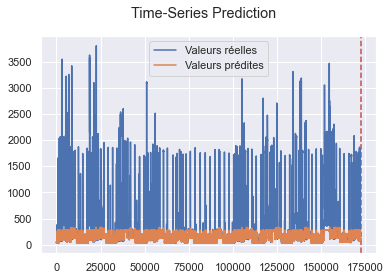

In [94]:
#train_size=len(xtest1)
x=xtest1[:,13]
y=ytest[:,13]
plt.axvline(x=172471, c='r', linestyle='--')

plt.plot(x,label="Valeurs réelles")
plt.plot(y, label="Valeurs prédites")
plt.legend()

plt.suptitle('Time-Series Prediction')
plt.show()